In [43]:
%load_ext autoreload 
%autoreload 2
import cv2
import json, os, cv2
from pathlib import Path
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np
import xarray as xr
import seaborn as sns
import h5py as hf
from tqdm import tqdm
from tqdm import tqdm
import itertools 
from scipy.interpolate import interp1d
from scipy import signal
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.cluster import KMeans
import matplotlib.colors as mcolors
import os, fnmatch
from scipy.spatial.distance import cdist

import sys
sys.path.insert(0, 'C:/Users/nlab/Documents/GitHub/obstacle_avoidance')
#sys.path.append(r'C:\Users\nlab\Documents\GitHub\obstacle_avoidance\plots') # go to parent dir 

from utils.base_functions import *
from src.utils.auxiliary import flatten_series
from src.utils.path import find
from src.base import BaseInput
from plots.plots import plot_oa
#from plots.plots import *
import warnings
warnings.filterwarnings('ignore')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [47]:
light = plot_oa(r"D:\obstacle_avoidance\metadata\compiled_data\G8CK1_G8CK_light.json",'blank')
light.gather_session_df('obstacle',6)

dark = plot_oa(r"D:\obstacle_avoidance\metadata\compiled_data\G8CK1_G8CK_dark.json",'blank')
dark.gather_session_df('obstacle',6)
light_df,dark_df = light.df, dark.df


6
6


In [5]:
def plot_trials_sample(df,sample):
    """Direction by key obstalce trials"""
   
    fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    """Right"""
    panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    plot_arena(df,ax1)
    ax2 = fig.add_subplot(panel_1[0,1])
    plot_arena(df,ax2)
    ax2.set_title('right')
    ax3 = fig.add_subplot(panel_1[1,0])
    plot_arena(df,ax3)
    ax4 = fig.add_subplot(panel_1[1,1])
    plot_arena(df,ax4)
    ax5 = fig.add_subplot(panel_1[2,0])
    plot_arena(df,ax5)
    ax6 = fig.add_subplot(panel_1[2,1])
    plot_arena(df,ax6)
    right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]

    """Left """
    panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
    ax7 = fig.add_subplot(panel_2[0,0])
    plot_arena(df,ax7)
    ax8 = fig.add_subplot(panel_2[0,1])
    plot_arena(df,ax8)
    ax8.set_title('left')
    ax9 = fig.add_subplot(panel_2[1,0])
    plot_arena(df,ax9)
    ax10 = fig.add_subplot(panel_2[1,1])
    plot_arena(df,ax10)
    ax11= fig.add_subplot(panel_2[2,0])
    plot_arena(df,ax11)
    ax12 = fig.add_subplot(panel_2[2,1])
    plot_arena(df,ax12)
    left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]
   
    
    

    """ plot trials"""
    right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
    left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))
    for direction, direction_frame in df.groupby(['odd']):
        for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
            cluster_frame = cluster_frame.sample(sample)
            right_obstacle_axis = right_obstacle_dict.get(cluster)
            left_obstalce_axis = left_obstacle_dict.get(cluster)
            plot_obstacle(cluster_frame,right_obstacle_axis,cluster)
            plot_obstacle(cluster_frame,left_obstalce_axis,cluster)
            right_obstacle_axis.set_title(str(cluster))
            left_obstalce_axis.set_title(str(cluster))
            for ind,row in cluster_frame.iterrows():
                if direction == 'right':
                    which_axis = right_obstacle_dict.get(cluster)
                    which_axis.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)
                if direction == 'left':
                    which_axis = left_obstacle_dict.get(cluster)
                    which_axis.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)
            

In [6]:
def plot_trials_sample_thresh(df,sample,thresh):
    """Direction by key obstalce trials"""
    ts_postition_at_threshold(df,thresh)
   
    fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    """Right"""
    panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    plot_arena(df,ax1)
    ax2 = fig.add_subplot(panel_1[0,1])
    plot_arena(df,ax2)
    ax2.set_title('right')
    ax3 = fig.add_subplot(panel_1[1,0])
    plot_arena(df,ax3)
    ax4 = fig.add_subplot(panel_1[1,1])
    plot_arena(df,ax4)
    ax5 = fig.add_subplot(panel_1[2,0])
    plot_arena(df,ax5)
    ax6 = fig.add_subplot(panel_1[2,1])
    plot_arena(df,ax6)
    right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]

    """Left """
    panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
    ax7 = fig.add_subplot(panel_2[0,0])
    plot_arena(df,ax7)
    ax8 = fig.add_subplot(panel_2[0,1])
    plot_arena(df,ax8)
    ax8.set_title('left')
    ax9 = fig.add_subplot(panel_2[1,0])
    plot_arena(df,ax9)
    ax10 = fig.add_subplot(panel_2[1,1])
    plot_arena(df,ax10)
    ax11= fig.add_subplot(panel_2[2,0])
    plot_arena(df,ax11)
    ax12 = fig.add_subplot(panel_2[2,1])
    plot_arena(df,ax12)
    left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]
   
    
    

    """ plot trials"""
    right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
    left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))
    for direction, direction_frame in df.groupby(['odd']):
        for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
            cluster_frame = cluster_frame.sample(sample)
            right_obstacle_axis = right_obstacle_dict.get(cluster)
            left_obstalce_axis = left_obstacle_dict.get(cluster)
            plot_obstacle(cluster_frame,right_obstacle_axis,cluster)
            plot_obstacle(cluster_frame,left_obstalce_axis,cluster)
            right_obstacle_axis.set_title(str(cluster))
            left_obstalce_axis.set_title(str(cluster))
            for ind,row in cluster_frame.iterrows():
                if direction == 'right':
                    which_axis = right_obstacle_dict.get(cluster)
                    if row['start']=='top':
                        which_axis.plot(row['ts_nose_x_cm_' + str(thresh)],row['ts_nose_y_cm_' + str(thresh)],alpha = .5,color = 'blue')
                    if row['start']=='bottom':
                        which_axis.plot(row['ts_nose_x_cm_' + str(thresh)],row['ts_nose_y_cm_' + str(thresh)],alpha = .5,color = 'red')
                if direction == 'left':
                    which_axis = left_obstacle_dict.get(cluster)
                    if row['start']=='top':
                        which_axis.plot(row['ts_nose_x_cm_' + str(thresh)],row['ts_nose_y_cm_' + str(thresh)],alpha = .5,color = 'blue')
                    if row['start']=='bottom':
                        which_axis.plot(row['ts_nose_x_cm_' + str(thresh)],row['ts_nose_y_cm_' + str(thresh)],alpha = .5,color = 'red')

In [7]:
def compare_trials(df1,df2,cluster_num,sample_num):
    """compare trials from two dataframes. Inputs df1(light):dataframe , df2(dark):dataframe, cluster_num:int,sample_num:int
    """
    light_df = df1[df1['obstacle_cluster']==cluster_num]
    dark_df = df2[df2['obstacle_cluster']==cluster_num]

    fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)


    """df1:light """
    panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    plot_arena(df1,ax1)
    ax2 = fig.add_subplot(panel_1[1,0])
    plot_arena(df1,ax2)

    right_axs = [ax1,ax2]

    """df2:dark """
    panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
    ax3 = fig.add_subplot(panel_2[0,0])
    plot_arena(df2,ax3)
    ax4 = fig.add_subplot(panel_2[1,0])
    plot_arena(df2,ax4)

    left_axs = [ax3,ax4]
    

    """plot trials light"""
    for direction, direction_frame in light_df.groupby(['odd']):
        if direction == 'right':
            plot_obstacle(direction_frame,ax1,cluster_num)
            sample_frame = direction_frame.sample(sample_num)
            for ind,row in sample_frame.iterrows():
                ax1.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)
            
        else:    
            plot_obstacle(direction_frame,ax2,cluster_num)
            sample_frame = direction_frame.sample(sample_num)
            for ind,row in sample_frame.iterrows():
                ax2.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)
        
    
    """plot trials dark"""
    for direction, direction_frame in dark_df.groupby(['odd']):
        if direction == 'right':
            plot_obstacle(direction_frame,ax3,cluster_num)
            sample_frame = direction_frame.sample(sample_num)
            for ind,row in sample_frame.iterrows():
                ax3.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)
        else:    
            plot_obstacle(direction_frame,ax4,cluster_num)
            sample_frame = direction_frame.sample(sample_num)
            for ind,row in sample_frame.iterrows():
                ax4.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)

def plot_single_cluster(df,key,cluster_num,sample_num):
    """plots n trails from single cluster colored by key variable
       inputs(df:dataframe, key:column name string,num_sample:int)
    """
    color_map = create_color_dict(df,key,'dark')
    fig = plt.figure(constrained_layout=False, figsize=(12, 4),dpi=90)
    #fig.suptitle('by ' + key + ' '+ 'and ' +'obstalce ')
    spec2 = gridspec.GridSpec(ncols=1, nrows=1, figure=fig)
    panel_1 = gridspec.GridSpecFromSubplotSpec(1,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    plot_arena(df,ax1)
    ax2 = fig.add_subplot(panel_1[0,1])
    plot_arena(df,ax2)
    markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
    ax1.legend(markers, color_map.keys(), numpoints=1,title = 'right')
    for direction, direction_frame in df.groupby(['odd']):
        if direction == 'right':
            cluster_frame_right = direction_frame[direction_frame['obstacle_cluster']==cluster_num].sample(sample_num)
            #print(cluster_frame_right.gt_obstacleTR_y_cm,np.mean(cluster_frame_right.gt_obstacleTR_y_cm))
            plot_obstacle(cluster_frame_right,ax1,cluster_num)
            for ind,row in cluster_frame_right.iterrows():
                color = color_map.get(pd.unique(row[key]).item())
                ax1.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = color,alpha = .5)
        else:
            cluster_frame_left = direction_frame[direction_frame['obstacle_cluster']==cluster_num].sample(sample_num)
            plot_obstacle(cluster_frame_left,ax2,cluster_num)
            for ind,row in cluster_frame_left.iterrows():
                color = color_map.get(pd.unique(row[key]).item())
                ax2.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = color,alpha = .5)
    #print(cluster_frame_right.gt_obstacleTR_y_cm,np.mean(cluster_frame_righ

def calculate_distances(x_points, y_points, x_reference, y_reference):
    """
    Calculate the distances of a set of (x, y) points from a reference point.

    Args:
        x_points (array-like): Array of x-coordinates of the points.
        y_points (array-like): Array of y-coordinates of the points.
        x_reference (float): The x-coordinate of the reference point.
        y_reference (float): The y-coordinate of the reference point.

    Returns:
        list: List of distances from the reference point to each point in the set.
    """
    # Convert input arrays to NumPy arrays
    x_points = np.array(x_points)
    y_points = np.array(y_points)

    # Calculate the distances
    distances = np.sqrt((x_points - x_reference)**2 + (y_points - y_reference)**2)

    return distances




In [8]:
def compare_trials(df1,df2,cluster_num,sample_num):
    """compare trials from two dataframes. Inputs df1(light):dataframe , df2(dark):dataframe, cluster_num:int,sample_num:int
    """
    light_df = df1[df1['obstacle_cluster']==cluster_num]
    dark_df = df2[df2['obstacle_cluster']==cluster_num]

    fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)


    """df1:light """
    panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    plot_arena(df1,ax1)
    ax2 = fig.add_subplot(panel_1[1,0])
    plot_arena(df1,ax2)

    right_axs = [ax1,ax2]

    """df2:dark """
    panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
    ax3 = fig.add_subplot(panel_2[0,0])
    plot_arena(df2,ax3)
    ax4 = fig.add_subplot(panel_2[1,0])
    plot_arena(df2,ax4)

    left_axs = [ax3,ax4]
    

    """plot trials light"""
    for direction, direction_frame in light_df.groupby(['odd']):
        if direction == 'right':
            plot_obstacle(direction_frame,ax1,cluster_num)
            sample_frame = direction_frame.sample(sample_num)
            for ind,row in sample_frame.iterrows():
                ax1.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)
            
        else:    
            plot_obstacle(direction_frame,ax2,cluster_num)
            sample_frame = direction_frame.sample(sample_num)
            for ind,row in sample_frame.iterrows():
                ax2.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)
        
    
    """plot trials dark"""
    for direction, direction_frame in dark_df.groupby(['odd']):
        if direction == 'right':
            plot_obstacle(direction_frame,ax3,cluster_num)
            sample_frame = direction_frame.sample(sample_num)
            for ind,row in sample_frame.iterrows():
                ax3.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)
        else:    
            plot_obstacle(direction_frame,ax4,cluster_num)
            sample_frame = direction_frame.sample(sample_num)
            for ind,row in sample_frame.iterrows():
                ax4.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)

def plot_single_cluster(df,key,cluster_num,sample_num):
    """plots n trails from single cluster colored by key variable
       inputs(df:dataframe, key:column name string,num_sample:int)
    """
    color_map = create_color_dict(df,key,'dark')
    fig = plt.figure(constrained_layout=False, figsize=(12, 4),dpi=90)
    #fig.suptitle('by ' + key + ' '+ 'and ' +'obstalce ')
    spec2 = gridspec.GridSpec(ncols=1, nrows=1, figure=fig)
    panel_1 = gridspec.GridSpecFromSubplotSpec(1,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    plot_arena(df,ax1)
    ax2 = fig.add_subplot(panel_1[0,1])
    plot_arena(df,ax2)
    markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
    ax1.legend(markers, color_map.keys(), numpoints=1,title = 'right')
    for direction, direction_frame in df.groupby(['odd']):
        if direction == 'right':
            cluster_frame_right = direction_frame[direction_frame['obstacle_cluster']==cluster_num].sample(sample_num)
            #print(cluster_frame_right.gt_obstacleTR_y_cm,np.mean(cluster_frame_right.gt_obstacleTR_y_cm))
            plot_obstacle(cluster_frame_right,ax1,cluster_num)
            for ind,row in cluster_frame_right.iterrows():
                color = color_map.get(pd.unique(row[key]).item())
                ax1.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = color,alpha = .5)
        else:
            cluster_frame_left = direction_frame[direction_frame['obstacle_cluster']==cluster_num].sample(sample_num)
            plot_obstacle(cluster_frame_left,ax2,cluster_num)
            for ind,row in cluster_frame_left.iterrows():
                color = color_map.get(pd.unique(row[key]).item())
                ax2.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = color,alpha = .5)
    #print(cluster_frame_right.gt_obstacleTR_y_cm,np.mean(cluster_frame_right.gt_obstacleTR_y_cm))
    return cluster_frame_right,cluster_frame_left

def calculate_slope(x1, y1, x2, y2):
    # Check for division by zero (vertical line)
    if np.isclose(x2, x1, rtol=1e-6):
        raise ValueError("The line is vertical, and the slope is undefined.")
    
    # Create NumPy arrays for the points
    point1 = np.array([x1, y1])
    point2 = np.array([x2, y2])
    
    # Calculate the slope using NumPy operations
    slope = (point2[1] - point1[1]) / (point2[0] - point1[0])
    
    return slope

def calculate_speed(x_positions, y_positions, fps):
    # Calculate the change in positions between frames
    delta_x = np.diff(x_positions)
    delta_y = np.diff(y_positions)
    
    # Calculate the Euclidean distance between consecutive positions
    distance = np.sqrt(delta_x**2 + delta_y**2)
    
    # Calculate the time interval between frames
    time_interval = 1 / fps
    
    # Calculate the speed in cm/s
    speed = distance / time_interval
    
    return speed,distance


def calculate_slope(x1, y1, x2, y2):
    # Check for division by zero (vertical line)
    if x1 == x2:
        raise ValueError("The line is vertical, and the slope is undefined.")
    
    # Calculate the slope using the formula
    slope = (y2 - y1) / (x2 - x1)
    
    return slope
def angle_between_vectors(vector1, vector2):
    # Convert input lists to NumPy arrays for vector operations
    vector1 = np.array(vector1)
    vector2 = np.array(vector2)
    
    # Calculate the dot product of the two vectors
    dot_product = np.dot(vector1, vector2)
    
    # Calculate the magnitudes (norms) of each vector
    magnitude1 = np.linalg.norm(vector1)
    magnitude2 = np.linalg.norm(vector2)
    
    # Calculate the cosine of the angle between the vectors
    cosine_angle = dot_product / (magnitude1 * magnitude2)
    
    # Use arccosine to calculate the angle in radians
    angle_radians = np.arccos(cosine_angle)
    
    # Calculate the angle in degrees
    angle_degrees = np.degrees(angle_radians)
    
    return angle_radians, angle_degrees



def create_vector_from_origin(slope, magnitude=1):
    x_component = 1
    y_component = slope * x_component
    vector_magnitude = magnitude
    scaling_factor = vector_magnitude / ((x_component**2 + y_component**2)**0.5)
    x_component *= scaling_factor
    y_component *= scaling_factor
    return [x_component, y_component]



def get_head_angle(df):
    for ind, row in df.iterrows():
        leftear_x = row['ts_leftear_x_cm']
        leftear_y = row['ts_leftear_y_cm']
        rightear_x = row['ts_rightear_x_cm']
        rightear_y = row['ts_rightear_y_cm']
        nose_x = row['ts_nose_x_cm']
        nose_y = row['ts_nose_y_cm']
        angs = []
        for step in range(len(leftear_x)):
            #ang = np.arctan2(np.mean([leftear_y[step],rightear_y[step]])-nose_y[step],np.mean([leftear_x[step],rightear_x[step]])-nose_x[step])
            ang = np.arctan2(nose_y[step]-np.mean([leftear_y[step],rightear_y[step]]),nose_x[step]-np.mean([leftear_x[step],rightear_x[step]]))
            angs.append(ang)
        df.at[ind, 'head_angle'] = np.array(angs).astype(object)

def calculate_angular_velocities(angle_series, time_series):
    """
    Calculate angular velocities in radians per second for a time series of angles.

    Args:
    angle_series (numpy.ndarray): Array of angular positions in radians over time.
    time_series (numpy.ndarray): Array of time values corresponding to each angle in seconds.

    Returns:
    numpy.ndarray: Array of angular velocities in radians per second.
    """
    if len(angle_series) != len(time_series):
        raise ValueError("Length of angle_series and time_series must be the same.")
    
    # Calculate the difference in angles between consecutive time steps
    angular_displacements = np.diff(angle_series)
    
    # Calculate the time differences between consecutive time steps
    time_diffs = np.diff(time_series)
    
    # Calculate angular velocities by dividing angular displacements by time differences
    angular_velocities = angular_displacements / time_diffs
    
    return angular_velocities



In [12]:
def plot_ypostion_histogram_sample(df,thresh,bin_num,label):
    """Direction by key obstalce trials"""
    calc_y_at_cm_threshhold(df,thresh)
    fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    """Right"""
    panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    ax2 = fig.add_subplot(panel_1[0,1])
    ax3 = fig.add_subplot(panel_1[1,0])
    ax4 = fig.add_subplot(panel_1[1,1])
    ax5 = fig.add_subplot(panel_1[2,0])
    ax6 = fig.add_subplot(panel_1[2,1])
    right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]

    """Left """
    panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
    ax7 = fig.add_subplot(panel_2[0,0])
    ax8 = fig.add_subplot(panel_2[0,1])
    ax9 = fig.add_subplot(panel_2[1,0])
    ax10 = fig.add_subplot(panel_2[1,1])
    ax11= fig.add_subplot(panel_2[2,0])
    ax12 = fig.add_subplot(panel_2[2,1])
    left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]
    """ plot histogram"""
    right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
    left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))

    

    for direction, direction_frame in df.groupby(['odd']):
        for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
            num_close_top = cluster_frame.loc[(cluster_frame['start']=='top')]
            num_close_bottom = cluster_frame.loc[(cluster_frame['start']=='bottom')]
        
            if direction == 'right':
                right_obstacle_axis = right_obstacle_dict.get(cluster)
                right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                #right_obstacle_axis.hist(np.concatenate(num_close_top['y_pos_at_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                #right_obstacle_axis.hist(np.concatenate(num_close_bottom['y_pos_at_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                right_obstacle_axis.hist(num_close_top['y_pos_at_'+str(thresh)].to_numpy().ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                right_obstacle_axis.hist(num_close_bottom['y_pos_at_'+str(thresh)].to_numpy().ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)


                right_obstacle_axis.axvline(num_close_top['mean_gt_obstacleBL_y_cm'].unique(), color='k', linestyle='dashed', linewidth=1,label = 'obstacle edge')
                right_obstacle_axis.axvline(num_close_top['mean_gt_obstacleTL_y_cm'].unique(), color='k', linestyle='dashed', linewidth=1)
                right_obstacle_axis.axvline(num_close_bottom['mean_gt_obstacleBL_y_cm'].unique(), color='k', linestyle='dashed', linewidth=1)
                right_obstacle_axis.axvline(num_close_bottom['mean_gt_obstacleTL_y_cm'].unique(), color='k', linestyle='dashed', linewidth=1)
                right_obstacle_axis.set_xlim([8, 34])
                right_obstacle_axis.set_xlabel('cm')
                right_obstacle_axis.legend( loc='upper right')
                

                
            if direction == 'left':
                left_obstacle_axis = left_obstacle_dict.get(cluster)
                left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                #left_obstacle_axis.hist(np.concatenate(num_close_top['y_pos_at_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                #left_obstacle_axis.hist(np.concatenate(num_close_bottom['y_pos_at_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                left_obstacle_axis.hist(num_close_top['y_pos_at_'+str(thresh)].to_numpy().ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                left_obstacle_axis.hist(num_close_bottom['y_pos_at_'+str(thresh)].to_numpy().ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                left_obstacle_axis.axvline(num_close_top['mean_gt_obstacleBL_y_cm'].unique(), color='k', linestyle='dashed', linewidth=1,label = 'obstacle edge')
                left_obstacle_axis.axvline(num_close_top['mean_gt_obstacleTL_y_cm'].unique(), color='k', linestyle='dashed', linewidth=1)
                left_obstacle_axis.axvline(num_close_bottom['mean_gt_obstacleBL_y_cm'].unique(), color='k', linestyle='dashed', linewidth=1)
                left_obstacle_axis.axvline(num_close_bottom['mean_gt_obstacleTL_y_cm'].unique(), color='k', linestyle='dashed', linewidth=1)
                left_obstacle_axis.set_xlim([8, 34])
                left_obstacle_axis.set_xlabel('cm')
                left_obstacle_axis.legend( loc='upper right')
                



def calc_y_at_cm_threshhold(df,thresh):
    '''find the y values of nose when the mouse is between the wall edge and somethreshold'''
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        #if direction == 'right':
                        #    y_pos =  row['ts_nose_y_cm'][np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+ (-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+ (thresh+1))))]
                        #    df.at[ind,'y_pos_at_'+str(thresh)] = y_pos.astype(object)
    #
                        #if direction == 'left':
                        #    y_pos =  row['ts_nose_y_cm'][np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']- ( 1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']- (thresh+1))))]
                        #    df.at[ind,'y_pos_at_'+str(thresh)] = y_pos.astype(object)

                        if direction == 'right':
                            y_pos =  row['ts_nose_y_cm'][np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+ (thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+ (thresh+1))))]
                            
                            try:
                                 df.at[ind,'y_pos_at_'+str(thresh)] = y_pos[0]
                            except IndexError:
                                 
                                df.at[ind,'y_pos_at_'+str(thresh)] = np.nan
    
                        if direction == 'left':
                            y_pos =  row['ts_nose_y_cm'][np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']- (thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']- (thresh+1))))]
                            try:
                                 df.at[ind,'y_pos_at_'+str(thresh)] = y_pos[0]
                            except IndexError:
                                 
                                df.at[ind,'y_pos_at_'+str(thresh)] = np.nan



  
def ts_postition_at_threshold(df,thresh):
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))
                                thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                thresh_nose_y = row['ts_nose_y_cm'][pos_inds]                                
                                df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
                                #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                            if cluster == 2 or cluster == 3:
                                   if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))                           
                                        thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                        thresh_nose_y = row['ts_nose_y_cm'][pos_inds]
                                        df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                        df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                        df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
                                       
                                        
                                   if row['start'] == 'bottom':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))                    
                                        thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                        thresh_nose_y = row['ts_nose_y_cm'][pos_inds]
                                        df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                        df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                        df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
                                       
                                        
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))
                                thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                thresh_nose_y = row['ts_nose_y_cm'][pos_inds]                                
                                df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
                        if direction == 'left':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                thresh_nose_y = row['ts_nose_y_cm'][pos_inds]                                
                                df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
                                 
                            if cluster == 2 or cluster == 3:
                                 if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                        thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                        thresh_nose_y = row['ts_nose_y_cm'][pos_inds]
                                        df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                        df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                        df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object) 
                                       
                                 
                                        
                                 if row['start'] == 'bottom':
                                        pos_inds =   np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                        thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                        thresh_nose_y = row['ts_nose_y_cm'][pos_inds]
                                        df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                        df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                        df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
                                       
                                 
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                thresh_nose_y = row['ts_nose_y_cm'][pos_inds]                                
                                df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
            
            

In [9]:
def plot_distance_to_corner_histogram_sample(df,thresh,bin_num,label):
    """Direction by key obstalce trials"""
    distance_to_open_corner(df,thresh)
    distance_to_closed_corner(df,thresh)
    fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    """Right"""
    panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    ax2 = fig.add_subplot(panel_1[0,1])
    ax3 = fig.add_subplot(panel_1[1,0])
    ax4 = fig.add_subplot(panel_1[1,1])
    ax5 = fig.add_subplot(panel_1[2,0])
    ax6 = fig.add_subplot(panel_1[2,1])
    right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]

    """Left """
    panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
    ax7 = fig.add_subplot(panel_2[0,0])
    ax8 = fig.add_subplot(panel_2[0,1])
    ax9 = fig.add_subplot(panel_2[1,0])
    ax10 = fig.add_subplot(panel_2[1,1])
    ax11= fig.add_subplot(panel_2[2,0])
    ax12 = fig.add_subplot(panel_2[2,1])
    left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]
    """ plot histogram"""
    right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
    left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))

   

    for direction, direction_frame in df.groupby(['odd']):
        for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
            for start, start_frame in cluster_frame.groupby(['start']):
                if cluster == 0 or cluster ==1:
                    if direction == 'right' and start == 'top' :
                        
                        right_obstacle_axis = right_obstacle_dict.get(cluster)
                        right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                        #right_obstacle_axis.hist(np.concatenate(start_frame['distance_from_open_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(start_frame['distance_from_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)

                        right_obstacle_axis.hist(start_frame['distance_from_open_corner_'+str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.hist(start_frame['distance_from_closed_corner_'+str(thresh)].to_numpy().ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                      

                        #right_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.set_xlabel('cm')
                        right_obstacle_axis.set_xlim([0, 20])
                        right_obstacle_axis.legend( loc='upper right')
                    if direction == 'right' and start == 'bottom':
                        continue




                    if direction == 'left'  and start == 'top':
                        left_obstacle_axis = left_obstacle_dict.get(cluster)
                        left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                        #left_obstacle_axis.hist(np.concatenate(start_frame['distance_from_open_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(start_frame['distance_from_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)

                        left_obstacle_axis.hist(start_frame['distance_from_open_corner_'+str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.hist(start_frame['distance_from_closed_corner_'+str(thresh)].to_numpy().ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.set_xlabel('cm')
                        left_obstacle_axis.set_xlim([0, 20])
                        left_obstacle_axis.legend( loc='upper right')
                    if direction == 'left' and start == 'bottom':
                        continue

                if cluster == 2 or cluster == 3:
                    if direction == 'right' and start == 'top':
                        continue
                    if direction == 'right':
                        right_obstacle_axis = right_obstacle_dict.get(cluster)
                        right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                        #right_obstacle_axis.hist(np.concatenate(cluster_frame['distance_from_open_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='facing',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(cluster_frame['distance_from_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='non facing',alpha = .5,bins=bin_num,density = True)

                        right_obstacle_axis.hist(start_frame['distance_from_open_corner_'+str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.hist(start_frame['distance_from_closed_corner_'+str(thresh)].to_numpy().ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)

                        #right_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.set_xlabel('cm')
                        right_obstacle_axis.set_xlim([0, 20])
                        right_obstacle_axis.legend( loc='upper right')


                    if direction == 'left' and start == 'top':
                        continue
                    if direction == 'left':
                        left_obstacle_axis = left_obstacle_dict.get(cluster)
                        left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                        #left_obstacle_axis.hist(np.concatenate(start_frame['distance_from_open_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='facing',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(start_frame['distance_from_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='non facing',alpha = .5,bins=bin_num,density = True)

                        left_obstacle_axis.hist(start_frame['distance_from_open_corner_'+str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.hist(start_frame['distance_from_closed_corner_'+str(thresh)].to_numpy().ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.set_xlabel('cm')
                        left_obstacle_axis.set_xlim([0, 20])
                        left_obstacle_axis.legend( loc='upper right')
                if cluster == 4 or cluster == 5:
                    


                    if direction == 'right' and start == 'bottom':
                        right_obstacle_axis = right_obstacle_dict.get(cluster)
                        right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                        #right_obstacle_axis.hist(np.concatenate(num_close_top['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(start_frame['distance_from_open_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(start_frame['distance_from_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)

                        right_obstacle_axis.hist(start_frame['distance_from_open_corner_'+str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.hist(start_frame['distance_from_closed_corner_'+str(thresh)].to_numpy().ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.set_xlabel('cm')
                        right_obstacle_axis.set_xlim([0, 20])
                        right_obstacle_axis.legend( loc='upper right')
                    if direction == 'right' and start == 'top':
                        continue



                    if direction == 'left' and start == 'bottom':
                        left_obstacle_axis = left_obstacle_dict.get(cluster)
                        left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                        #left_obstacle_axis.hist(np.concatenate(num_close_top['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(start_frame['distance_from_open_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(start_frame['distance_from_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)

                        left_obstacle_axis.hist(start_frame['distance_from_open_corner_'+str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.hist(start_frame['distance_from_closed_corner_'+str(thresh)].to_numpy().ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.set_xlabel('cm')
                        left_obstacle_axis.set_xlim([0, 20])
                        left_obstacle_axis.legend( loc='upper right')
                    if direction == 'left' and start == 'top':
                        continue

def distance_to_open_corner(df,thresh):
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+ (thresh+1)))&(row['ts_nose_y_cm'] <(row['gt_obstacleBR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBR_x_cm']
                                corner_y = row['gt_obstacleBR_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                try:
                                 df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                except IndexError:
                                    df.at[ind,'distance_from_open_corner_' + str(thresh)] = np.nan
                                #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]

                                #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                            if cluster == 2 or cluster == 3:
                                   if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+ (thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTR_x_cm']
                                        corner_y = row['gt_obstacleTR_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        try:
                                            df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                        except IndexError:
                                            df.at[ind,'distance_from_open_corner_' + str(thresh)] = np.nan
                                        #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                        #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                       
                                        
                                   if row['start'] == 'bottom':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+ (thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBR_x_cm']
                                        corner_y = row['gt_obstacleBR_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                        try:
                                            df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                        except IndexError:
                                            df.at[ind,'distance_from_open_corner_' + str(thresh)] = np.nan
                                        #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]

                                       
                                        
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+ (thresh+1)))&(row['ts_nose_y_cm'] >(row['gt_obstacleTR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTR_x_cm']
                                corner_y = row['gt_obstacleTR_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                try:
                                    df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                except IndexError:
                                    df.at[ind,'distance_from_open_corner_' + str(thresh)] = np.nan
                                #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                 
                        if direction == 'left':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1)))&(row['ts_nose_y_cm'] <(row['gt_obstacleBL_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBL_x_cm']
                                corner_y = row['gt_obstacleBL_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                try:
                                    df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                except IndexError:
                                    df.at[ind,'distance_from_open_corner_' + str(thresh)] = np.nan
                                #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                 
                            if cluster == 2 or cluster == 3:
                                 if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTL_x_cm']
                                        corner_y = row['gt_obstacleTL_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                        try:
                                            df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                        except IndexError:
                                            df.at[ind,'distance_from_open_corner_' + str(thresh)] = np.nan

                                        #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                 
                                        
                                 if row['start'] == 'bottom':
                                        pos_inds =   np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBL_x_cm']
                                        corner_y = row['gt_obstacleBL_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                        try:
                                            df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                        except IndexError:
                                            df.at[ind,'distance_from_open_corner_' + str(thresh)] = np.nan
                                        #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                 
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1)))&(row['ts_nose_y_cm'] >row['gt_obstacleTL_y_cm']))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTL_x_cm']
                                corner_y = row['gt_obstacleTL_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                #df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                try:
                                    df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances[0]
                                except IndexError:
                                    df.at[ind,'distance_from_open_corner_' + str(thresh)] = np.nan
                                
def distance_to_closed_corner(df,thresh):
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+ (thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1)))&(row['ts_nose_y_cm'] <(row['gt_obstacleBR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTR_x_cm']
                                corner_y = row['gt_obstacleTR_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                                #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                try:
                                    df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                except IndexError:
                                    df.at[ind,'distance_from_closed_corner_' + str(thresh)] = np.nan

                            if cluster == 2 or cluster == 3:
                                   if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+ (thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBR_x_cm']
                                        corner_y = row['gt_obstacleBR_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                                        #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                        try:
                                            df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                        except IndexError:
                                            df.at[ind,'distance_from_closed_corner_' + str(thresh)] = np.nan
                                        
                                       
                                        
                                   if row['start'] == 'bottom':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+ (thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTR_x_cm']
                                        corner_y = row['gt_obstacleTR_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                                        #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                        try:
                                            df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                        except IndexError:
                                            df.at[ind,'distance_from_closed_corner_' + str(thresh)] = np.nan
                                        
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+ (thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1)))&(row['ts_nose_y_cm'] >(row['gt_obstacleTR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBR_x_cm']
                                corner_y = row['gt_obstacleBR_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                                #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                try:
                                    df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                except IndexError:
                                    df.at[ind,'distance_from_closed_corner_' + str(thresh)] = np.nan
                            
                                 
                        if direction == 'left':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1)))&(row['ts_nose_y_cm'] <(row['gt_obstacleBL_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTL_x_cm']
                                corner_y = row['gt_obstacleTL_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                                #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                try:
                                    df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                except IndexError:
                                    df.at[ind,'distance_from_closed_corner_' + str(thresh)] = np.nan
                            if cluster == 2 or cluster == 3:
                                 if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBL_x_cm']
                                        corner_y = row['gt_obstacleBL_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                                        #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                        try:
                                            df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                        except IndexError:
                                            df.at[ind,'distance_from_closed_corner_' + str(thresh)] = np.nan
                                        
                                 if row['start'] == 'bottom':
                                        pos_inds =   np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTL_x_cm']
                                        corner_y = row['gt_obstacleTL_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                                        #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                        try:
                                            df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                        except IndexError:
                                            df.at[ind,'distance_from_closed_corner_' + str(thresh)] = np.nan
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1)))&(row['ts_nose_y_cm'] >row['gt_obstacleTL_y_cm']))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBL_x_cm']
                                corner_y = row['gt_obstacleBL_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                                #df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                try:
                                    df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances[0]
                                except IndexError:
                                    df.at[ind,'distance_from_closed_corner_' + str(thresh)] = np.nan

In [11]:
def plot_distance_from_corner_histogram_sample(df,thresh,bin_num,label):
    """Direction by key obstalce trials"""
    distance_to_open_corner(df,thresh)
    distance_to_closed_corner(df,thresh)
    fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    """Right"""
    panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    ax2 = fig.add_subplot(panel_1[0,1])
    ax3 = fig.add_subplot(panel_1[1,0])
    ax4 = fig.add_subplot(panel_1[1,1])
    ax5 = fig.add_subplot(panel_1[2,0])
    ax6 = fig.add_subplot(panel_1[2,1])
    right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]

    """Left """
    panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
    ax7 = fig.add_subplot(panel_2[0,0])
    ax8 = fig.add_subplot(panel_2[0,1])
    ax9 = fig.add_subplot(panel_2[1,0])
    ax10 = fig.add_subplot(panel_2[1,1])
    ax11= fig.add_subplot(panel_2[2,0])
    ax12 = fig.add_subplot(panel_2[2,1])
    left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]
    """ plot histogram"""
    right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
    left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))

    num_close_top = df.loc[(df['obstacle_cluster'] ==0) & (df['start']=='top')&(df['odd'] =='right')]
    num_close_bottom = df.loc[(df['obstacle_cluster'] ==0) & (df['start']=='bottom')&(df['odd'] =='right')]

    for direction, direction_frame in df.groupby(['odd']):
        for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
            if cluster == 2 or cluster ==3:
                if direction == 'right':
                    right_obstacle_axis = right_obstacle_dict.get(cluster)
                    right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                    right_obstacle_axis.hist(np.concatenate(cluster_frame['distance_from_open_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                    right_obstacle_axis.hist(np.concatenate(cluster_frame['distance_from_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)

                    #right_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                    right_obstacle_axis.set_xlabel('cm')
                    right_obstacle_axis.legend( loc='upper right')
                

                
                if direction == 'left':
                    left_obstacle_axis = left_obstacle_dict.get(cluster)
                    left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                    left_obstacle_axis.hist(np.concatenate(cluster_frame['distance_from_open_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                    left_obstacle_axis.hist(np.concatenate(cluster_frame['distance_from_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                    #left_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                    left_obstacle_axis.set_xlabel('cm')
                    left_obstacle_axis.legend( loc='upper right')
                
            if cluster == 0 or cluster == 1:
                num_close_top = cluster_frame.loc[(cluster_frame['start']=='top')]
                if direction == 'right':
                    right_obstacle_axis = right_obstacle_dict.get(cluster)
                    right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                    right_obstacle_axis.hist(np.concatenate(num_close_top['distance_from_open_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                    right_obstacle_axis.hist(np.concatenate(num_close_top['distance_from_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)

                    #right_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                    right_obstacle_axis.set_xlabel('cm')
                    right_obstacle_axis.legend( loc='upper right')
                

                
                if direction == 'left':
                    left_obstacle_axis = left_obstacle_dict.get(cluster)
                    left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                    left_obstacle_axis.hist(np.concatenate(num_close_top['distance_from_open_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                    left_obstacle_axis.hist(np.concatenate(num_close_top['distance_from_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                    #left_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                    left_obstacle_axis.set_xlabel('cm')
                    left_obstacle_axis.legend( loc='upper right')
            if cluster == 4 or cluster == 5:
                num_close_bottom = cluster_frame.loc[(cluster_frame['start']=='bottom')]
    
        
                if direction == 'right':
                    right_obstacle_axis = right_obstacle_dict.get(cluster)
                    right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                    #right_obstacle_axis.hist(np.concatenate(num_close_top['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                    right_obstacle_axis.hist(np.concatenate(num_close_bottom['distance_from_open_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                    right_obstacle_axis.hist(np.concatenate(num_close_top['distance_from_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                    right_obstacle_axis.set_xlabel('cm')
                    right_obstacle_axis.legend( loc='upper right')



                if direction == 'left':
                    left_obstacle_axis = left_obstacle_dict.get(cluster)
                    left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                    #left_obstacle_axis.hist(np.concatenate(num_close_top['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                    left_obstacle_axis.hist(np.concatenate(num_close_bottom['distance_from_open_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                    left_obstacle_axis.hist(np.concatenate(num_close_top['distance_from_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                    left_obstacle_axis.set_xlabel('cm')
                    left_obstacle_axis.legend( loc='upper right')

In [46]:
def plot_angle_to_corner_histogram_sample(df,thresh,bin_num,label):
    """Direction by key obstalce trials"""
    angle_to_open_corner(df,thresh)
    angle_to_closed_corner(df,thresh)
    fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    """Right"""
    panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    ax2 = fig.add_subplot(panel_1[0,1])
    ax3 = fig.add_subplot(panel_1[1,0])
    ax4 = fig.add_subplot(panel_1[1,1])
    ax5 = fig.add_subplot(panel_1[2,0])
    ax6 = fig.add_subplot(panel_1[2,1])
    right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]

    """Left """
    panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
    ax7 = fig.add_subplot(panel_2[0,0])
    ax8 = fig.add_subplot(panel_2[0,1])
    ax9 = fig.add_subplot(panel_2[1,0])
    ax10 = fig.add_subplot(panel_2[1,1])
    ax11= fig.add_subplot(panel_2[2,0])
    ax12 = fig.add_subplot(panel_2[2,1])
    left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]
    """ plot histogram"""
    right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
    left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))

   

    for direction, direction_frame in df.groupby(['odd']):
        for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
            for start, start_frame in cluster_frame.groupby(['start']):
                if cluster == 0 or cluster ==1:
                    if direction == 'right' and start == 'top' :
                        
                        right_obstacle_axis = right_obstacle_dict.get(cluster)
                        right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                        #right_obstacle_axis.hist(np.concatenate(start_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(start_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.hist(start_frame['angle_to_corner_at_'+str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.hist(start_frame['angle_to_closed_corner_at_'+str(thresh)].to_numpy().ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                      

                        #right_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.set_xlabel('deg')
                        right_obstacle_axis.set_xlim([0, 180])
                        right_obstacle_axis.legend( loc='upper right')
                    if direction == 'right' and start == 'bottom':
                        continue




                    if direction == 'left'  and start == 'top':
                        left_obstacle_axis = left_obstacle_dict.get(cluster)
                        left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                        #left_obstacle_axis.hist(np.concatenate(start_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(start_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)+L
                        left_obstacle_axis.hist(start_frame['angle_to_corner_at_'+str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.hist(start_frame['angle_to_closed_corner_at_'+str(thresh)].to_numpy().ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.set_xlabel('deg')
                        left_obstacle_axis.set_xlim([0, 180])
                        left_obstacle_axis.legend( loc='upper right')
                    if direction == 'left' and start == 'bottom':
                        continue

                if cluster == 2 or cluster == 3:
                    if direction == 'right' and start == 'top':
                        continue
                    if direction == 'right':
                        right_obstacle_axis = right_obstacle_dict.get(cluster)
                        right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                        #right_obstacle_axis.hist(np.concatenate(cluster_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='facing',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(cluster_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='non facing',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.hist(start_frame['angle_to_corner_at_'+str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.hist(start_frame['angle_to_closed_corner_at_'+str(thresh)].to_numpy().ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                        

                        #right_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.set_xlabel('deg')
                        right_obstacle_axis.set_xlim([0, 180])
                        right_obstacle_axis.legend( loc='upper right')


                    if direction == 'left' and start == 'top':
                        continue
                    if direction == 'left':
                        left_obstacle_axis = left_obstacle_dict.get(cluster)
                        left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                        #left_obstacle_axis.hist(np.concatenate(start_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='facing',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(start_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='non facing',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.hist(start_frame['angle_to_corner_at_'+str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.hist(start_frame['angle_to_closed_corner_at_'+str(thresh)].to_numpy().ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)

                        
                        #left_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.set_xlabel('deg')
                        left_obstacle_axis.set_xlim([0, 180])
                        left_obstacle_axis.legend( loc='upper right')
                if cluster == 4 or cluster == 5:
                    


                    if direction == 'right' and start == 'bottom':
                        right_obstacle_axis = right_obstacle_dict.get(cluster)
                        right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                        #right_obstacle_axis.hist(np.concatenate(num_close_top['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(start_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(start_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)

                        right_obstacle_axis.hist(start_frame['angle_to_corner_at_'+str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.hist(start_frame['angle_to_closed_corner_at_'+str(thresh)].to_numpy().ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.set_xlabel('deg')
                        right_obstacle_axis.set_xlim([0, 180])
                        right_obstacle_axis.legend( loc='upper right')
                    if direction == 'right' and start == 'top':
                        continue



                    if direction == 'left' and start == 'bottom':
                        left_obstacle_axis = left_obstacle_dict.get(cluster)
                        left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                        #left_obstacle_axis.hist(np.concatenate(num_close_top['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(start_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(start_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)

                        left_obstacle_axis.hist(start_frame['angle_to_corner_at_'+str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.hist(start_frame['angle_to_closed_corner_at_'+str(thresh)].to_numpy().ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.set_xlabel('deg')
                        left_obstacle_axis.set_xlim([0, 180])
                        left_obstacle_axis.legend( loc='upper right')
                    if direction == 'left' and start == 'top':
                        continue

def angle_to_open_corner(df,thresh):
    """get angel of nose to open corner at a threshhold"""
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1)))&(row['ts_nose_y_cm'] <(row['gt_obstacleBR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBR_x_cm']
                                corner_y = row['gt_obstacleBR_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                try:
                                 df.at[ind,'angle_to_corner_at_' + str(thresh)] = degs[0]
                                 df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                except ValueError:
                                    print(degs)
                                except IndexError:
                                    df.at[ind,'angle_to_corner_' + str(thresh)] = np.nan
                                    df.at[ind,'angle_to_corner_at_'+str(thresh)] = np.nan
                            if cluster == 2 or cluster == 3:
                                   if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTR_x_cm']
                                        corner_y = row['gt_obstacleTR_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                        try:
                                            df.at[ind,'angle_to_corner_at_' + str(thresh)] = degs[0]
                                            df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                        except IndexError:
                                            df.at[ind,'angle_to_corner_' + str(thresh)] = np.nan
                                            df.at[ind,'angle_to_corner_at_'+str(thresh)] = np.nan
                                        
                                        
                                   if row['start'] == 'bottom':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBR_x_cm']
                                        corner_y = row['gt_obstacleBR_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                        try:
                                            df.at[ind,'angle_to_corner_at_' + str(thresh)] = degs[0]
                                            df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                        except IndexError:
                                            df.at[ind,'angle_to_corner_' + str(thresh)] = np.nan
                                            df.at[ind,'angle_to_corner_at_'+str(thresh)] = np.nan
                                        
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1)))&(row['ts_nose_y_cm'] >(row['gt_obstacleTR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTR_x_cm']
                                corner_y = row['gt_obstacleTR_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                try:
                                    df.at[ind,'angle_to_corner_at_' + str(thresh)] = degs[0]
                                    df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                except IndexError:
                                    df.at[ind,'angle_to_corner_' + str(thresh)] = np.nan
                                    df.at[ind,'angle_to_corner_at_'+str(thresh)] = np.nan
                                 
                        if direction == 'left':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh-1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1)))&(row['ts_nose_y_cm'] <(row['gt_obstacleBL_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBL_x_cm']
                                corner_y = row['gt_obstacleBL_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                try:
                                    df.at[ind,'angle_to_corner_at_' + str(thresh)] = degs[0]
                                    df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                except ValueError:
                                    print(degs)
                                except IndexError:
                                    df.at[ind,'angle_to_corner_' + str(thresh)] = np.nan
                                    df.at[ind,'angle_to_corner_at_'+str(thresh)] = np.nan
                            if cluster == 2 or cluster == 3:
                                 if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh-1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTL_x_cm']
                                        corner_y = row['gt_obstacleTL_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                        try:
                                            df.at[ind,'angle_to_corner_at_' + str(thresh)] = degs[0]
                                            df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                        except IndexError:
                                            df.at[ind,'angle_to_corner_' + str(thresh)] = np.nan
                                            df.at[ind,'angle_to_corner_at_'+str(thresh)] = np.nan
                                        
                                        
                                 if row['start'] == 'bottom':
                                        pos_inds =   np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh-1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBL_x_cm']
                                        corner_y = row['gt_obstacleBL_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                        try:
                                            df.at[ind,'angle_to_corner_at_' + str(thresh)] = degs[0]
                                            df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                        except IndexError:
                                            df.at[ind,'angle_to_corner_' + str(thresh)] = np.nan
                                            df.at[ind,'angle_to_corner_at_'+str(thresh)] = np.nan
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh-1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1)))&(row['ts_nose_y_cm'] >row['gt_obstacleTL_y_cm']))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTL_x_cm']
                                corner_y = row['gt_obstacleTL_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                try:
                                    df.at[ind,'angle_to_corner_at_' + str(thresh)] = degs[0]
                                    df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                except IndexError:
                                    df.at[ind,'angle_to_corner_' + str(thresh)] = np.nan
                                    df.at[ind,'angle_to_corner_at_'+str(thresh)] = np.nan
def angle_to_closed_corner(df,thresh):
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))#&(row['ts_nose_y_cm'] <(row['gt_obstacleBR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTR_x_cm']
                                corner_y = row['gt_obstacleTR_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                #df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                                try:
                                    df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = degs[0]
                                    df.at[ind,'angle_to_closed_corner_' + str(thresh)] = deg.astype(object)
                                except IndexError:
                                    df.at[ind,'angle_to_closed_corner_' + str(thresh)] = np.nan
                                    df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = np.nan
                            if cluster == 2 or cluster == 3:
                                   if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBR_x_cm']
                                        corner_y = row['gt_obstacleBR_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        #df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                                        try:
                                            df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = degs[0]
                                            df.at[ind,'angle_to_closed_corner_' + str(thresh)] = deg.astype(object)
                                        except IndexError:
                                            df.at[ind,'angle_to_closed_corner_' + str(thresh)] = np.nan
                                            df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = np.nan
                                        
                                   if row['start'] == 'bottom':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTR_x_cm']
                                        corner_y = row['gt_obstacleTR_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        #df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                                        try:
                                            df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = degs[0]
                                            df.at[ind,'angle_to_closed_corner_' + str(thresh)] = deg.astype(object)
                                        except IndexError:
                                            df.at[ind,'angle_to_closed_corner_' + str(thresh)] = np.nan
                                            df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = np.nan
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))#&(row['ts_nose_y_cm'] >(row['gt_obstacleTR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBR_x_cm']
                                corner_y = row['gt_obstacleBR_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                #df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                                try:
                                    df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = degs[0]
                                    df.at[ind,'angle_to_closed_corner_' + str(thresh)] = deg.astype(object)
                                except IndexError:
                                     df.at[ind,'angle_to_closed_corner_' + str(thresh)] = np.nan
                                     df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = np.nan
                                 
                        if direction == 'left':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh-1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))#&(row['ts_nose_y_cm'] <(row['gt_obstacleBL_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTL_x_cm']
                                corner_y = row['gt_obstacleTL_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                #df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                                try:
                                    df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = degs[0]
                                    df.at[ind,'angle_to_closed_corner_' + str(thresh)] = deg.astype(object)
                                except IndexError:
                                    df.at[ind,'angle_to_closed_corner_' + str(thresh)] = np.nan
                                    df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = np.nan
                            if cluster == 2 or cluster == 3:
                                 if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh-1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBL_x_cm']
                                        corner_y = row['gt_obstacleBL_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        #df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                                        try:
                                            df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = degs[0]
                                            df.at[ind,'angle_to_closed_corner_' + str(thresh)] = deg.astype(object)
                                        except IndexError:
                                            df.at[ind,'angle_to_closed_corner_' + str(thresh)] = np.nan
                                            df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = np.nan
                                        
                                 if row['start'] == 'bottom':
                                        pos_inds =   np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh-1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTL_x_cm']
                                        corner_y = row['gt_obstacleTL_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        #df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                                        try:
                                            df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = degs[0]
                                            df.at[ind,'angle_to_closed_corner_' + str(thresh)] = deg.astype(object)
                                        except IndexError:
                                            df.at[ind,'angle_to_closed_corner_' + str(thresh)] = np.nan
                                            df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = np.nan
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh-1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))#&(row['ts_nose_y_cm'] >row['gt_obstacleTL_y_cm']))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBL_x_cm']
                                corner_y = row['gt_obstacleBL_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                #df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                                try:
                                    df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = degs[0]
                                    df.at[ind,'angle_to_closed_corner_' + str(thresh)] = deg.astype(object)
                                except IndexError:
                                    df.at[ind,'angle_to_closed_corner_' + str(thresh)] = np.nan
                                    df.at[ind,'angle_to_closed_corner_at_' + str(thresh)] = np.nan
def calculate_vector_between_points(point1, point2):
    """
    Calculate the vector between two (x, y) points.

    Args:
        point1 (tuple or list): The coordinates of the first point (x1, y1).
        point2 (tuple or list): The coordinates of the second point (x2, y2).

    Returns:
        np.ndarray: The vector as a NumPy array [dx, dy].
    """
    x1, y1 = point1
    x2, y2 = point2
    
    dx = x2 - x1
    dy = y2 - y1
    
    vector = np.array([dx, dy])
    
    return vector

In [1135]:
def create_len_column(df,column):
    

SyntaxError: unexpected EOF while parsing (890021434.py, line 1)

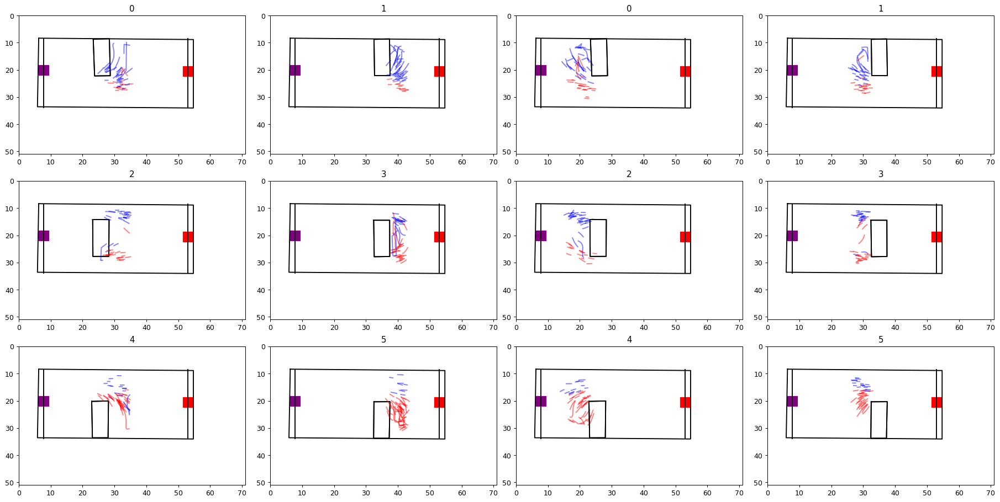

In [14]:
plot_trials_sample_thresh(light_df,50,3)

In [1]:
plot_trials_sample_thresh(light_df,50,10)

NameError: name 'plot_trials_sample_thresh' is not defined

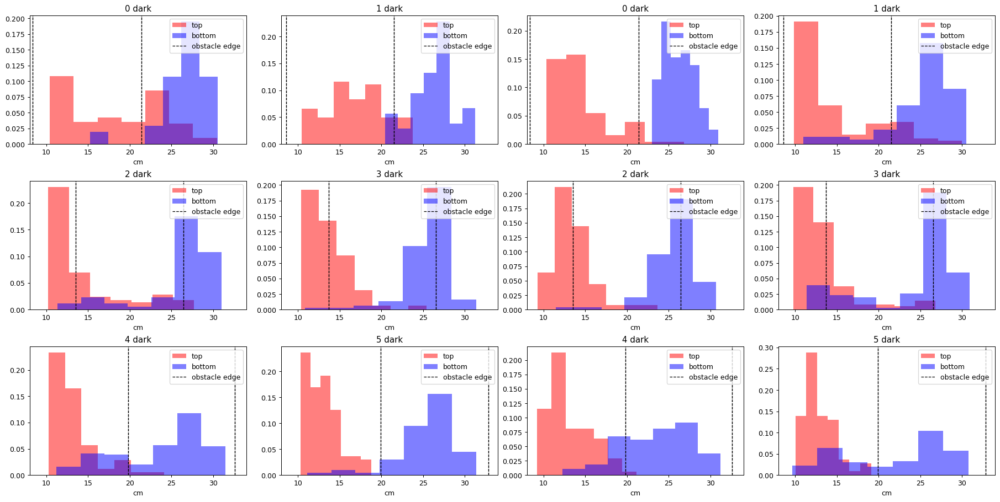

In [13]:
plot_ypostion_histogram_sample(dark_df,3,7,'dark')

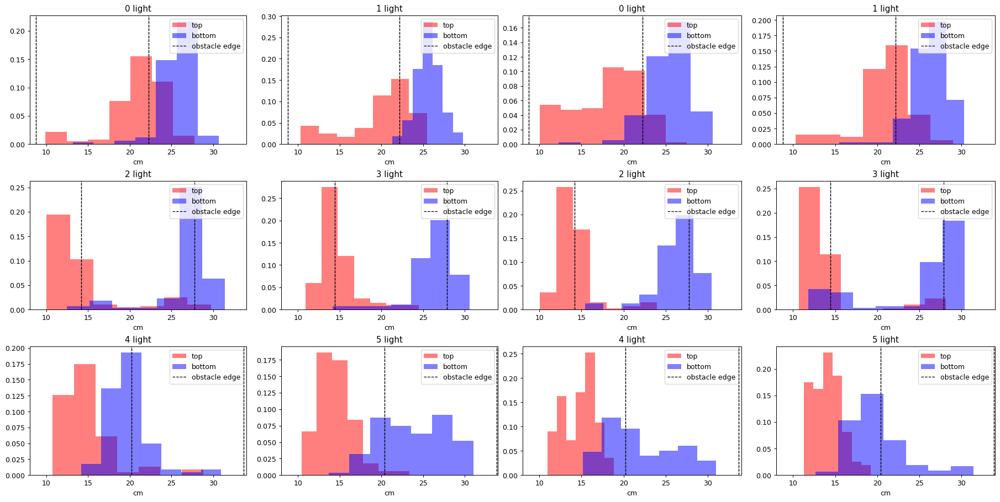

In [52]:
plot_ypostion_histogram_sample(light_df,2,7,'light')

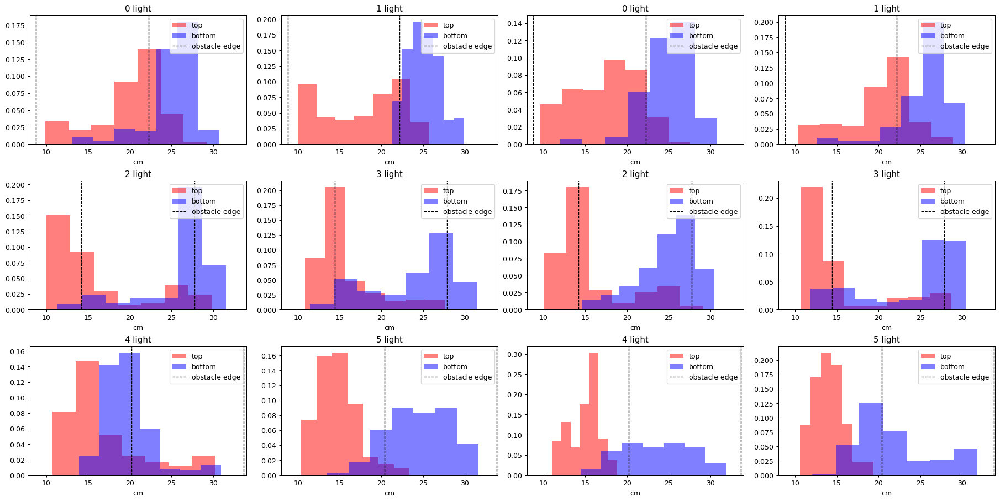

In [602]:
plot_ypostion_histogram_sample(light_df,2,7,'light')

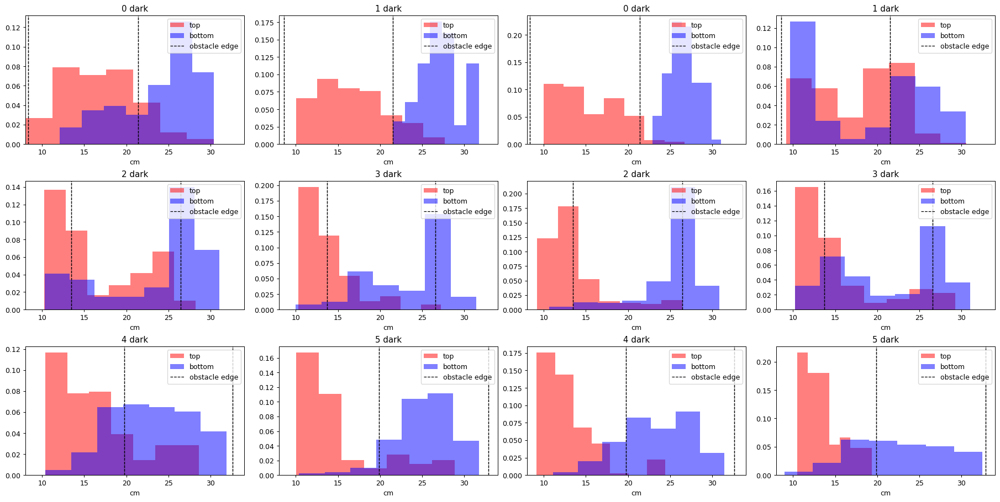

In [55]:
plot_ypostion_histogram_sample(dark_df,2,7,'dark')

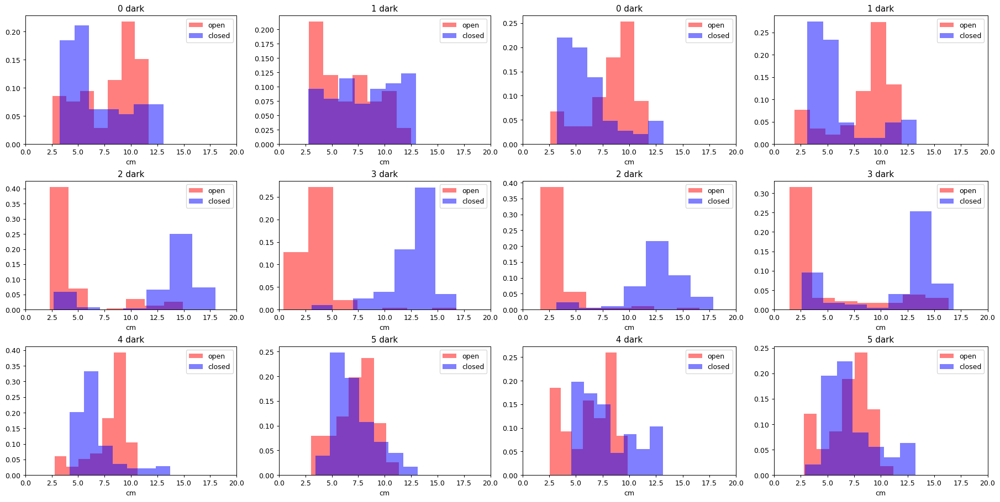

In [29]:
plot_distance_to_corner_histogram_sample(dark_df,2,7,'dark')

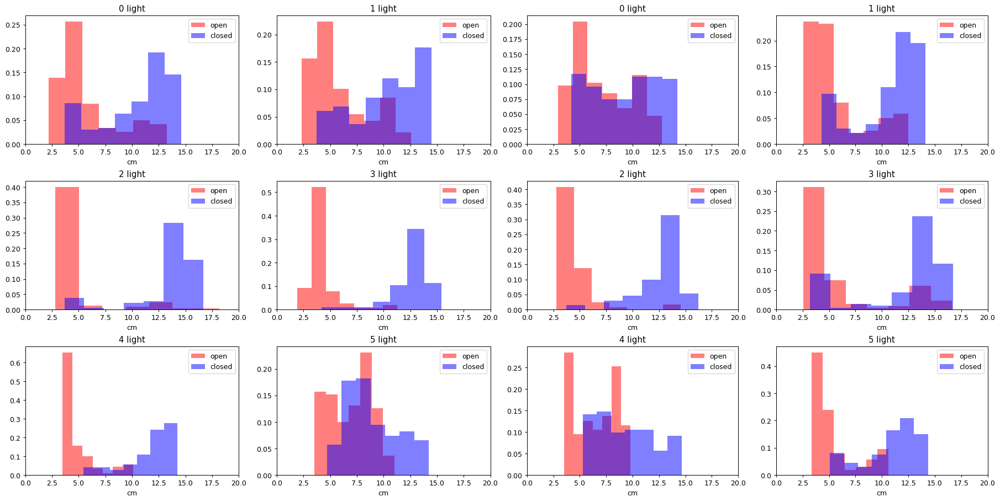

In [46]:
plot_distance_to_corner_histogram_sample(light_df,3,7,'light')

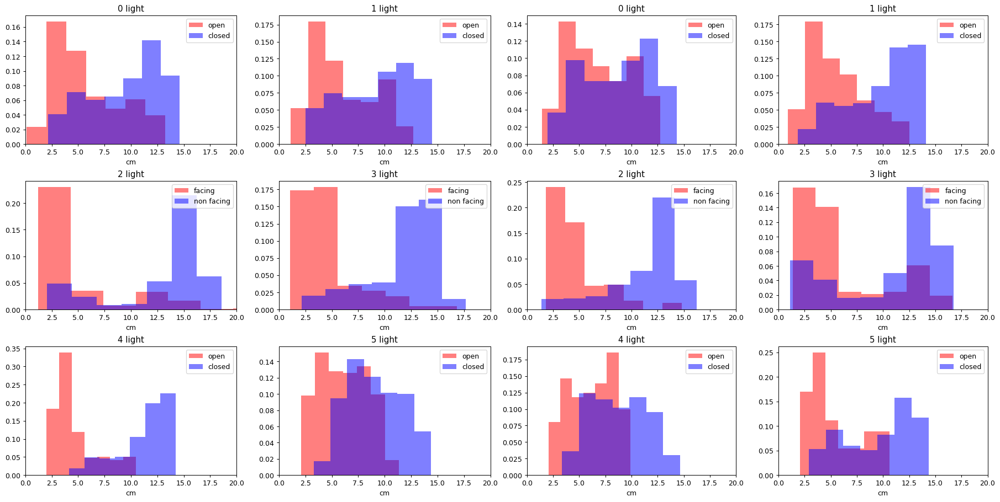

In [19]:
plot_distance_to_corner_histogram_sample(light_df,10,7,'light')

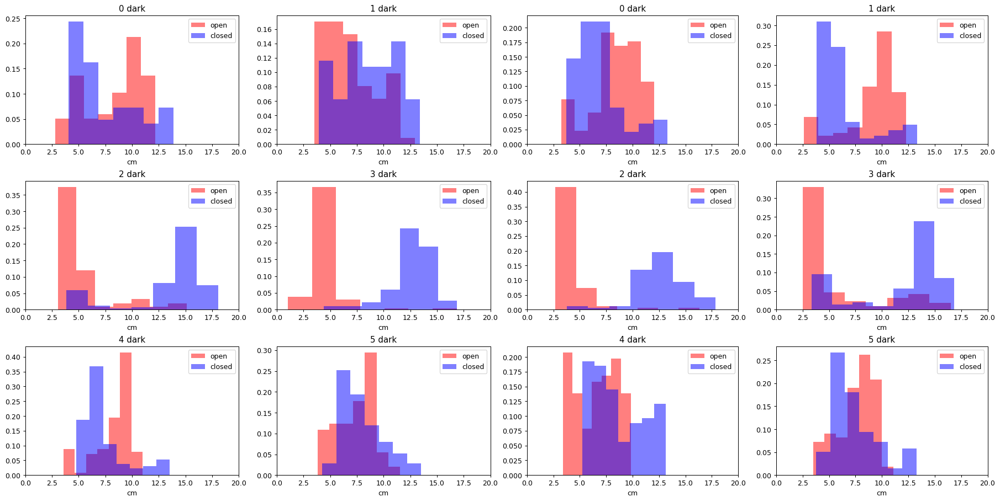

In [49]:
plot_distance_to_corner_histogram_sample(dark_df,3,7,'dark')

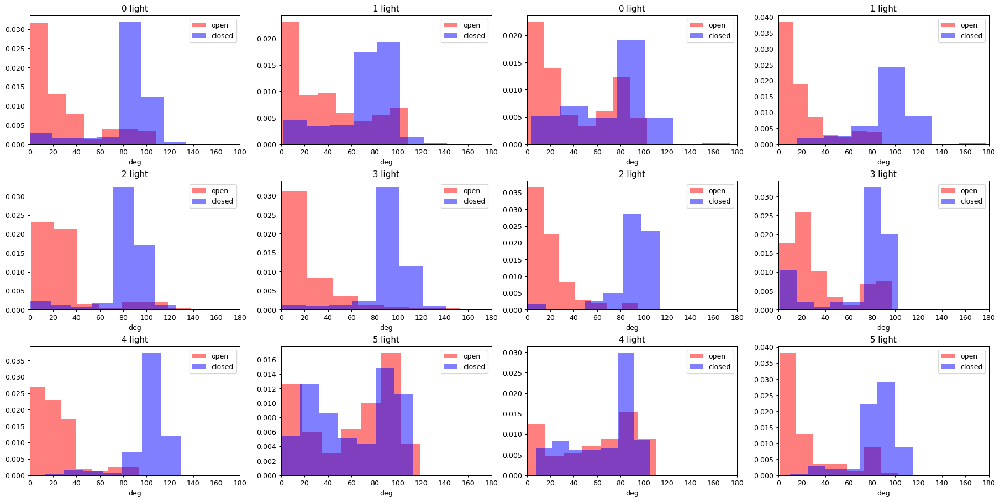

In [40]:
plot_angle_to_corner_histogram_sample(light_df,3,7,'light')

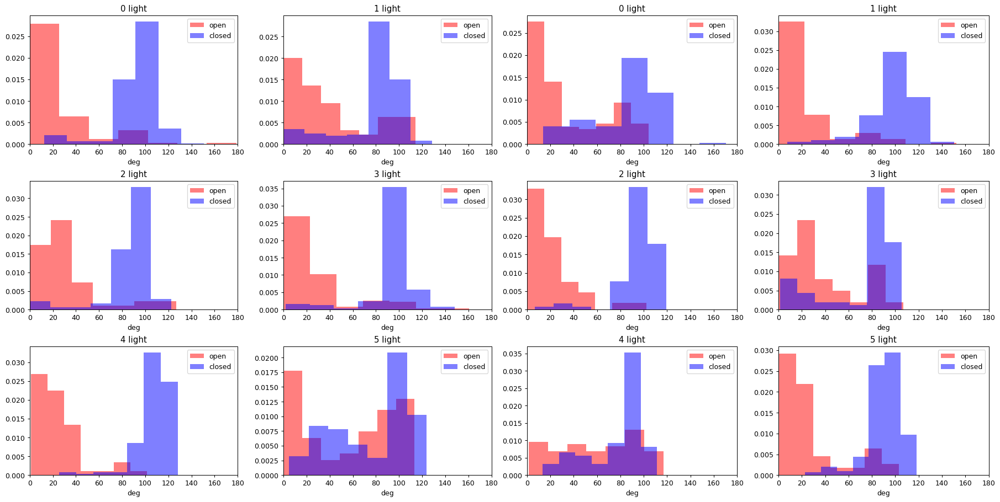

In [15]:
plot_angle_to_corner_histogram_sample(light_df,2,7,'light')

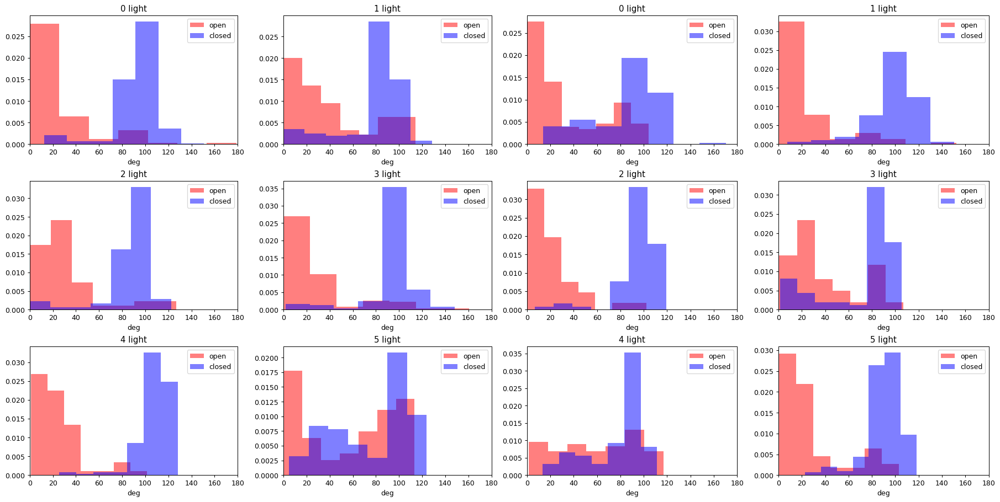

In [49]:
plot_angle_to_corner_histogram_sample(light_df,2,7,'light')

In [51]:
dark_df

,level_0,index,first_poke,second_poke,trial_timestamps,trial_vidframes,nose_x,nose_y,leftear_x,leftear_y,...,animal_mean_interp_ts_nose_y_cm,animal_median_interp_ts_nose_y_cm,animal_std_interp_ts_nose_y_cm,animal_mad_interp_ts_nose_y_cm,date_mean_interp_ts_nose_y_cm,date_median_interp_ts_nose_y_cm,date_std_interp_ts_nose_y_cm,date_mad_interp_ts_nose_y_cm,angle_to_corner_2,angle_to_corner_at_2
0,0,0,64915.523148,64918.775347,"[64915.528115, 64915.544896, 64915.561536, 649...","[540, 541, 542, 543, 544, 545, 546, 547, 548, ...","[93.8053970336914, 92.92668151855469, 92.60152...","[262.5429382324219, 263.65594482421875, 263.42...","[112.91676330566406, 111.78739166259766, 111.2...","[257.9234619140625, 258.3965759277344, 257.921...",...,"[25.59928493294343, 25.59928493294343, 25.5992...","[25.19389426499904, 25.19389426499904, 25.1938...","[2.458409583903108, 2.458409583903108, 2.45840...","[1.7388588468851331, 1.7388588468851331, 1.738...","[25.59928493294343, 25.59928493294343, 25.5992...","[25.19389426499904, 25.19389426499904, 25.1938...","[2.458409583903108, 2.458409583903108, 2.45840...","[1.7388588468851331, 1.7388588468851331, 1.738...",NaN,NaN
1,1,1,64918.775347,64921.798566,"[64918.778969, 64918.796723, 64918.812556, 649...","[[735, 736, 737, 738, 739, 740, 741, 742, 743,...","[676.229248046875, 678.3688354492188, 678.5172...","[280.1986389160156, 279.34014892578125, 279.42...","[667.1575927734375, 669.3810424804688, 668.289...","[275.3477783203125, 272.519775390625, 273.3495...",...,"[16.55288711929482, 16.30401333395236, 16.1241...","[17.48397123603999, 17.232434004323977, 17.051...","[2.3710248278598636, 2.3586075657720866, 2.320...","[1.251430907450569, 1.3730236976676622, 1.3950...","[16.55288711929482, 16.30401333395236, 16.1241...","[17.48397123603999, 17.232434004323977, 17.051...","[2.3710248278598636, 2.3586075657720866, 2.320...","[1.251430907450569, 1.3730236976676622, 1.3950...",NaN,NaN
2,2,2,64921.798566,64925.165734,"[64921.813696, 64921.83118, 64921.847052, 6492...","[917, 918, 919, 920, 921, 922, 923, 924, 925, ...","[95.15409851074219, 94.2234115600586, 94.51425...","[262.2293701171875, 263.2197265625, 264.313385...","[113.92466735839844, 112.84644317626953, 112.7...","[257.9330749511719, 258.80914306640625, 258.93...",...,"[25.59928493294343, 25.59928493294343, 25.5992...","[25.19389426499904, 25.19389426499904, 25.1938...","[2.458409583903108, 2.458409583903108, 2.45840...","[1.7388588468851331, 1.7388588468851331, 1.738...","[25.59928493294343, 25.59928493294343, 25.5992...","[25.19389426499904, 25.19389426499904, 25.1938...","[2.458409583903108, 2.458409583903108, 2.45840...","[1.7388588468851331, 1.7388588468851331, 1.738...",NaN,NaN
3,3,4,64929.479206,64932.383590,"[64929.48288, 64929.49966, 64929.517132, 64929...","[1377, 1378, 1379, 1380, 1381, 1382, 1383, 138...","[94.98332214355469, 93.73847198486328, 93.1007...","[262.4388427734375, 262.70660400390625, 262.69...","[113.64474487304688, 113.05989074707031, 112.1...","[256.3793029785156, 257.34747314453125, 257.83...",...,"[14.8041636679557, 14.8041636679557, 14.804163...","[13.565564647664193, 13.565564647664193, 13.56...","[3.164059750368316, 3.164059750368316, 3.16405...","[1.791182594700432, 1.791182594700432, 1.79118...","[14.8041636679557, 14.8041636679557, 14.804163...","[13.565564647664193, 13.565564647664193, 13.56...","[3.164059750368316, 3.164059750368316, 3.16405...","[1.791182594700432, 1.791182594700432, 1.79118...",NaN,NaN
4,4,6,64935.836697,64938.609971,"[64935.851635, 64935.869478, 64935.885107, 649...","[1759, 1760, 1761, 1762, 1763, 1764, 1765, 176...","[94.91559600830078, 95.0887680053711, 93.86167...","[263.7718505859375, 262.8562316894531, 264.323...","[115.93388366699219, 114.1135025024414, 113.45...","[256.3660888671875, 257.00177001953125, 257.76...",...,"[15.411349506134792, 15.411349506134792, 15.41...","[14.944562320630633, 14.944562320630633, 14.94...","[2.4849188045432222, 2.4849188045432222, 2.484...","[1.25393103

In [50]:
plot_angle_to_corner_histogram_sample(dark_df,2,7,'dark')

[85.01610746 88.21496989 91.37531265 94.31368042]
[16.00512852 12.89640998  9.31909881]
[57.39791314 58.08897409 57.83951574 56.74979672 55.42760973 54.86993801]
[37.81494687 41.30743417 43.99725367 45.18994919 44.43996526 41.75243564]
[59.49227566 58.97671864 57.28755998 54.10361489 49.26354079 42.89571095
 35.5297639  28.12772643]
[ 88.78171045  93.03786287  96.79162402 100.02114861 102.82127513]
[88.22653554 88.94707469 89.52677269 89.98959778 90.39225187]
[ 99.41717892 101.14190947 102.85728705 104.40481886 105.66590522
 106.55807122  35.59595694  27.05898243  19.06747964  11.74501705
   5.09843914   1.0263327    7.02039509  13.7050323   23.01858024]
[67.16907197 67.08705522 67.34747847 67.6074159  67.55617694 40.85160618
 33.06080691 25.04350465 17.2187368   9.94500777  3.44907519  2.22125533
  7.22242604 11.92346043 17.02998747 24.06064608]
[93.96732273 96.40851628 98.28492829 99.52033221]
[ 97.78899669  99.81387838 101.41123297 102.41135762 102.69097972]
[ 4.24786086  4.16395214

ValueError: Must have equal len keys and value when setting with an iterable

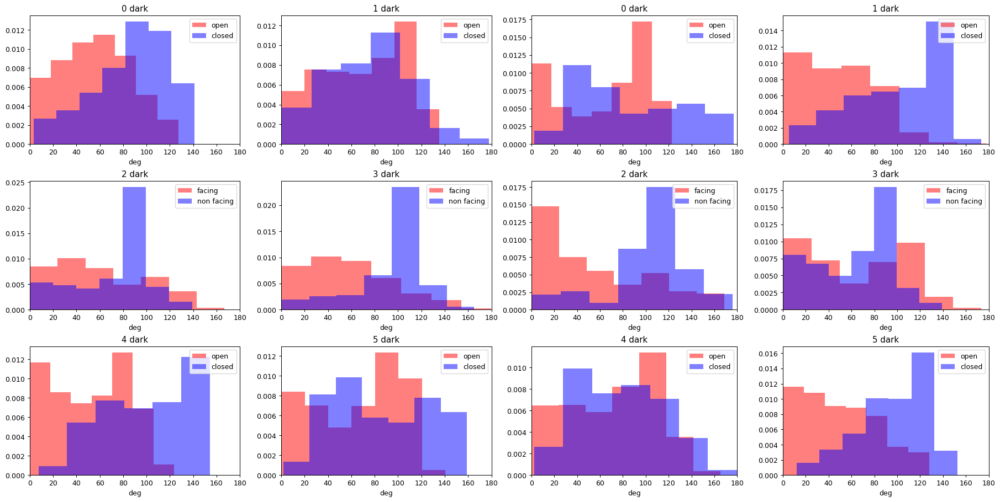

In [61]:
plot_angle_to_corner_histogram_sample(dark_df,2,7,'dark')

In [20]:
plot_angle_to_corner_histogram_sample(dark_df,10,7,'dark')

NameError: name 'angle_to_open_corner' is not defined

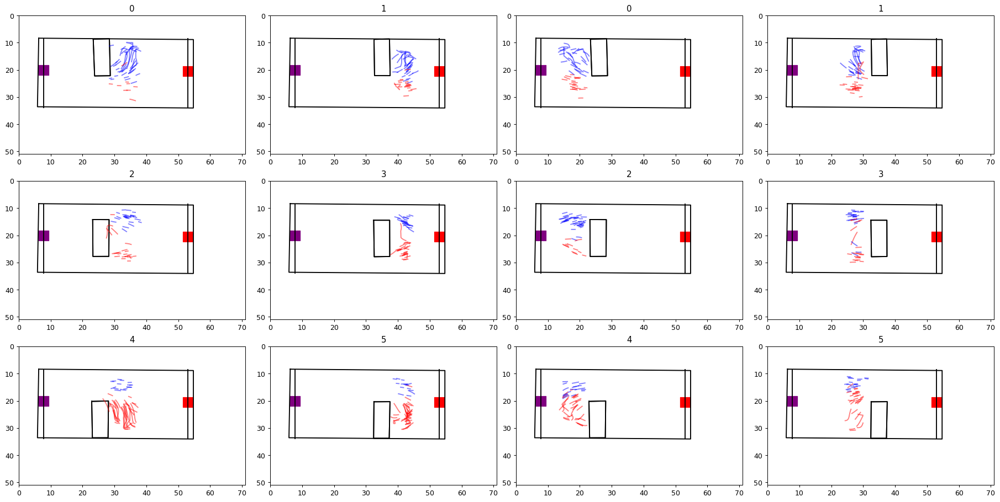

In [31]:
plot_trials_sample_thresh(light_df,50,5)

In [53]:
plot_angle_to_corner_histogram_sample(dark_df,3,7,'light')

[82.03030202 85.01610746 88.21496989]
[19.0617101  16.00512852]
[56.06019248 57.39791314 58.08897409]
[31.21451121 34.25152002 37.81494687 41.30743417]
[58.48612381 59.20939027 59.49227566 58.97671864]
[79.4477956  84.16898475 88.78171045 93.03786287]
[86.39391429 87.36752646 88.22653554 88.94707469]
[ 95.92525689  96.66640089  97.86740261  99.41717892 101.14190947]
[69.53400054 67.91530607 67.16907197 67.08705522]
[88.28897004 91.1646922  93.96732273]
[93.3845666  95.56096488 97.78899669 99.81387838]
[98.42906652 97.22139604 95.00609848 91.6114063  86.88085138 80.71870992
 73.13174661 64.25530618 54.36118998 43.8470832  33.19197501 22.8621724
 13.18612142  4.24786086  4.16395214 12.56195272 21.75980764 32.86645338]
[76.79200675 80.67422984 84.45429145]
[83.35954934 87.60462562 91.65857229]
[90.83396689 91.52305358 91.74382977]
[85.9194002  85.78656994 85.45890575 84.87675289]
[ 89.02604888  91.9978723   95.0417157   98.12136236 101.17976451
 104.14887749]
[90.12206857 92.96473375 95.4

ValueError: Must have equal len keys and value when setting with an iterable

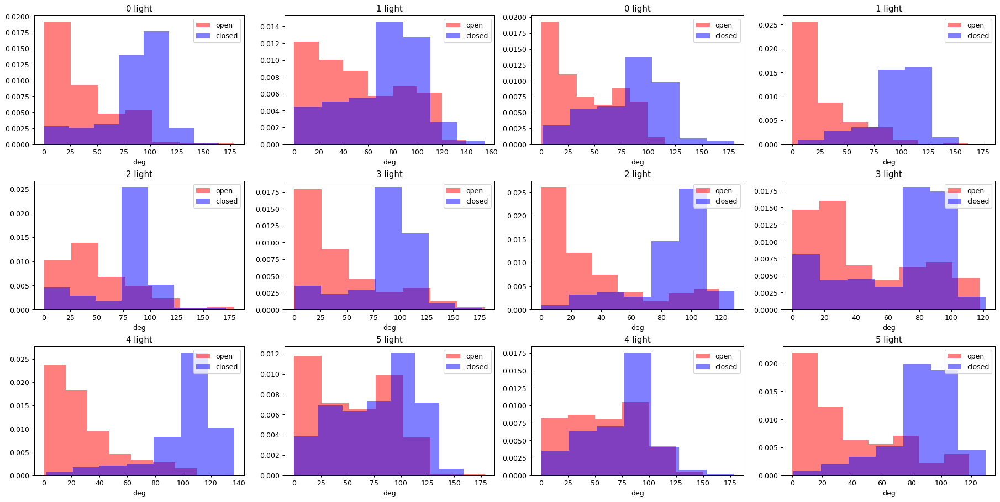

In [52]:
plot_angle_to_corner_histogram_sample(light_df,5,7,'light')

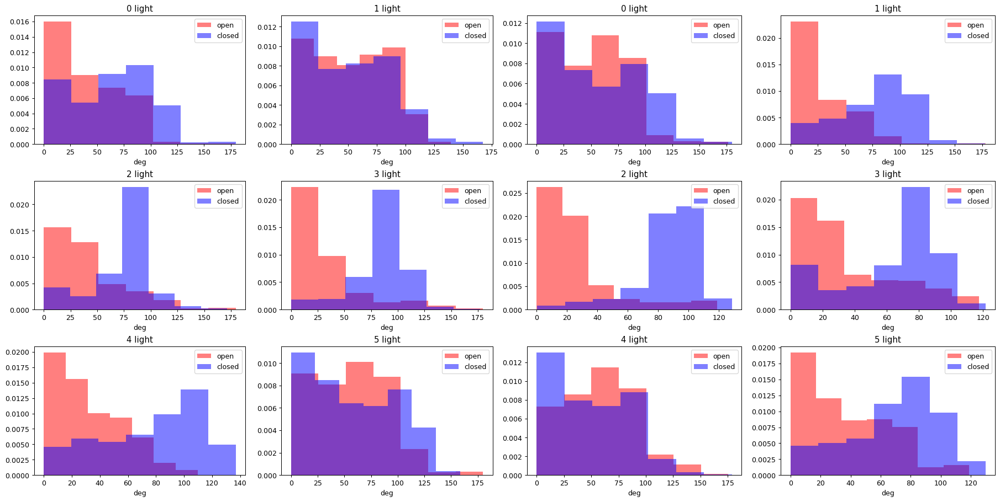

In [63]:
plot_angle_to_corner_histogram_sample(light_df,10,7,'light')

In [9]:
def plot_angle_to_closed_corner_histogram_sample(df,thresh,bin_num,label):
    """Direction by key obstalce trials"""
    angle_to_closed_corner(df,thresh)
    fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    """Right"""
    panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    ax2 = fig.add_subplot(panel_1[0,1])
    ax3 = fig.add_subplot(panel_1[1,0])
    ax4 = fig.add_subplot(panel_1[1,1])
    ax5 = fig.add_subplot(panel_1[2,0])
    ax6 = fig.add_subplot(panel_1[2,1])
    right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]

    """Left """
    panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
    ax7 = fig.add_subplot(panel_2[0,0])
    ax8 = fig.add_subplot(panel_2[0,1])
    ax9 = fig.add_subplot(panel_2[1,0])
    ax10 = fig.add_subplot(panel_2[1,1])
    ax11= fig.add_subplot(panel_2[2,0])
    ax12 = fig.add_subplot(panel_2[2,1])
    left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]
    """ plot histogram"""
    right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
    left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))

    num_close_top = df.loc[(df['obstacle_cluster'] ==0) & (df['start']=='top')&(df['odd'] =='right')]
    num_close_bottom = df.loc[(df['obstacle_cluster'] ==0) & (df['start']=='bottom')&(df['odd'] =='right')]

    for direction, direction_frame in df.groupby(['odd']):
        for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
            if cluster == 2 or cluster ==3:
                continue
            if cluster == 0 or cluster == 1:
                num_close_top = cluster_frame.loc[(cluster_frame['start']=='top')]
                if direction == 'right':
                    right_obstacle_axis = right_obstacle_dict.get(cluster)
                    right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                    right_obstacle_axis.hist(np.concatenate(num_close_top['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                    #right_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                    right_obstacle_axis.set_xlabel('cm')
                    right_obstacle_axis.legend( loc='upper right')
                

                
                if direction == 'left':
                    left_obstacle_axis = left_obstacle_dict.get(cluster)
                    left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                    left_obstacle_axis.hist(np.concatenate(num_close_top['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                    #left_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                    left_obstacle_axis.set_xlabel('cm')
                    left_obstacle_axis.legend( loc='upper right')
            if cluster == 4 or cluster == 5:
                num_close_bottom = cluster_frame.loc[(cluster_frame['start']=='bottom')]
    
        
                if direction == 'right':
                    right_obstacle_axis = right_obstacle_dict.get(cluster)
                    right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                    #right_obstacle_axis.hist(np.concatenate(num_close_top['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                    right_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                    right_obstacle_axis.set_xlabel('cm')
                    right_obstacle_axis.legend( loc='upper right')



                if direction == 'left':
                    left_obstacle_axis = left_obstacle_dict.get(cluster)
                    left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                    #left_obstacle_axis.hist(np.concatenate(num_close_top['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                    left_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                    left_obstacle_axis.set_xlabel('cm')
                    left_obstacle_axis.legend( loc='upper right')

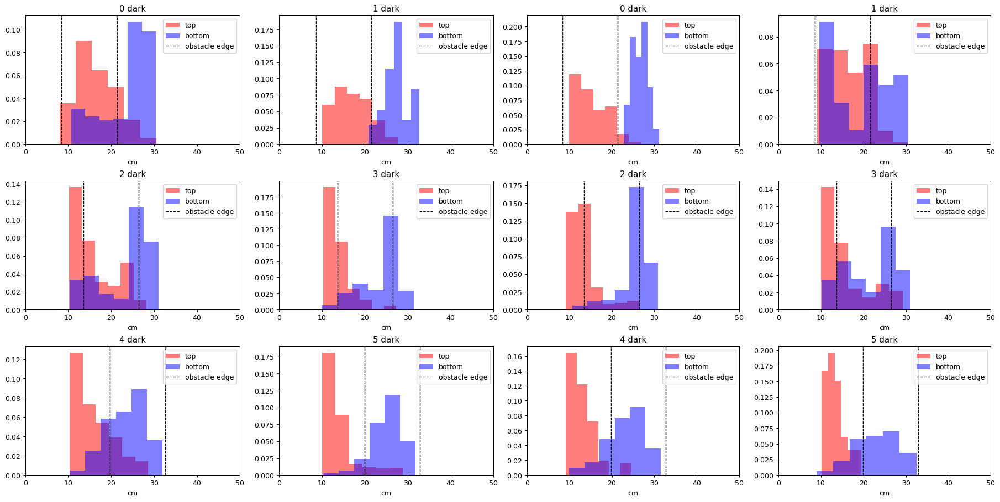

In [75]:
plot_ypostion_histogram_sample(dark_df,3,6,'dark')

In [342]:
def plot_single_trial(df,ind,ax):
    trial = df.iloc[ind]

    plot_arena(trial,ax)
    ax.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                                [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
    ax.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
                                [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')
    
    ax.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'])

AttributeError: 'Series' object has no attribute 'thresh_ind_5'

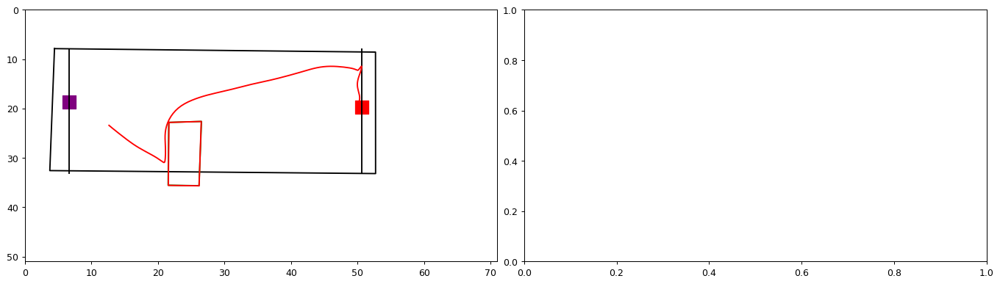

In [52]:
trial = dark_df.iloc[555]
fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)

spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
plot_arena(trial,ax1)
ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                            [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
                            [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')



ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'red')

ax1.plot(trial['ts_nose_x_cm'][trial.thresh_ind_5.tolist()],trial['ts_nose_y_cm'][trial.thresh_ind_5.tolist()],color = 'blue')
ax2.plot(trial.ts_speed)


In [416]:
trial.ts_speed[trial.thresh_ind_5.tolist()]

array([36.45989589219002, 36.648731682604584, 36.64171265376754,
       36.21916926612341, 35.14023929494264, 33.21932848129211,
       30.374913903699856, 26.631938585881905, 22.09767232732021,
       16.9386358331794], dtype=object)

In [447]:
ts_postition_at_threshold(dark_df,10)
ts_postition_at_threshold(light_df,10)

In [411]:
trial.ts_speed[trial.thresh_ind_5.tolist()]

array([36.45989589219002, 36.648731682604584, 36.64171265376754,
       36.21916926612341, 35.14023929494264, 33.21932848129211,
       30.374913903699856, 26.631938585881905, 22.09767232732021,
       16.9386358331794], dtype=object)

In [432]:
(trial.thresh_ind_5).tolist()[-1]

48

In [429]:
list((trial.thresh_ind_5)+1)

[29, 30, 31, 32, 42, 43, 44, 45, 46, 47, 48, 49]

In [215]:
nose_y[i]

17.77026536094213

In [214]:
nose_y[i] > trial['obstacleTR_y_cm']

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [226]:
np.abs(calculate_distances(nose_x[i],nose_y[i],obstalce_x,obstalce_y))

NameError: name 'obstalce_y' is not defined

In [ ]:
17.637674217843525 <

In [234]:
nose_y[1] < trial['gt_obstacleTR_y_cm']

False

In [233]:
(nose_y[1] > trial['gt_obstacleTR_y_cm']) and (nose_y[1] < trial['gt_obstacleTR_y_cm'])

False

[22.26055864]


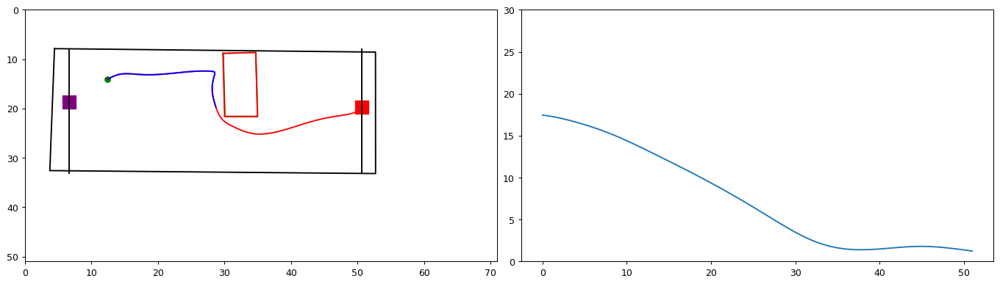

In [242]:
trial = dark_df.iloc[628]
fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)

spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
plot_arena(trial,ax1)
ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                            [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
                            [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')

slow = np.min(trial.ts_speed[trial.thresh_ind_through_20.tolist()])
slow_ind = np.where(trial.ts_speed == slow )
ax1.scatter(trial['ts_nose_x_cm'][slow_ind],trial['ts_nose_y_cm'][slow_ind],color = 'green')
ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'red')
min = list(trial.thresh_ind_through_20)[0]+1
max = list(trial.thresh_ind_through_20)[-1]+1
nose_x = trial['ts_nose_x_cm'][min:max]
nose_y = trial['ts_nose_y_cm'][min:max]
distances = []
for i,e in enumerate(nose_x):
    obstalce_x = np.mean([trial['gt_obstacleTL_x_cm'],trial['gt_obstacleBL_x_cm']]) 
    if nose_y[i] > trial['gt_obstacleTL_y_cm'] and nose_y[i] < trial['gt_obstacleBL_y_cm']:
        obstalce_y = nose_y[i]
        distance = np.abs(calculate_distances(nose_x[i],nose_y[i],obstalce_x,obstalce_y))
        distances.append(distance)
    else:
        distances.append(np.nan)



    



ax1.plot(trial['ts_nose_x_cm'][min:max],trial['ts_nose_y_cm'][min:max],color = 'blue')
ax2.plot(distances)
ax2.set_ylim([0,30])
#ax2.plot(trial.ts_speed)
#ax2.plot(trial.ts_speed[trial.thresh_ind_through_20.tolist()],color = 'green')
print(np.abs(np.diff(np.array([trial['ts_nose_x_cm'][slow_ind][0],trial['gt_obstacleTR_x_cm']]))))

[16.57516111]


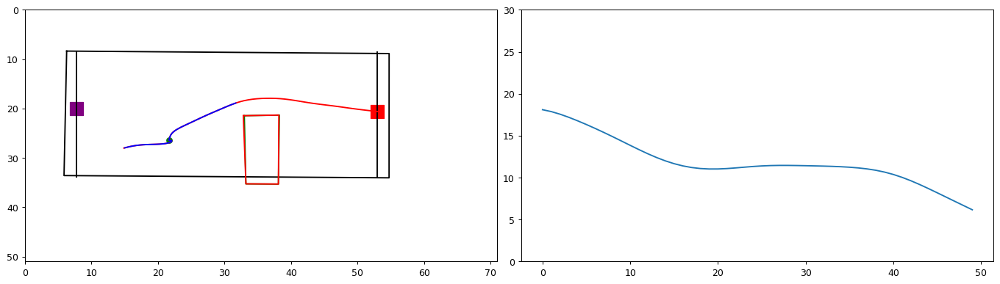

In [592]:
trial = light_df.iloc[102]
fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)

spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
plot_arena(trial,ax1)
ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                            [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
                            [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')

slow = np.min(trial.ts_speed[trial.thresh_ind_through_20.tolist()])
slow_ind = np.where(trial.ts_speed == slow )
ax1.scatter(trial['ts_nose_x_cm'][slow_ind],trial['ts_nose_y_cm'][slow_ind],color = 'green')
ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'red')
min = list(trial.thresh_ind_through_20)[0]+1
max = list(trial.thresh_ind_through_20)[-1]+1
nose_x = trial['ts_nose_x_cm'][min:max]
nose_y = trial['ts_nose_y_cm'][min:max]
distances = []
for i,e in enumerate(nose_x):
    obstalce_x = np.mean([trial['gt_obstacleTL_x_cm'],trial['gt_obstacleBL_x_cm']]) 
    if nose_y[i] > trial['gt_obstacleTL_y_cm'] and nose_y[i] < trial['gt_obstacleBL_y_cm']:
        obstalce_y = nose_y[i]
        distance = np.abs(calculate_distances(nose_x[i],nose_y[i],obstalce_x,obstalce_y))
        distances.append(distance)
    else:
        distances.append(np.nan)



    



ax1.plot(trial['ts_nose_x_cm'][min:max],trial['ts_nose_y_cm'][min:max],color = 'blue')
ax2.plot(distances)
ax2.set_ylim([0,30])
#ax2.plot(trial.ts_speed)
#ax2.plot(trial.ts_speed[trial.thresh_ind_through_20.tolist()],color = 'green')
print(np.abs(np.diff(np.array([trial['ts_nose_x_cm'][slow_ind][0],trial['gt_obstacleTR_x_cm']]))))

In [249]:
len(distances)

52

In [ ]:
dark_df.len[]

[23.21466668]


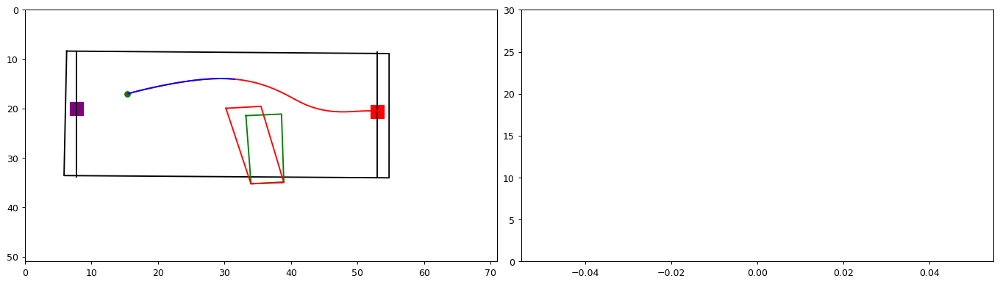

In [277]:
trial = light_df.iloc[44]
fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)

spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
plot_arena(trial,ax1)
ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                            [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
                            [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')

slow = np.min(trial.ts_speed[trial.thresh_ind_through_20.tolist()])
slow_ind = np.where(trial.ts_speed == slow )
ax1.scatter(trial['ts_nose_x_cm'][slow_ind],trial['ts_nose_y_cm'][slow_ind],color = 'green')
ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'red')
min = list(trial.thresh_ind_through_20)[0]+1
max = list(trial.thresh_ind_through_20)[-1]+1
nose_x = trial['ts_nose_x_cm'][min:max]
nose_y = trial['ts_nose_y_cm'][min:max]
distances = []
for i,e in enumerate(nose_x):
    obstalce_x = np.mean([trial['gt_obstacleTR_x_cm'],trial['gt_obstacleBR_x_cm']]) 
    if nose_y[i] > trial['gt_obstacleTR_y_cm'] and nose_y[i] < trial['gt_obstacleBR_y_cm']:
        obstalce_y = nose_y[i]
        distance = np.abs(calculate_distances(nose_x[i],nose_y[i],obstalce_x,obstalce_y))
        distances.append(distance)
    else:
        distances.append(np.nan)



    



ax1.plot(trial['ts_nose_x_cm'][min:max],trial['ts_nose_y_cm'][min:max],color = 'blue')
ax2.plot(distances)
ax2.set_ylim([0,30])
#ax2.plot(trial.ts_speed)
#ax2.plot(trial.ts_speed[trial.thresh_ind_through_20.tolist()],color = 'green')
print(np.abs(np.diff(np.array([trial['ts_nose_x_cm'][slow_ind][0],trial['gt_obstacleTR_x_cm']]))))


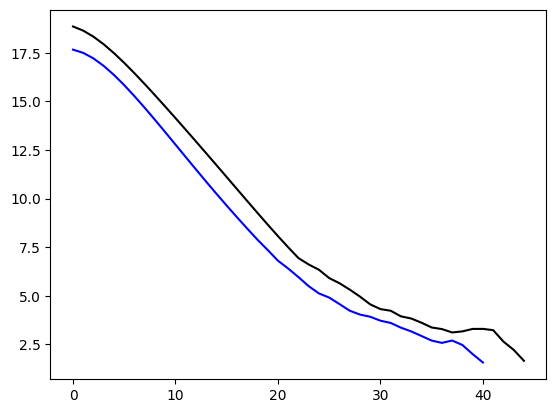

In [1133]:
plt.plot(np.nanmean(cluster_array_dark,axis = 0),c = 'black')
plt.plot(np.nanmean(cluster_array,axis = 0),c = 'blue')


In [1950]:
thresh = 10
calculate_distance_to_obstacle_edge(light_df,thresh)
calculate_distance_to_obstacle_edge(dark_df,thresh)

In [1948]:
thresh = 10
calculate_distance_to_obstacle_edge(light_df,thresh)
calculate_distance_to_obstacle_edge(dark_df,thresh)
#cluster_4_light = light_df[(light_df['obstacle_cluster']==0) & (light_df['start']=='top') & (light_df['odd']=='right')  ]
#cluster_4_dark = dark_df[(dark_df['obstacle_cluster']==0) & (dark_df['start']=='top') & (dark_df['odd']=='right')   ]


In [2109]:
cluster = 0 
start = 'top'
direction = 'right'

cut_off_light = int(light_df['len_distance_from_edge_'+str(thresh)][(light_df['obstacle_cluster']==cluster)  & (light_df['start']== start) & (light_df['odd']==direction) ].mean())
cut_off_dark = int(dark_df['len_distance_from_edge_'+str(thresh)][(dark_df['obstacle_cluster']==cluster)  & (dark_df['start']==start) & (dark_df['odd']==direction) ].mean())

#cut_off_light = int(light_df['len_distance_from_edge_'+str(thresh)][(light_df['obstacle_cluster']==cluster)  &  (light_df['odd']==direction) ].mean())
#cut_off_dark = int(dark_df['len_distance_from_edge_'+str(thresh)][(dark_df['obstacle_cluster']==cluster)  & (dark_df['odd']==direction) ].mean())

cluster_4_light = light_df[(light_df['obstacle_cluster']==cluster) & (light_df['start']==start) & (light_df['odd']==direction) & (light_df['len_distance_from_edge_'+str(thresh)]<=cut_off_light)  ]
cluster_4_dark = dark_df[(dark_df['obstacle_cluster']==cluster) & (dark_df['start']==start) & (dark_df['odd']==direction) & (dark_df['len_distance_from_edge_'+str(thresh)]<=cut_off_dark)  ]

#cluster_4_light = light_df[(light_df['obstacle_cluster']==cluster) & (light_df['start']==start)  & (light_df['len_distance_from_edge_'+str(thresh)]<=cut_off_light)  ]
#cluster_4_dark = dark_df[(dark_df['obstacle_cluster']==cluster) & (dark_df['start']==start)  & (dark_df['len_distance_from_edge_'+str(thresh)]<=cut_off_dark)  ]
data = cluster_4_light
max_len = int(data['len_distance_from_edge_'+str(thresh)].max())
rows = data.shape[0]
cluster_array = np.empty([rows,max_len])
cluster_array[:] =np.nan 

for ind,row in enumerate(data.iterrows()):
    length = row[1]['distance_from_edge_'+str(thresh)].size
    cluster_array[ind][:length] = row[1]['distance_from_edge_'+str(thresh)]
    
data = cluster_4_dark
max_len = int(data['len_distance_from_edge_'+str(thresh)].max())
rows =data.shape[0]
cluster_array_dark = np.empty([rows,max_len])
cluster_array_dark[:] =np.nan 

for ind,row in enumerate(data.iterrows()):
    length = row[1]['distance_from_edge_'+str(thresh)].size
    cluster_array_dark[ind][:length] = row[1]['distance_from_edge_'+str(thresh)]




In [2110]:
max_val = np.nanmax(cluster_array.flatten())
norm_array = np.empty(cluster_array.shape)
for i in list(range(cluster_array.shape[0])):
    max_val = np.nanmax(cluster_array[i])
    norm_array[i] = cluster_array[i]/max_val



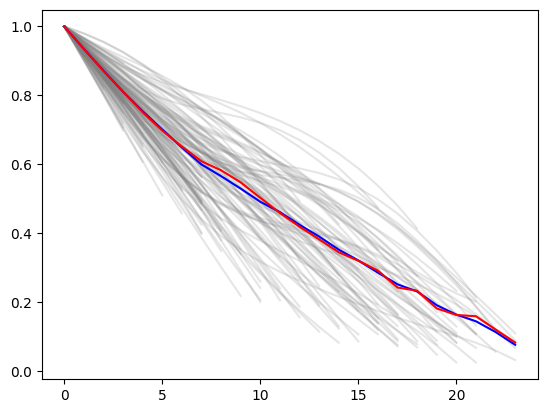

In [2111]:
for i in list(range(cluster_array.shape[0])):
    plt.plot(norm_array[i],c = 'gray',alpha = .2)
plt.plot(np.nanmean(norm_array,axis = 0),c = 'blue')
plt.plot(np.nanmedian(norm_array,axis = 0),c = 'red')


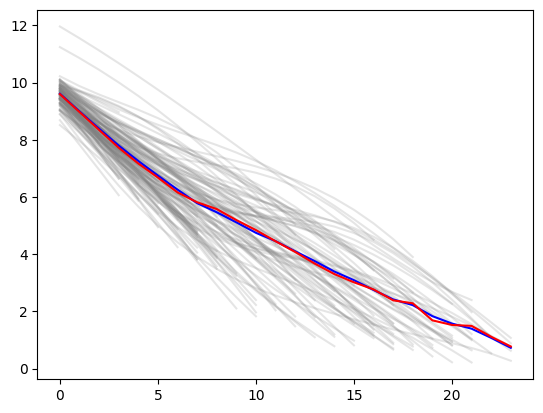

In [2112]:
for ind,row in cluster_4_light.iterrows():
    plt.plot(row['distance_from_edge_'+str(thresh)],c = 'gray',alpha = .2)
plt.plot(np.nanmean(cluster_array,axis = 0),c = 'blue')
plt.plot(np.nanmedian(cluster_array,axis = 0),c = 'red')

In [2113]:
max_val = np.nanmax(cluster_array_dark.flatten())
norm_array_dark = np.empty(cluster_array_dark.shape)
for i in list(range(cluster_array_dark.shape[0])):
    max_val = np.nanmax(cluster_array_dark[i])
    norm_array_dark[i] = cluster_array_dark[i]/max_val


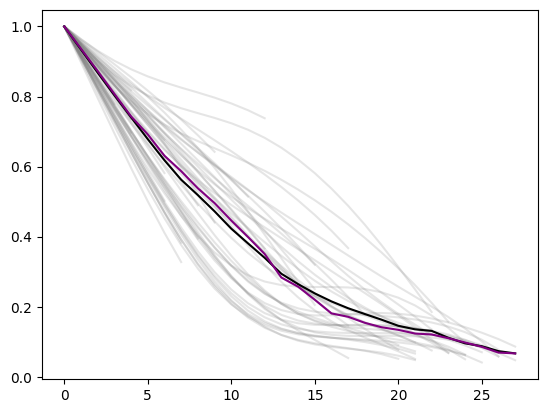

In [2114]:
for i in list(range(cluster_array_dark.shape[0])):
    plt.plot(norm_array_dark[i],c = 'gray',alpha = .2)
plt.plot(np.nanmean(norm_array_dark,axis = 0),c = 'black')
plt.plot(np.nanmedian(norm_array_dark,axis = 0),c = 'purple')

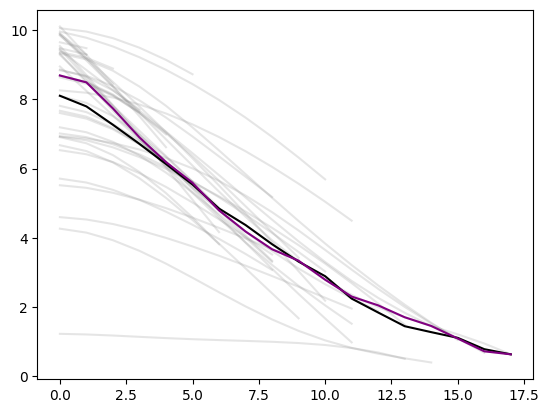

In [2007]:
for ind,row in cluster_4_dark.iterrows():
    plt.plot(row['distance_from_edge_'+str(thresh)],c = 'gray',alpha = .2)
plt.plot(np.nanmean(cluster_array_dark,axis = 0),c = 'black')
plt.plot(np.nanmedian(cluster_array_dark,axis = 0),c = 'purple')

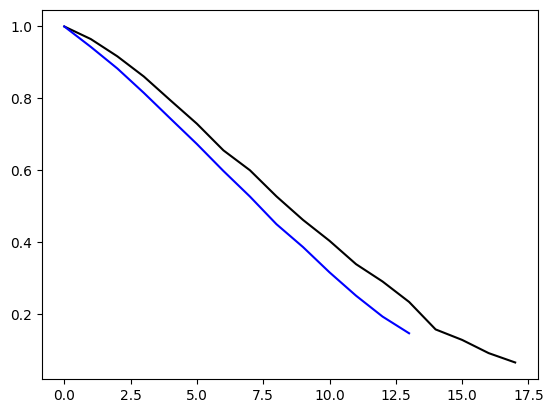

In [2008]:
plt.plot(np.nanmean(norm_array_dark,axis = 0),c = 'black')
plt.plot(np.nanmean(norm_array,axis = 0),c = 'blue')

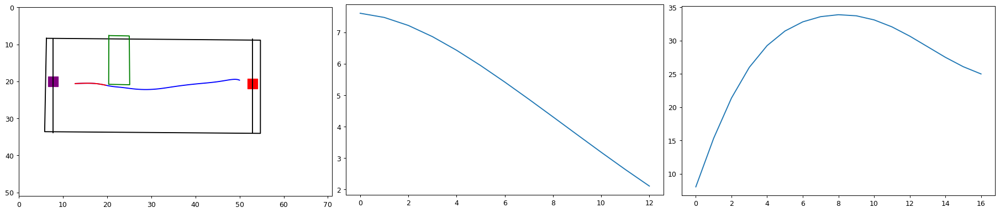

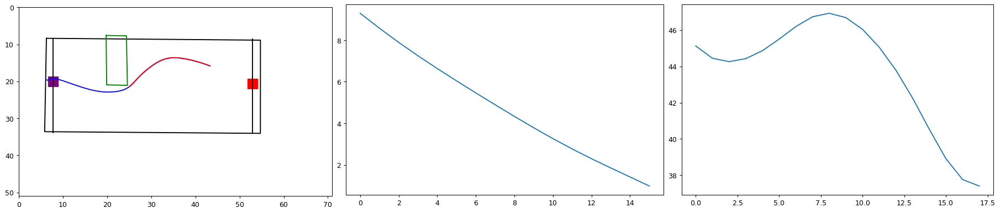

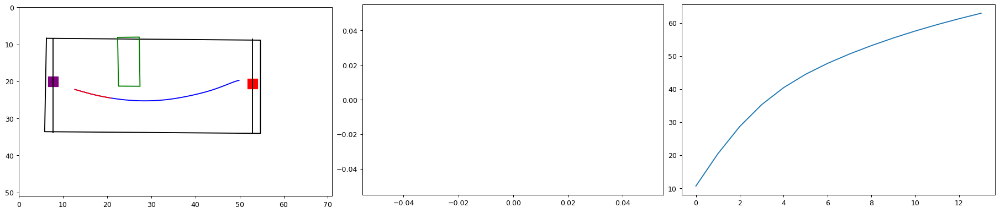

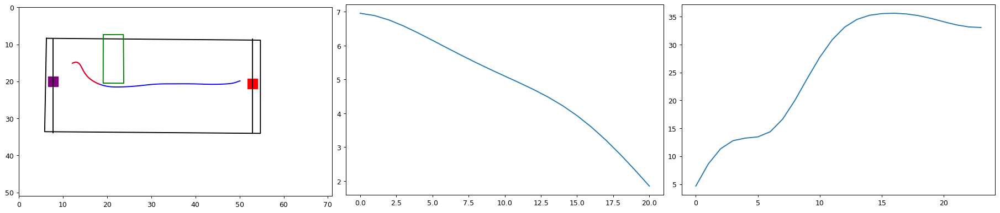

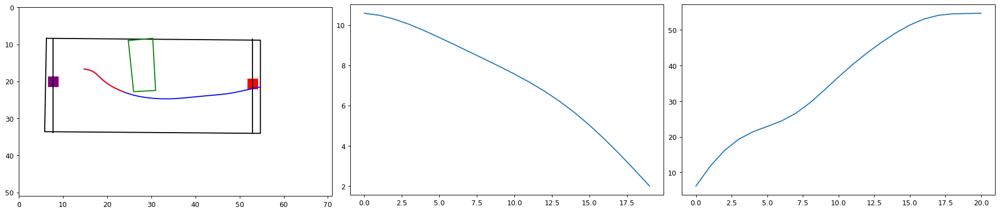

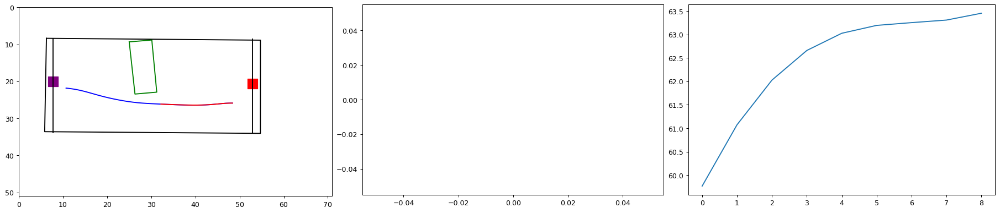

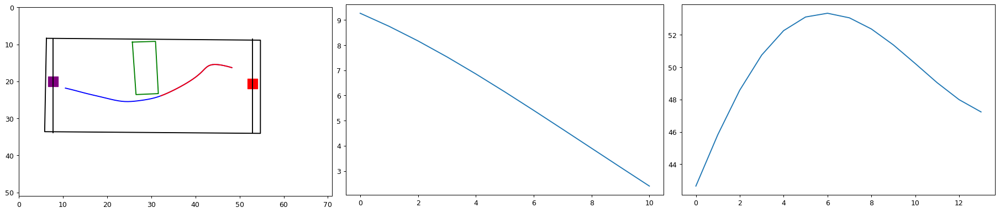

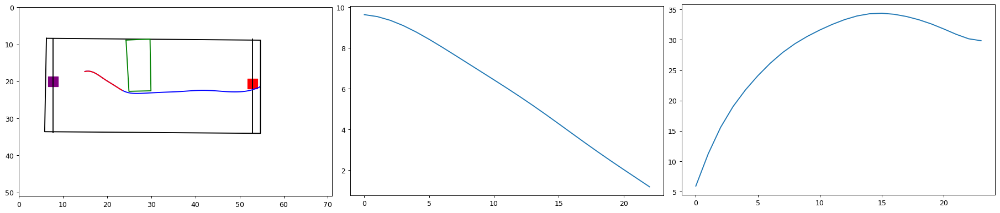

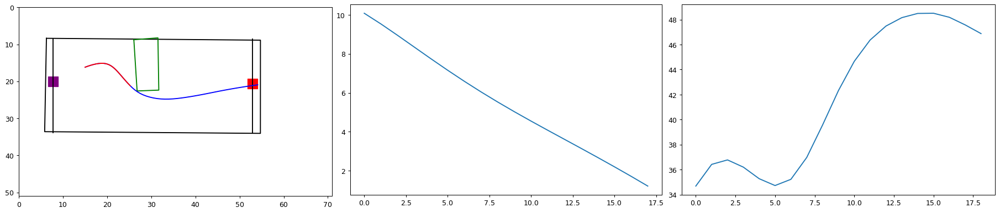

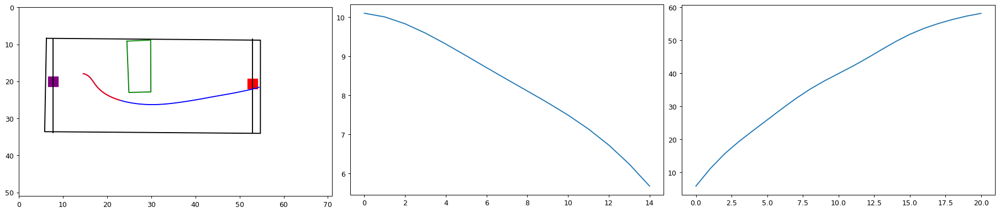

In [1939]:
sample_df =  light_df[light_df['obstacle_cluster']==0].sample(10)
for ind,row in sample_df.iterrows():
    trial = sample_df.loc[ind]
    fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)

    spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
    panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
    panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
    panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])
    
    ax1 = fig.add_subplot(panel_1[0,0])
    ax2 = fig.add_subplot(panel_2[0,0])
    ax3 = fig.add_subplot(panel_3[0,0])
    plot_arena(trial,ax1)
    ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                                [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
    #ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
     #                           [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')
    
    ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'blue')
    ax1.plot(trial['ts_nose_x_cm'][:trial.thresh_ind_through_10[-1]],trial['ts_nose_y_cm'][:trial.thresh_ind_through_10[-1]],color = 'red')
    ax3.plot(trial.ts_speed[trial.thresh_ind_through_10.tolist()])
   
    
    
   
    
    
    ax2.plot(trial.distance_from_edge_10)

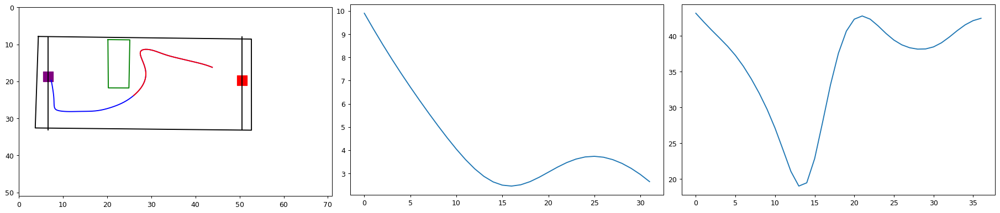

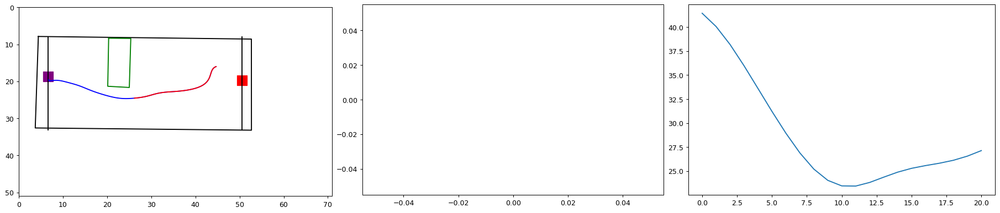

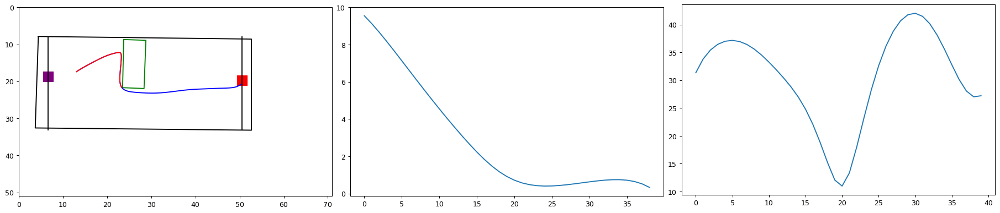

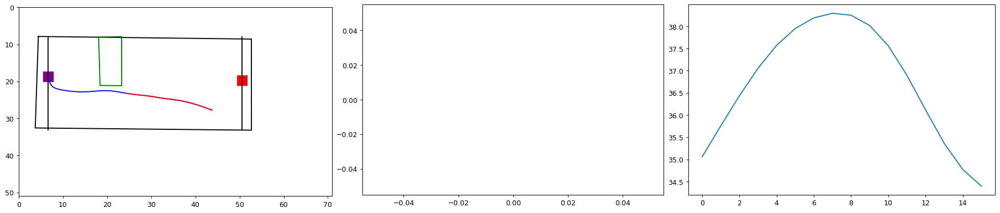

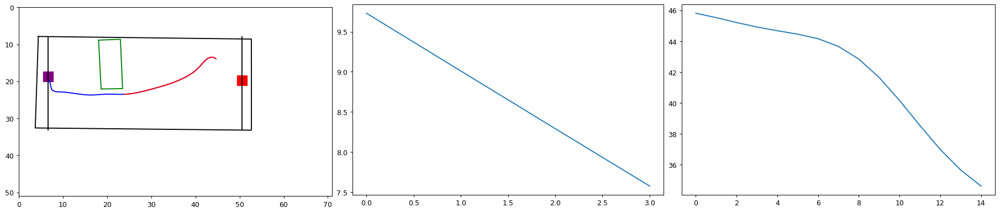

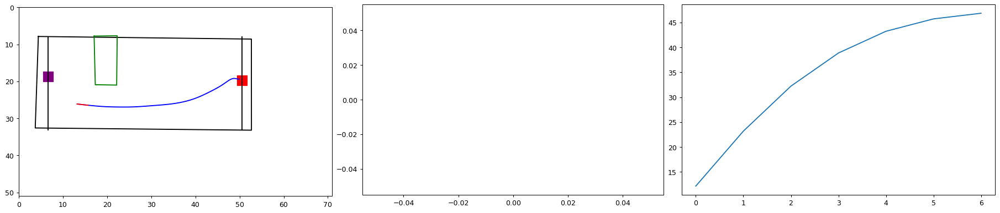

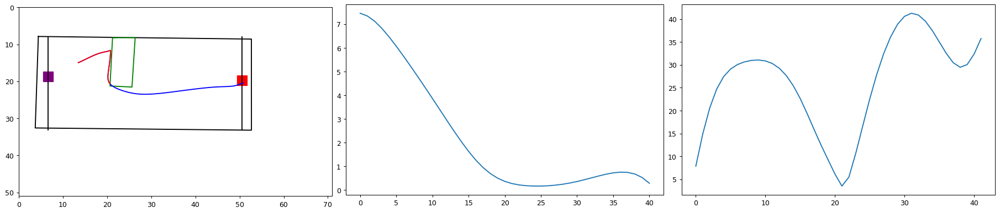

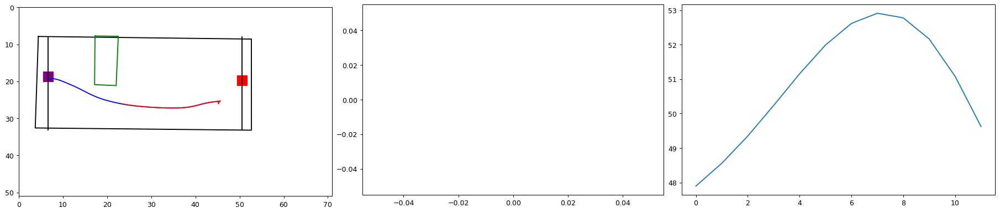

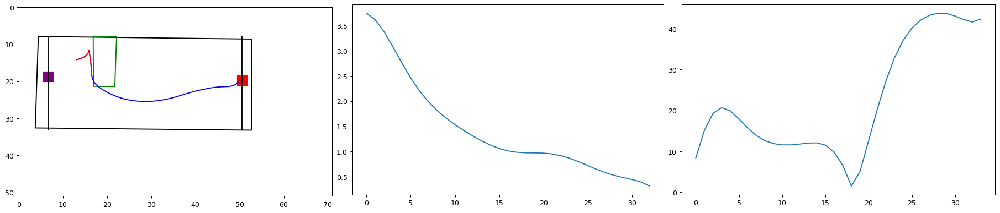

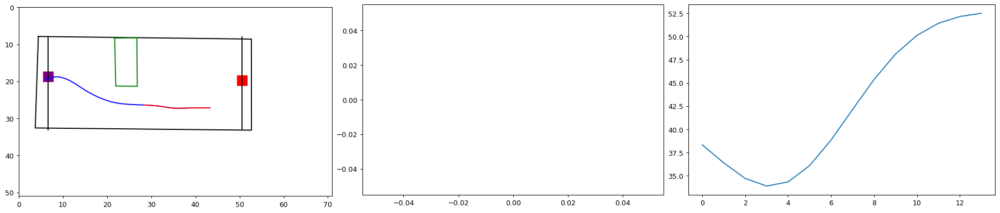

In [1940]:
sample_df =  dark_df[dark_df['obstacle_cluster']==0].sample(10)
for ind,row in sample_df.iterrows():
    trial = sample_df.loc[ind]
    fig = plt.figure(constrained_layout=False, figsize=(20, 8),dpi=90)

    spec2 = gridspec.GridSpec(ncols=3, nrows=1, figure=fig)
    panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
    panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
    panel_3 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[2])
    
    ax1 = fig.add_subplot(panel_1[0,0])
    ax2 = fig.add_subplot(panel_2[0,0])
    ax3 = fig.add_subplot(panel_3[0,0])
    plot_arena(trial,ax1)
    ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                                [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
    #ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
     #                           [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')
    
    ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'blue')
    ax1.plot(trial['ts_nose_x_cm'][:trial.thresh_ind_through_10[-1]],trial['ts_nose_y_cm'][:trial.thresh_ind_through_10[-1]],color = 'red')
    ax3.plot(trial.ts_speed[trial.thresh_ind_through_10.tolist()])
   
    
    
   
    
    
    ax2.plot(trial.distance_from_edge_10)

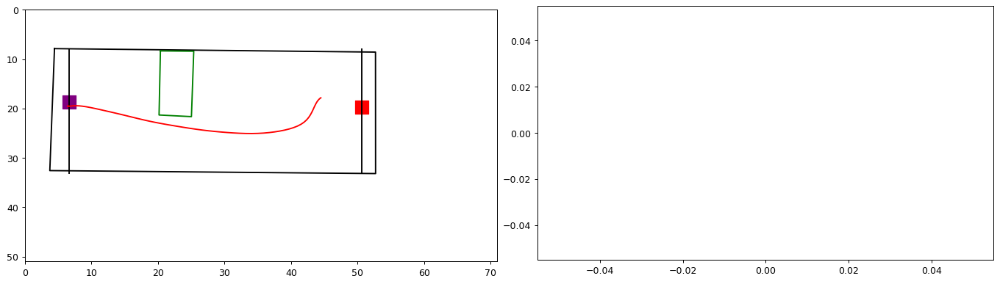

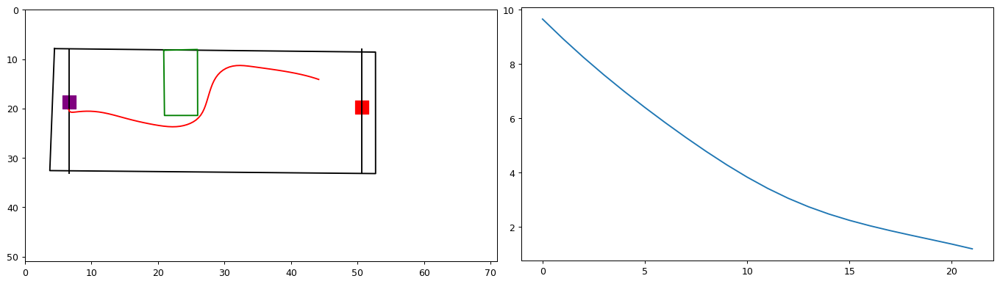

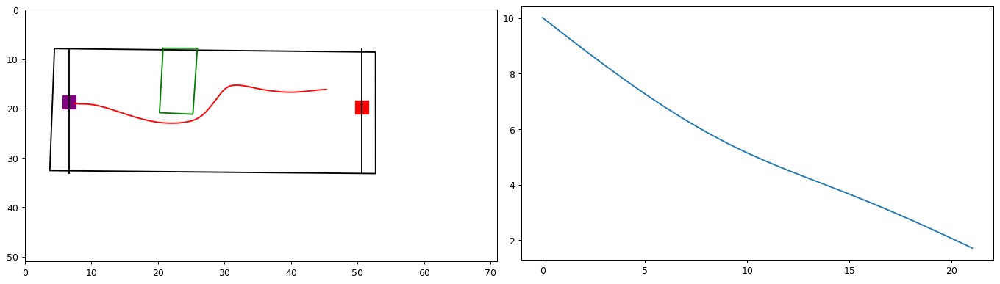

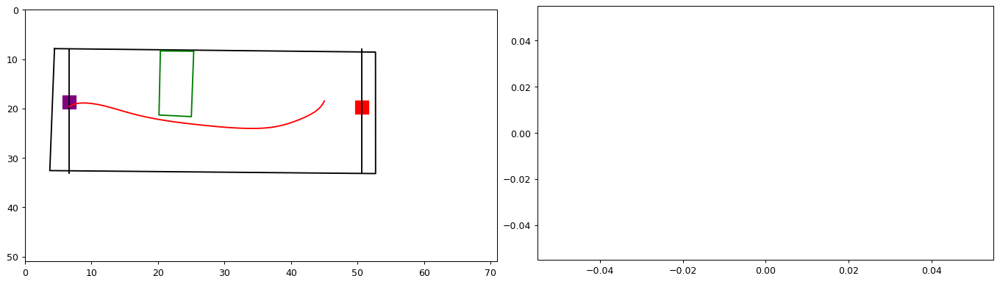

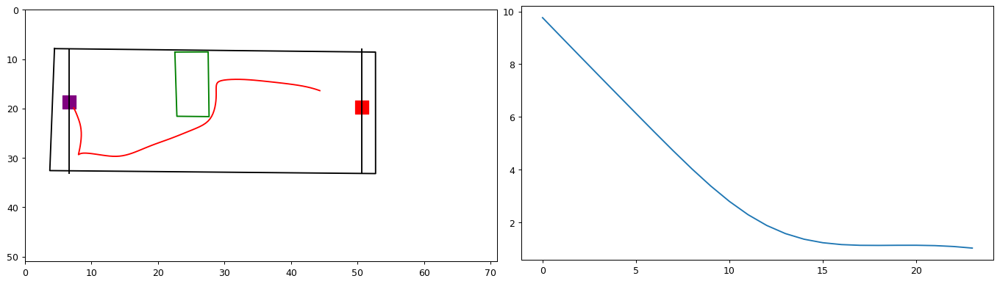

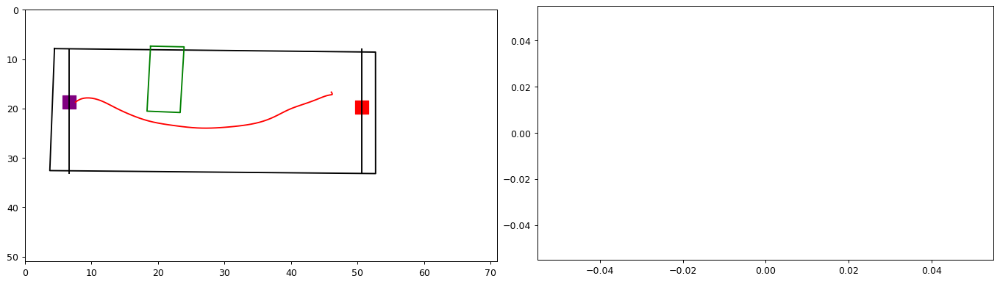

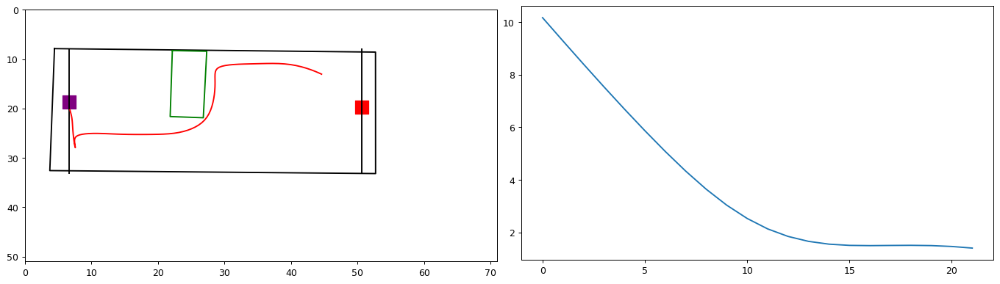

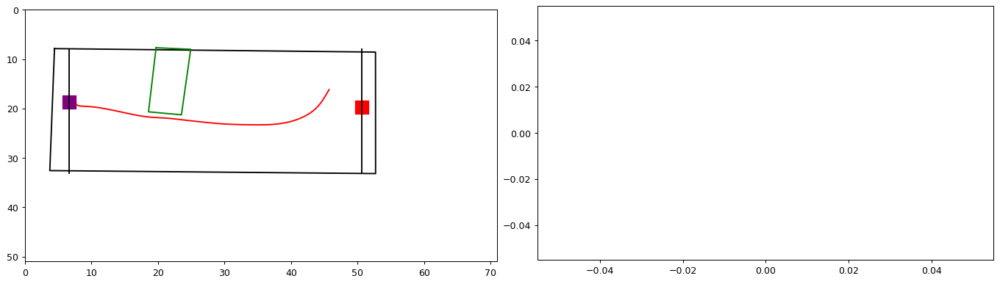

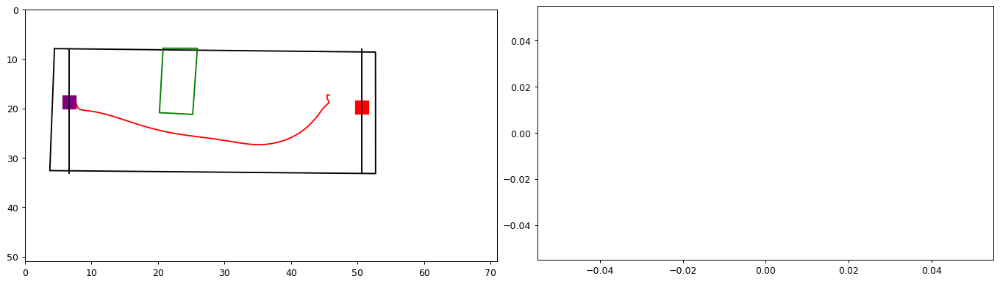

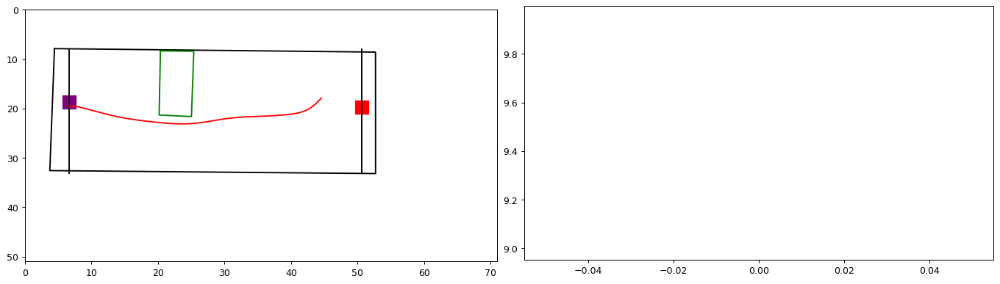

In [1424]:
sample_df =  cluster_4_dark.sample(10)
for ind,row in sample_df.iterrows():
    trial = sample_df.loc[ind]
    fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)

    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
    panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
    
    ax1 = fig.add_subplot(panel_1[0,0])
    ax2 = fig.add_subplot(panel_2[0,0])
    plot_arena(trial,ax1)
    ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                                [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
    #ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
     #                           [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')
    
    ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'red')
   
    
    
   
    
    
    ax2.plot(trial.distance_from_edge_10)
    

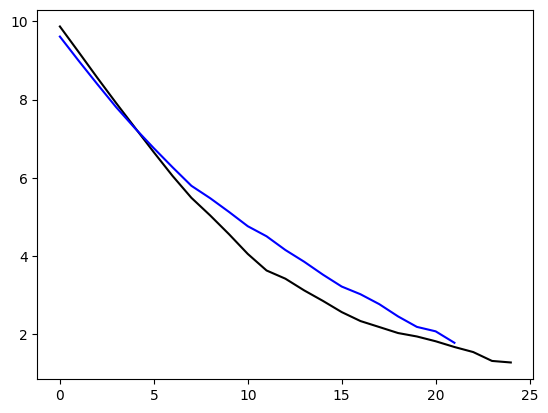

In [1423]:
plt.plot(np.nanmean(cluster_array_dark,axis = 0),c = 'black')
plt.plot(np.nanmean(cluster_array,axis = 0),c = 'blue')


In [1134]:
light_df.angle_to_open_corner_10

AttributeError: 'DataFrame' object has no attribute 'angle_to_open_corner_10'

In [ ]:

#cluster_4_light = light_df[(light_df['obstacle_cluster']==0) & (light_df['start']=='top') & (light_df['odd']=='right')  ]
#cluster_4_dark = dark_df[(dark_df['obstacle_cluster']==0) & (dark_df['start']=='top') & (dark_df['odd']=='right')   ]
cluster = 0 
start = 'top'
direction = 'right'

cut_off_light = int(light_df.len_distance_from_edge_20[(light_df['obstacle_cluster']==cluster)  & (light_df['start']== start) & (light_df['odd']==direction) ].mean())
cut_off_dark = int(dark_df.len_distance_from_edge_20[(dark_df['obstacle_cluster']==cluster)  & (dark_df['start']==start) & (dark_df['odd']==direction) ].mean())

cluster_4_light = light_df[(light_df['obstacle_cluster']==cluster) & (light_df['start']==start) & (light_df['odd']==direction) & (light_df['len_distance_from_edge_20']<=cut_off_light)  ]
cluster_4_dark = dark_df[(dark_df['obstacle_cluster']==cluster) & (dark_df['start']==start) & (dark_df['odd']==direction) & (dark_df['len_distance_from_edge_20']<=cut_off_dark)  ]
data = cluster_4_light
max_len = int(data.len_distance_from_edge_20.max())
rows = data.size
cluster_array = np.empty([rows,max_len])
cluster_array[:] =np.nan 

for ind,row in enumerate(data.iterrows()):
    length = row[1]['distance_from_edge_20'].size
    cluster_array[ind][:length] = row[1]['distance_from_edge_20']
    
data = cluster_4_dark
max_len = int(data.len_distance_from_edge_20.max())
rows = data.size
cluster_array_dark = np.empty([rows,max_len])
cluster_array_dark[:] =np.nan 

for ind,row in enumerate(data.iterrows()):
    length = row[1]['distance_from_edge_20'].size
    cluster_array_dark[ind][:length] = row[1]['distance_from_edge_20']


In [ ]:
def calculate_distance_to_obstacle_edge_whole_trace(df,thresh):
    ts_postition_through_threshold(df,thresh)
    for direction, direction_frame in df.groupby(['odd']):
        for ind,row in direction_frame.iterrows():  
            if direction == 'right':
                try:
                    min = list(row['thresh_ind_through_'+str(thresh)])[0]
                    max = list(row['thresh_ind_through_'+str(thresh)])[-1]
                    nose_x = row['ts_nose_x_cm'][min:max]
                    nose_y = row['ts_nose_y_cm'][min:max]
                    distances = []
                    for i,e in enumerate(nose_x):
                        obstalce_x = np.mean([row['gt_obstacleTR_x_cm'],row['gt_obstacleBR_x_cm']]) 
                        if nose_y[i] > row['gt_obstacleTR_y_cm'] and nose_y[i] < row['gt_obstacleBR_y_cm']:
                            obstalce_y = nose_y[i]
                            distance = np.abs(calculate_distances(nose_x[i],nose_y[i],obstalce_x,obstalce_y))
                            distances.append(distance)
                        else:
                            
                            distances.append(np.nan)
                except IndexError:
                    distances.append(np.nan)

                
                df.at[ind,'distance_from_edge_'+str(thresh)] = np.array(distances).astype(object)
                df.at[ind,'len_distance_from_edge_'+str(thresh)] = np.array(distances).astype(object).size
            if direction =='left':
                try:
                    min = list(row['thresh_ind_through_'+str(thresh)])[0]
                    max = list(row['thresh_ind_through_'+str(thresh)])[-1]
                    nose_x = row['ts_nose_x_cm'][min:max]
                    nose_y = row['ts_nose_y_cm'][min:max]
                    distances = []
                    for i,e in enumerate(nose_x):
                        obstalce_x = np.mean([row['gt_obstacleTL_x_cm'],row['gt_obstacleBL_x_cm']]) 
                        if nose_y[i] > row['gt_obstacleTL_y_cm'] and nose_y[i] < row['gt_obstacleBL_y_cm']:
                            obstalce_y = nose_y[i]
                            distance = np.abs(calculate_distances(nose_x[i],nose_y[i],obstalce_x,obstalce_y))
                            distances.append(distance)
                        else:
                            distances.append(np.nan)
                except IndexError:
                    distances.append(np.nan)
            
                
                df.at[ind,'distance_from_edge_'+str(thresh)] = np.array(distances).astype(object)
                df.at[ind,'len_distance_from_edge_'+str(thresh)] = np.array(distances).astype(object).size
        

In [1857]:
def calculate_distance_to_obstacle_edge(df,thresh):
    ts_postition_through_threshold(df,thresh)
    for direction, direction_frame in df.groupby(['odd']):
        for ind,row in direction_frame.iterrows():  
            if direction == 'right':
                try:
                    min = list(row['thresh_ind_through_'+str(thresh)])[0]
                    max = list(row['thresh_ind_through_'+str(thresh)])[-1]
                    nose_x = row['ts_nose_x_cm'][min:max]
                    nose_y = row['ts_nose_y_cm'][min:max]
                    distances = []
                    for i,e in enumerate(nose_x):
                        obstalce_x = np.mean([row['gt_obstacleTR_x_cm'],row['gt_obstacleBR_x_cm']]) 
                        if nose_y[i] > row['gt_obstacleTR_y_cm'] and nose_y[i] < row['gt_obstacleBR_y_cm']:
                            obstalce_y = nose_y[i]
                            distance = np.abs(calculate_distances(nose_x[i],nose_y[i],obstalce_x,obstalce_y))
                            distances.append(distance)
                        else:
                            distances.append(np.nan)
                            #distance_to_top = np.abs(calculate_distances(nose_x[i],nose_y[i],obstalce_x,row['gt_obstacleTR_y_cm']))
                            #distance_to_bottom = np.abs(calculate_distances(nose_x[i],nose_y[i],obstalce_x,row['gt_obstacleBR_y_cm']))
                            #if distance_to_top < distance_to_bottom:
                            #    distance = distance_to_top
                            #    distances.append(distance)
                            #if distance_to_top > distance_to_bottom:
                            #    distance = distance_to_bottom
                            #    distances.append(distance)
                except IndexError:
                    distances.append(np.nan)

                
                df.at[ind,'distance_from_edge_'+str(thresh)] = np.array(distances).astype(object)
                df.at[ind,'len_distance_from_edge_'+str(thresh)] = np.array(distances).astype(object).size
            if direction =='left':
                try:
                    min = list(row['thresh_ind_through_'+str(thresh)])[0]
                    max = list(row['thresh_ind_through_'+str(thresh)])[-1]
                    nose_x = row['ts_nose_x_cm'][min:max]
                    nose_y = row['ts_nose_y_cm'][min:max]
                    distances = []
                    for i,e in enumerate(nose_x):
                        obstalce_x = np.mean([row['gt_obstacleTL_x_cm'],row['gt_obstacleBL_x_cm']]) 
                        if nose_y[i] > row['gt_obstacleTL_y_cm'] and nose_y[i] < row['gt_obstacleBL_y_cm']:
                            obstalce_y = nose_y[i]
                            distance = np.abs(calculate_distances(nose_x[i],nose_y[i],obstalce_x,obstalce_y))
                            distances.append(distance)
                        else:
                            distances.append(np.nan)
                            #distance_to_top = np.abs(calculate_distances(nose_x[i],nose_y[i],obstalce_x,row['gt_obstacleTL_y_cm']))
                            #distance_to_bottom = np.abs(calculate_distances(nose_x[i],nose_y[i],obstalce_x,row['gt_obstacleBL_y_cm']))
                            #if distance_to_top < distance_to_bottom:
                            #    distance = distance_to_top
                            #    distances.append(distance)
                            #if distance_to_top > distance_to_bottom:
                            #    distance = distance_to_bottom
                            #    distances.append(distance)
                except IndexError:
                    distances.append(np.nan)
            
                
                df.at[ind,'distance_from_edge_'+str(thresh)] = np.array(distances).astype(object)
                df.at[ind,'len_distance_from_edge_'+str(thresh)] = np.array(distances).astype(object).size
        
                        
                        

In [553]:
ts_postition_through_threshold(light_df,20)

(0.0, 70.0)

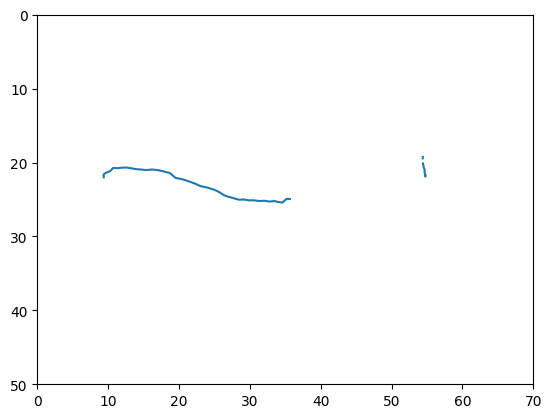

In [542]:
plt.plot(light_df.ts_nose_x_cm.loc[1662 ],light_df.ts_nose_y_cm.loc[1662 ],)
plt.ylim([50,0])
plt.y=xlim([0,70])

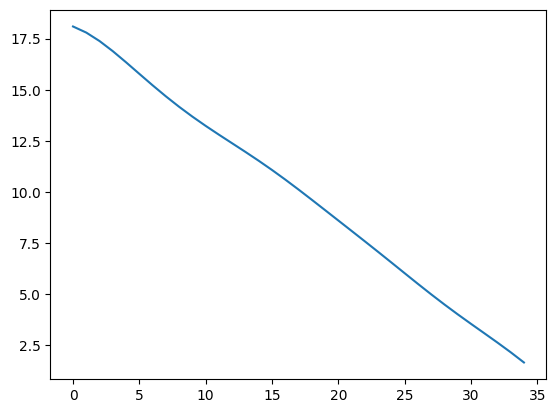

In [535]:
plt.plot(light_df.len_distance_from_edge_20.loc[1662 ])

In [595]:
calculate_distance_to_obstacle_edge(light_df,20)

In [155]:
19 23 27 28

47.238871058525135

[6.18055798]
[5.49635742]
[11.90749792]
[10.05242299]
[10.9280806]
[8.80805372]
[0.6333964]
[8.44479203]
[5.53041502]
[12.42741189]
[5.31031675]
[10.86002173]
[0.84522392]
[0.99592094]
[9.04242201]
[2.35032942]
[1.8567709]
[1.26853262]
[10.7612795]
[14.24910691]
[0.93020256]
[6.04831444]
[2.57554821]
[11.65478809]
[7.10390099]
[11.52288303]
[7.77387005]
[11.60808187]
[5.17171241]
[0.99174801]
[9.1966911]
[2.04475618]
[7.91918776]
[12.08496991]
[5.63001507]
[1.07321193]
[5.72531459]
[8.62342596]
[7.04385509]
[6.39189339]
[9.78986287]
[6.20644983]
[5.59196135]
[6.08293837]
[5.79007684]
[5.85527713]
[1.64342481]
[2.75016273]
[1.88125598]
[1.95643043]


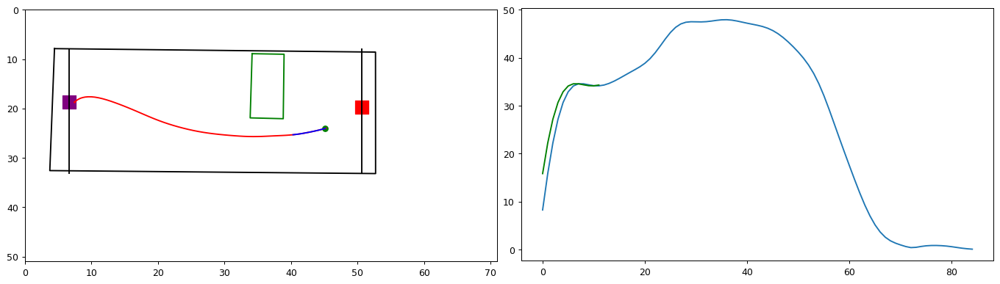

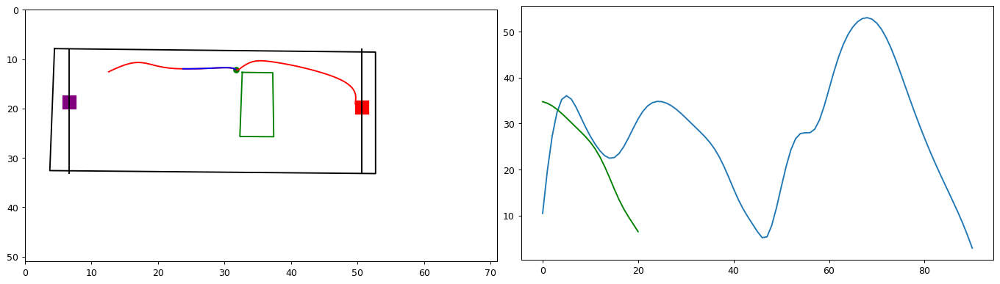

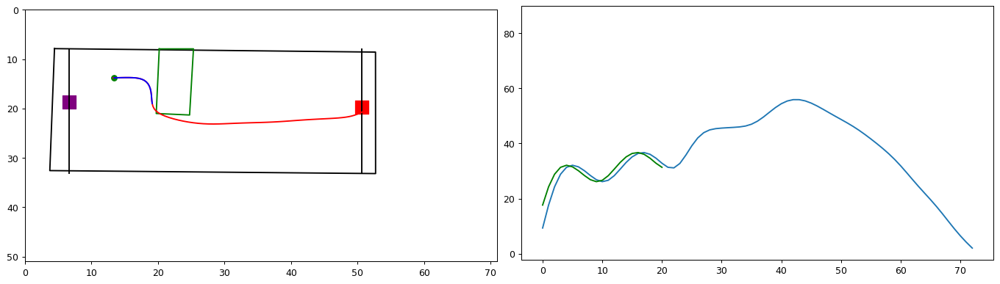

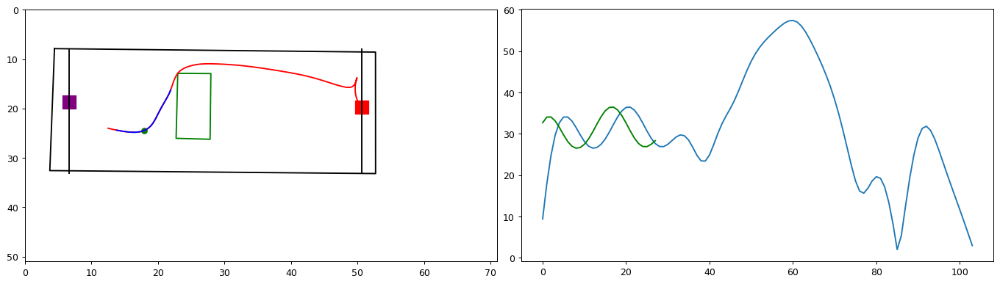

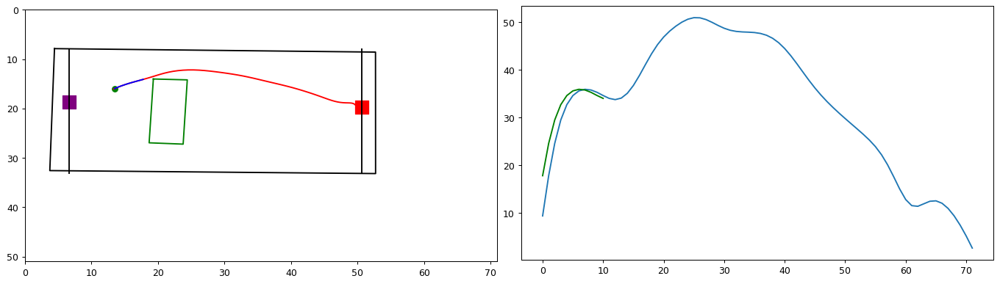

...

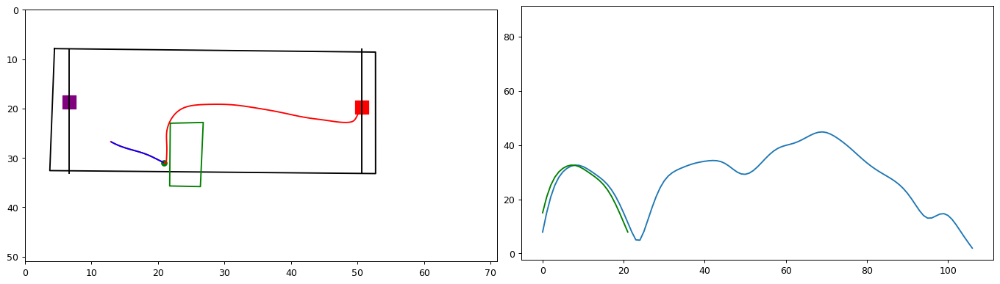

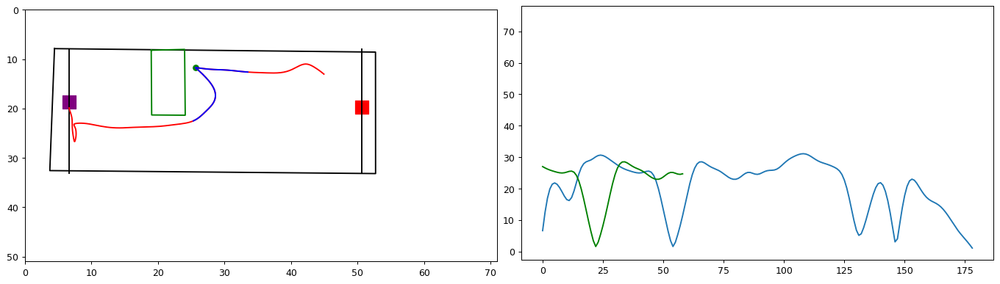

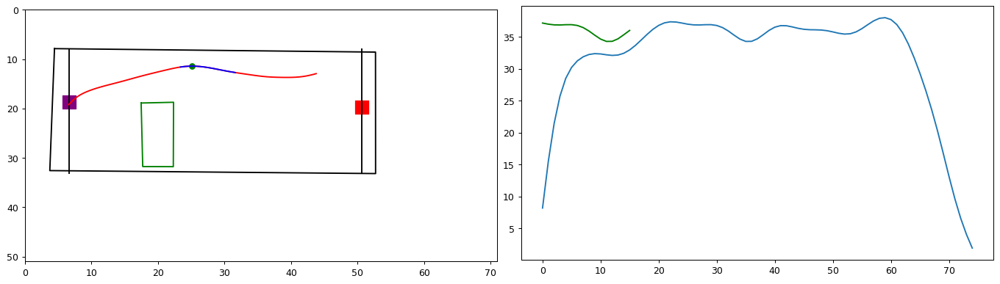

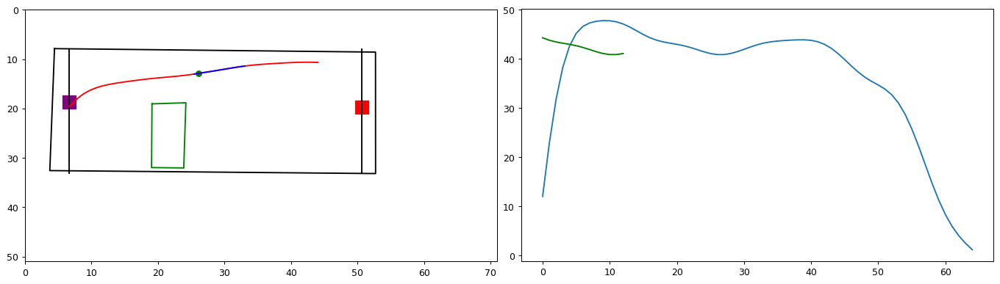

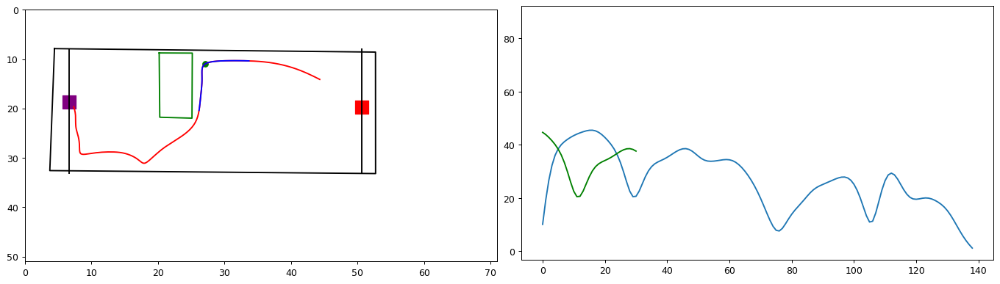

In [189]:
sample_df =  dark_df.sample(50)
for ind,row in sample_df.iterrows():
    trial = sample_df.loc[ind]
    fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)

    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
    panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
    
    ax1 = fig.add_subplot(panel_1[0,0])
    ax2 = fig.add_subplot(panel_2[0,0])
    plot_arena(trial,ax1)
    ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                                [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
    #ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
     #                           [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')
    
    ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'red')
    slow = np.min(trial.ts_speed[list(trial.thresh_ind_through_10+1)])
    slow_ind = np.where(trial.ts_speed == slow )
    ax1.scatter(trial['ts_nose_x_cm'][slow_ind],trial['ts_nose_y_cm'][slow_ind],color = 'green')
    
    
    min = list(trial.thresh_ind_through_10)[0]+1
    max = list(trial.thresh_ind_through_10)[-1]+1
    
    ax1.plot(trial['ts_nose_x_cm'][min:max],trial['ts_nose_y_cm'][min:max],color = 'blue')
    ax2.plot(trial.ts_speed)
    ax2.plot(trial.ts_speed[list(trial.thresh_ind_through_10+1)],color = 'green')
    ax2.plot(trial.angle_to_corner_3)
    print(np.abs(np.diff(np.array([trial['ts_nose_x_cm'][slow_ind][0],trial['gt_obstacleTR_x_cm']]))))

[1.93731326]


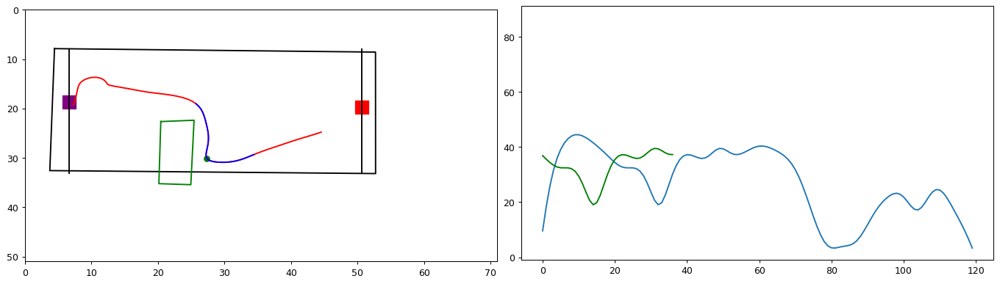

In [2055]:
trial = dark_df.iloc[200]
fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)

spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
plot_arena(trial,ax1)
ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                            [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
#ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
 #                           [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')

ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'red')


#slow = np.min(trial.ts_speed[list(trial.thresh_ind_through_10)])
speed = trial.ts_speed[list(trial.thresh_ind_through_10)]
slow = np.min(trial.ts_speed[list(trial.thresh_ind_through_10)])
slow_ind = np.where(trial.ts_speed == slow )[0] +1 

ax1.scatter(trial['ts_nose_x_cm'][slow_ind],trial['ts_nose_y_cm'][slow_ind],color = 'green')


min = list(trial.thresh_ind_through_10)[0]+1
max = list(trial.thresh_ind_through_10)[-1]+1

ax1.plot(trial['ts_nose_x_cm'][min:max],trial['ts_nose_y_cm'][min:max],color = 'blue')
ax2.plot(trial.ts_speed)
ax2.plot(trial.ts_speed[list(trial.thresh_ind_through_10+1)],color = 'green')
ax2.plot(trial.angle_to_corner_3)
print(np.abs(np.diff(np.array([trial['ts_nose_x_cm'][slow_ind][0],trial['gt_obstacleTR_x_cm']]))))

[2.44391257]


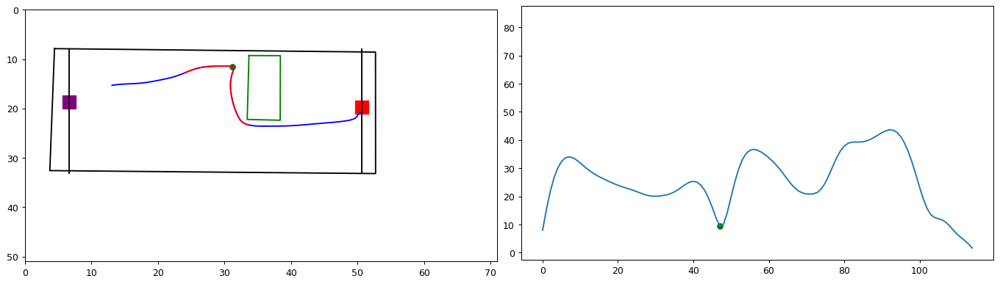

In [2087]:
trial = dark_df.iloc[266]
fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)

spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
plot_arena(trial,ax1)
ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                            [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
#ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
 #                           [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')

ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'blue')


slow = np.min(trial.ts_speed[list(trial.thresh_ind_through_10)])
#speed = trial.ts_speed[list(trial.thresh_ind_through_10)]
#slow = speed[np.abs(speed -10).argmin()]
slow_ind = np.where(trial.ts_speed == slow )[0]  

ax1.scatter(trial['ts_nose_x_cm'][slow_ind],trial['ts_nose_y_cm'][slow_ind],color = 'green')


min = list(trial.thresh_ind_through_10)[0]+1
max = list(trial.thresh_ind_through_10)[-1]+1

ax1.plot(trial['ts_nose_x_cm'][min:max],trial['ts_nose_y_cm'][min:max],color = 'red')
ax2.plot(trial.ts_speed)
ax2.scatter(slow_ind,trial.ts_speed[slow_ind],color = 'green')
ax2.plot(trial.angle_to_corner_3)
print(np.abs(np.diff(np.array([trial['ts_nose_x_cm'][slow_ind][0],trial['gt_obstacleTL_x_cm']]))))

[4.54284274]


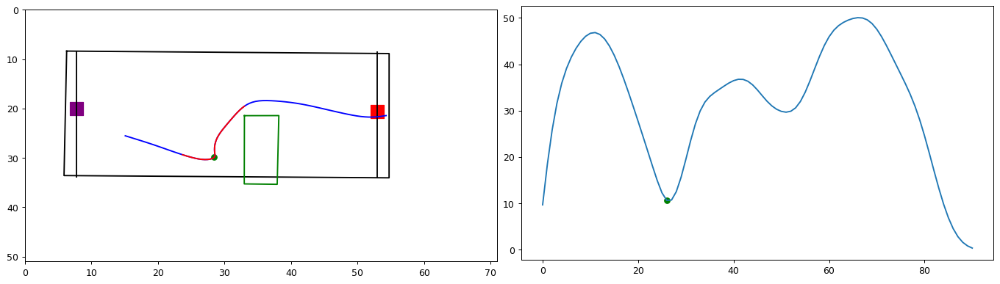

In [2088]:
trial = light_df.iloc[777]
fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)

spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
plot_arena(trial,ax1)
ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                            [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
#ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
 #                           [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')

ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'blue')


slow = np.min(trial.ts_speed[list(trial.thresh_ind_through_10)])
#speed = trial.ts_speed[list(trial.thresh_ind_through_10)]
#slow = speed[np.abs(speed -10).argmin()]
slow_ind = np.where(trial.ts_speed == slow )[0] 

ax1.scatter(trial['ts_nose_x_cm'][slow_ind],trial['ts_nose_y_cm'][slow_ind],color = 'green')


min = list(trial.thresh_ind_through_10)[0]+1
max = list(trial.thresh_ind_through_10)[-1]+1

ax1.plot(trial['ts_nose_x_cm'][min:max],trial['ts_nose_y_cm'][min:max],color = 'red')
ax2.plot(trial.ts_speed)
ax2.scatter(slow_ind,trial.ts_speed[slow_ind],color = 'green')
ax2.plot(trial.angle_to_corner_3)
print(np.abs(np.diff(np.array([trial['ts_nose_x_cm'][slow_ind][0],trial['gt_obstacleTL_x_cm']]))))



In [138]:
def plot_distance_at_turn_histogram_sample(df,thresh,bin_num,label):
    """Direction by key obstalce trials"""
    calculate_distance_at_turn(df,thresh)
    fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    """Right"""
    panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    ax2 = fig.add_subplot(panel_1[0,1])
    ax3 = fig.add_subplot(panel_1[1,0])
    ax4 = fig.add_subplot(panel_1[1,1])
    ax5 = fig.add_subplot(panel_1[2,0])
    ax6 = fig.add_subplot(panel_1[2,1])
    right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]

    """Left """
    panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
    ax7 = fig.add_subplot(panel_2[0,0])
    ax8 = fig.add_subplot(panel_2[0,1])
    ax9 = fig.add_subplot(panel_2[1,0])
    ax10 = fig.add_subplot(panel_2[1,1])
    ax11= fig.add_subplot(panel_2[2,0])
    ax12 = fig.add_subplot(panel_2[2,1])
    left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]
    """ plot histogram"""
    right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
    left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))

   

    for direction, direction_frame in df.groupby(['odd']):
        for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
            for start, start_frame in cluster_frame.groupby(['start']):
                if cluster == 0 or cluster ==1:
                    if direction == 'right' and start == 'top' :
                        
                        right_obstacle_axis = right_obstacle_dict.get(cluster)
                        right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                        #right_obstacle_axis.hist(np.concatenate(start_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(start_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.hist(start_frame['distance_at_turn_'+ str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                       
                      

                        #right_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.set_xlabel('cm')
                        
                        right_obstacle_axis.legend( loc='upper right')
                    if direction == 'right' and start == 'bottom':
                        continue




                    if direction == 'left'  and start == 'top':
                        left_obstacle_axis = left_obstacle_dict.get(cluster)
                        left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                        #left_obstacle_axis.hist(np.concatenate(start_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(start_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.hist(start_frame['distance_at_turn_'+ str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)

                        #left_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.set_xlabel('cm')
                        
                        left_obstacle_axis.legend( loc='upper right')
                    if direction == 'left' and start == 'bottom':
                        continue

                if cluster == 2 or cluster == 3:
                    if direction == 'right' and start == 'top':
                        continue
                    if direction == 'right':
                        right_obstacle_axis = right_obstacle_dict.get(cluster)
                        right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                        #right_obstacle_axis.hist(np.concatenate(cluster_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='facing',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(cluster_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='non facing',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.hist(start_frame['distance_at_turn_'+ str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        
                        

                        #right_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                        right_obstacle_axis.set_xlabel('cm')
                        
                        right_obstacle_axis.legend( loc='upper right')


                    if direction == 'left' and start == 'top':
                        continue
                    if direction == 'left':
                        left_obstacle_axis = left_obstacle_dict.get(cluster)
                        left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                        #left_obstacle_axis.hist(np.concatenate(start_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='facing',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(start_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='non facing',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.hist(start_frame['distance_at_turn_'+ str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)

                        
                        #left_obstacle_axis.hist(np.concatenate(num_close_bottom['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='bottom',alpha = .5,bins=bin_num,density = True)
                        left_obstacle_axis.set_xlabel('cm')
                        
                        left_obstacle_axis.legend( loc='upper right')
                if cluster == 4 or cluster == 5:
                    


                    if direction == 'right' and start == 'bottom':
                        right_obstacle_axis = right_obstacle_dict.get(cluster)
                        right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                        #right_obstacle_axis.hist(np.concatenate(num_close_top['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(start_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(start_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)

                        right_obstacle_axis.hist(start_frame['distance_at_turn_'+ str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        
                        right_obstacle_axis.set_xlabel('cm')
                        
                        right_obstacle_axis.legend( loc='upper right')
                    if direction == 'right' and start == 'top':
                        continue



                    if direction == 'left' and start == 'bottom':
                        left_obstacle_axis = left_obstacle_dict.get(cluster)
                        left_obstacle_axis.set_title(str(cluster)+' ' + str(label))
                        #left_obstacle_axis.hist(np.concatenate(num_close_top['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='top',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(start_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #left_obstacle_axis.hist(np.concatenate(start_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)

                        left_obstacle_axis.hist(start_frame['distance_at_turn_'+ str(thresh)].to_numpy().ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        
                        left_obstacle_axis.set_xlabel('cm')
                        
                        left_obstacle_axis.legend( loc='upper right')
                    if direction == 'left' and start == 'top':
                        continue

In [1856]:
def calculate_distance_at_turn(df,thresh):
    '''finds distance from obstacle when mouse is turnin around obstacle. Uses the min speed 10 cm from obstalce edge'''
    calculate_speed(df)
    ts_postition_through_threshold(df,thresh)
    
    
    for direction, direction_frame in df.groupby(['odd']):
        for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
            for start, start_frame in cluster_frame.groupby(['start']):
                if cluster == 0 or cluster ==1:
                    if direction == 'right' and start == 'top' :
                        for ind,row in start_frame.iterrows():
                            try:
                                slow = np.min(row['ts_speed'][list(row['thresh_ind_through_'+str(thresh)])])
                                slow_ind = np.where(row['ts_speed'] == slow )
                                distance_from_corner = np.abs(np.diff(np.array([row['ts_nose_x_cm'][slow_ind][0],row['gt_obstacleTR_x_cm']])))
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = distance_from_corner
                            except ValueError:
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = np.nan





                    if direction == 'right' and start == 'bottom':
                        for ind,row in start_frame.iterrows():
                            df.at[ind,'distance_at_turn_'+ str(thresh)] = np.nan
                    if direction == 'left'  and start == 'top':
                        for ind,row in start_frame.iterrows():
                            try:
                                slow = np.min(row['ts_speed'][list(row['thresh_ind_through_'+str(thresh)])])
                                slow_ind = np.where(row['ts_speed'] == slow )
                                distance_from_corner = np.abs(np.diff(np.array([row['ts_nose_x_cm'][slow_ind][0],row['gt_obstacleTL_x_cm']])))
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = distance_from_corner
                            except ValueError:
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = np.nan


                    
                    if direction == 'left' and start == 'bottom':
                        for ind,row in start_frame.iterrows():
                            df.at[ind,'distance_at_turn_'+ str(thresh)] = np.nan
                if cluster == 2 or cluster == 3:
                    if direction == 'right' and start == 'top':
                        for ind,row in start_frame.iterrows():
                            try:
                                slow = np.min(row['ts_speed'][list(row['thresh_ind_through_'+str(thresh)])])
                                slow_ind = np.where(row['ts_speed'] == slow )
                                distance_from_corner = np.abs(np.diff(np.array([row['ts_nose_x_cm'][slow_ind][0],row['gt_obstacleTR_x_cm']])))
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = distance_from_corner
                            except ValueError:
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = np.nan

                    if direction == 'right' and start == 'bottom':
                        for ind,row in start_frame.iterrows():
                            try:
                                slow = np.min(row['ts_speed'][list(row['thresh_ind_through_'+str(thresh)])])
                                slow_ind = np.where(row['ts_speed'] == slow )
                                distance_from_corner = np.abs(np.diff(np.array([row['ts_nose_x_cm'][slow_ind][0],row['gt_obstacleBR_x_cm']])))
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = distance_from_corner
                            except ValueError:
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = np.nan


                    if direction == 'left' and start == 'top':
                        for ind,row in start_frame.iterrows():
                            try:
                                slow = np.min(row['ts_speed'][list(row['thresh_ind_through_'+str(thresh)])])
                                slow_ind = np.where(row['ts_speed'] == slow )
                                distance_from_corner = np.abs(np.diff(np.array([row['ts_nose_x_cm'][slow_ind][0],row['gt_obstacleTL_x_cm']])))
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = distance_from_corner
                            except ValueError:
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = np.nan

                        
                    if direction == 'left'and start == 'bottom':
                        for ind,row in start_frame.iterrows():
                            try:
                                slow = np.min(row['ts_speed'][list(row['thresh_ind_through_'+str(thresh)])])
                                slow_ind = np.where(row['ts_speed'] == slow )
                                distance_from_corner = np.abs(np.diff(np.array([row['ts_nose_x_cm'][slow_ind][0],row['gt_obstacleBL_x_cm']])))
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = distance_from_corner
                            except ValueError:
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = np.nan


                if cluster == 4 or cluster == 5:

                    if direction == 'right' and start == 'bottom':
                        for ind,row in start_frame.iterrows():
                            try:
                                slow = np.min(row['ts_speed'][list(row['thresh_ind_through_'+str(thresh)])])
                                slow_ind = np.where(row['ts_speed'] == slow )
                                distance_from_corner = np.abs(np.diff(np.array([row['ts_nose_x_cm'][slow_ind][0],row['gt_obstacleBR_x_cm']])))
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = distance_from_corner
                            except ValueError:
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = np.nan


                    if direction == 'right' and start == 'top':
                        for ind,row in start_frame.iterrows():
                            df.at[ind,'distance_at_turn_'+ str(thresh)] = np.nan
                    if direction == 'left' and start == 'bottom':
                        for ind,row in start_frame.iterrows():
                            try:
                                slow = np.min(row['ts_speed'][list(row['thresh_ind_through_'+str(thresh)])])
                                slow_ind = np.where(row['ts_speed'] == slow )
                                distance_from_corner = np.abs(np.diff(np.array([row['ts_nose_x_cm'][slow_ind][0],row['gt_obstacleBL_x_cm']])))
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = distance_from_corner
                            except ValueError:
                                df.at[ind,'distance_at_turn_'+ str(thresh)] = np.nan
                    
                    if direction == 'left' and start == 'top':
                        for ind,row in start_frame.iterrows():
                            df.at[ind,'distance_at_turn_'+ str(thresh)] = np.nan

def calculate_speed(df):
    for ind, row in df.iterrows():
        x_positions, y_positions, fps = row['ts_nose_x_cm'], row['ts_nose_y_cm'], 60
        # Calculate the change in positions between frames
        delta_x = np.diff(x_positions.astype(float))
        delta_y = np.diff(y_positions.astype(float))

        # Calculate the Euclidean distance between consecutive positions
        distance = np.sqrt(delta_x**2 + delta_y**2)

        # Calculate the time interval between frames
        time_interval = 1 / fps

        # Calculate the speed in cm/s
        speed = distance / time_interval
        speed = speed.astype(float)
        distance = distance.astype(float)

        df.at[ind, 'ts_speed'] = speed.astype(object)
        df.at[ind, 'ts_distance'] = sum(distance).astype(object)
def ts_postition_through_threshold(df,thresh):
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm'])) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh))))
                                thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                thresh_nose_y = row['ts_nose_y_cm'][pos_inds]                                
                                df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                df.at[ind,'thresh_ind_through_'+str(thresh)] = pos_inds[0].astype(object)
                                #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                            if cluster == 2 or cluster == 3:
                                   if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm'])) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh))))                           
                                        thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                        thresh_nose_y = row['ts_nose_y_cm'][pos_inds]
                                        df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                        df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                        df.at[ind,'thresh_ind_through_'+str(thresh)] = pos_inds[0].astype(object)
                                       
                                        
                                   if row['start'] == 'bottom':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm'])) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh))))                    
                                        thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                        thresh_nose_y = row['ts_nose_y_cm'][pos_inds]
                                        df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                        df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                        df.at[ind,'thresh_ind_through_'+str(thresh)] = pos_inds[0].astype(object)
                                       
                                        
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm'])) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh))))
                                thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                thresh_nose_y = row['ts_nose_y_cm'][pos_inds]                                
                                df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                df.at[ind,'thresh_ind_through_'+str(thresh)] = pos_inds[0].astype(object)
                        if direction == 'left':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm'])) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh))))
                                thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                thresh_nose_y = row['ts_nose_y_cm'][pos_inds]                                
                                df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                df.at[ind,'thresh_ind_through_'+str(thresh)] = pos_inds[0].astype(object)
                                 
                            if cluster == 2 or cluster == 3:
                                 if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm'])) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh))))
                                        thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                        thresh_nose_y = row['ts_nose_y_cm'][pos_inds]
                                        df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                        df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                        df.at[ind,'thresh_ind_through_'+str(thresh)] = pos_inds[0].astype(object) 
                                       
                                 
                                        
                                 if row['start'] == 'bottom':
                                        pos_inds =   np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm'])) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh))))
                                        thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                        thresh_nose_y = row['ts_nose_y_cm'][pos_inds]
                                        df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                        df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                        df.at[ind,'thresh_ind_through_'+str(thresh)] = pos_inds[0].astype(object)
                                       
                                 
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm'])) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh))))
                                thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                thresh_nose_y = row['ts_nose_y_cm'][pos_inds]                                
                                df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                df.at[ind,'thresh_ind_through_'+str(thresh)] = pos_inds[0].astype(object)

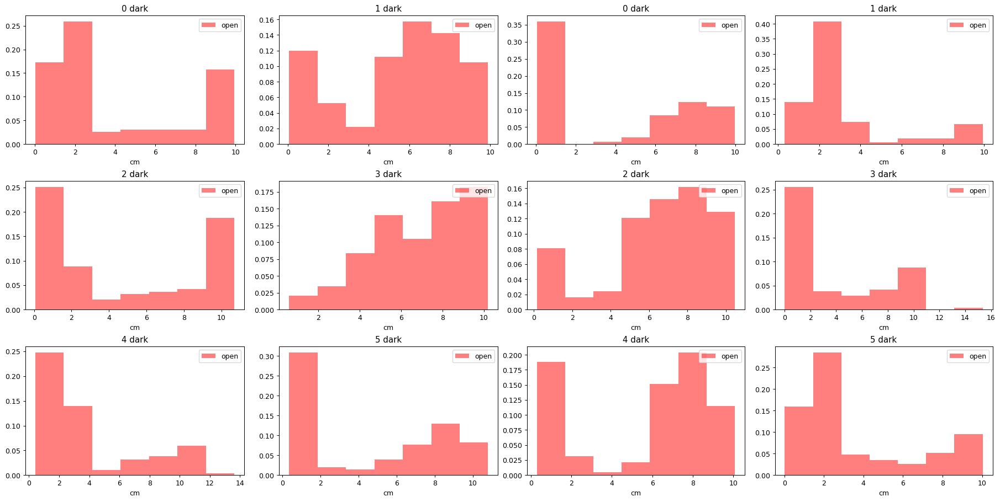

In [2089]:
plot_distance_at_turn_histogram_sample(dark_df,10,7,'dark')

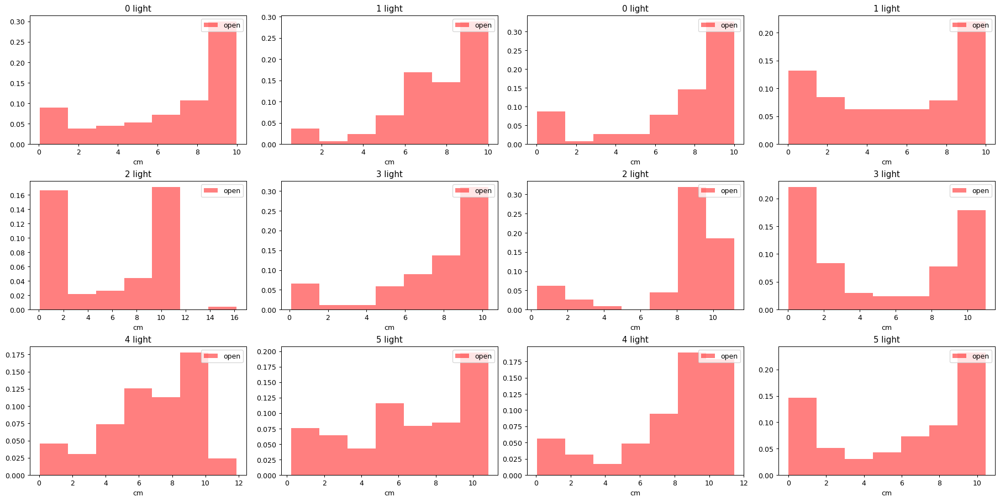

In [2090]:
plot_distance_at_turn_histogram_sample(light_df,10,7,'light')


In [162]:
def plot_trials_at_turn(df,thresh,sample,label):
    """Direction by key obstalce trials"""

   
    fig = plt.figure(constrained_layout=False, figsize=(20, 10),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    """Right"""
    panel_1 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    plot_arena(df,ax1)
    ax2 = fig.add_subplot(panel_1[0,1])
    plot_arena(df,ax2)
    ax2.set_title('right')
    ax3 = fig.add_subplot(panel_1[1,0])
    plot_arena(df,ax3)
    ax4 = fig.add_subplot(panel_1[1,1])
    plot_arena(df,ax4)
    ax5 = fig.add_subplot(panel_1[2,0])
    plot_arena(df,ax5)
    ax6 = fig.add_subplot(panel_1[2,1])
    plot_arena(df,ax6)
    right_axs = [ax1,ax2,ax3,ax4,ax5,ax6]

    """Left """
    panel_2 = gridspec.GridSpecFromSubplotSpec(3,2,subplot_spec=spec2[1])
    ax7 = fig.add_subplot(panel_2[0,0])
    plot_arena(df,ax7)
    ax8 = fig.add_subplot(panel_2[0,1])
    plot_arena(df,ax8)
    ax8.set_title('left')
    ax9 = fig.add_subplot(panel_2[1,0])
    plot_arena(df,ax9)
    ax10 = fig.add_subplot(panel_2[1,1])
    plot_arena(df,ax10)
    ax11= fig.add_subplot(panel_2[2,0])
    plot_arena(df,ax11)
    ax12 = fig.add_subplot(panel_2[2,1])
    plot_arena(df,ax12)
    left_axs = [ax7,ax8,ax9,ax10,ax11,ax12]
   
    
    

    """ plot trials"""
    right_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),right_axs))
    left_obstacle_dict = dict(zip(pd.unique(df['obstacle_cluster'].sort_values().to_list()),left_axs))
    for direction, direction_frame in df.groupby(['odd']):
        for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
            for start, start_frame in cluster_frame.groupby(['start']):
                start_frame = start_frame.sample(sample)
                right_obstacle_axis = right_obstacle_dict.get(cluster)
                left_obstalce_axis = left_obstacle_dict.get(cluster)
                plot_obstacle(start_frame,right_obstacle_axis,cluster)
                plot_obstacle(start_frame,left_obstalce_axis,cluster)
                right_obstacle_axis.set_title(str(cluster))
                left_obstalce_axis.set_title(str(cluster))
                if cluster == 0 or cluster ==1:
                    if direction == 'right' and start == 'top' :
                        
                        right_obstacle_axis = right_obstacle_dict.get(cluster)
                        right_obstacle_axis.set_title(str(cluster)+ ' ' + str(label))
                        #right_obstacle_axis.hist(np.concatenate(start_frame['angle_to_corner_'+str(thresh)].to_numpy()).ravel(),color='red',label='open',alpha = .5,bins=bin_num,density = True)
                        #right_obstacle_axis.hist(np.concatenate(start_frame['angle_to_closed_corner_'+str(thresh)].to_numpy()).ravel(),color='blue',label='closed',alpha = .5,bins=bin_num,density = True)
                        for ind,row in start_frame.iterrows():
                            
                            slow = np.min(row.ts_speed[list(row['thresh_ind_through_'+str(thresh)]+1)])
                            slow_ind = np.where(row.ts_speed == slow )
                            right_obstacle_axis.scatter(row['ts_nose_x_cm'][slow_ind],row['ts_nose_y_cm'][slow_ind],color = 'green')
                            min = list(row['thresh_ind_through_'+str(thresh)])[0]+1
                            max = list(row['thresh_ind_through_'+str(thresh)])[-1]+1
                            right_obstacle_axis.plot(row['ts_nose_x_cm'][min:max],row['ts_nose_y_cm'][min:max],color = 'blue')

                    if direction == 'right' and start == 'bottom':
                        continue




                    if direction == 'left'  and start == 'top':
                        continue
                    if direction == 'left' and start == 'bottom':
                        continue

                if cluster == 2 or cluster == 3:
                    if direction == 'right' and start == 'top':
                        continue
                    if direction == 'right':
                        continue
                        
                        

                  


                    if direction == 'left' and start == 'top':
                        continue
                    if direction == 'left':
                        continue
                if cluster == 4 or cluster == 5:
                    continue
                    if direction == 'right' and start == 'top':
                        continue



                    if direction == 'left' and start == 'bottom':
                       continue
                    if direction == 'left' and start == 'top':
                        continue

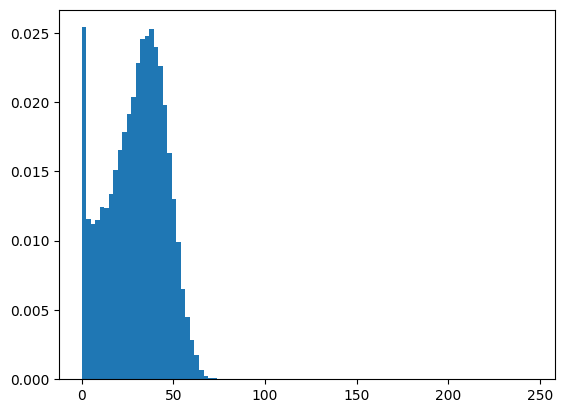

In [322]:
plt.hist(np.concatenate(dark_df.ts_speed.to_numpy()).ravel(),bins = 100,density=True)
plt.show()

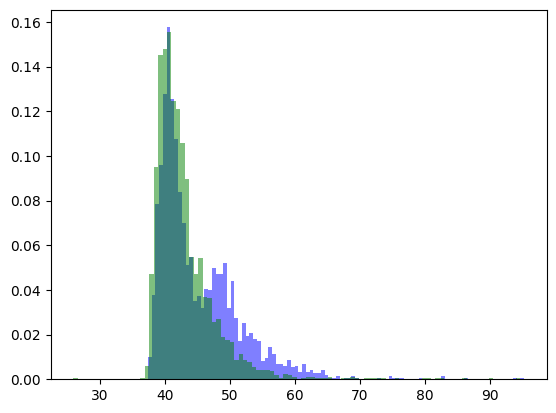

In [341]:

plt.hist(dark_df.ts_distance,bins = 100,density=True,alpha = .5,color = 'blue')
plt.hist(light_df.ts_distance,bins = 100,density=True,alpha = .5,color= 'green')
plt.show()

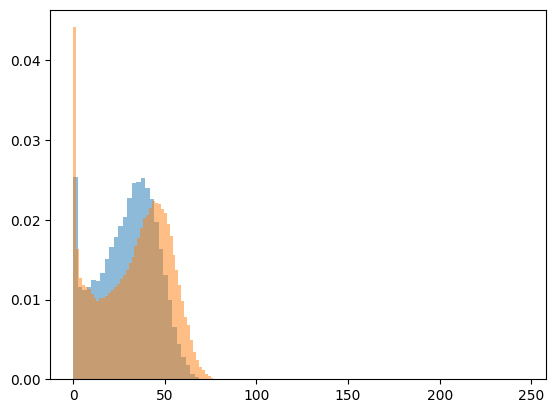

In [326]:

plt.hist(np.concatenate(dark_df.ts_speed.to_numpy()).ravel(),bins = 100,density=True,alpha = .5)
plt.hist(np.concatenate(light_df.ts_speed.to_numpy()).ravel(),bins = 100,density=True,alpha = .5)
plt.show()

In [2132]:
cluster.dist.max()

78.82775086520478

In [2133]:
cluster_dark.dist.max()

48.071912051778725

In [2161]:
trial.angle_to_corner_10

56.0740714988844

In [2162]:
trial.angle_to_closed_corner_10

8.123110427558473

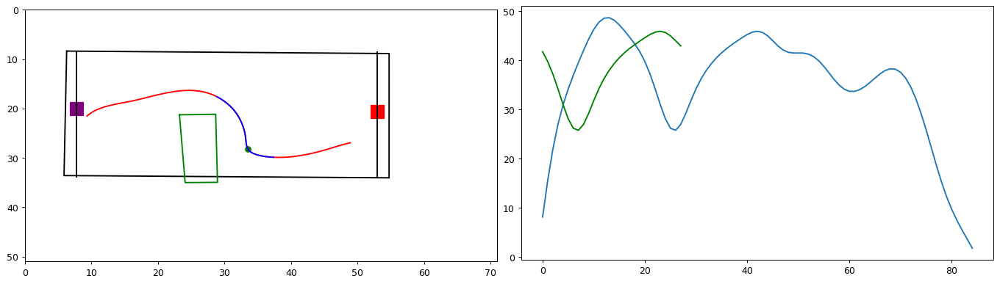

In [2160]:
trial = light_df.iloc[204]
fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)

spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
plot_arena(trial,ax1)
ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                            [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
#ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
 #                           [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')

ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'red')


#slow = np.min(trial.ts_speed[list(trial.thresh_ind_through_10)])
speed = trial.ts_speed[list(trial.thresh_ind_through_10)]
slow = np.min(trial.ts_speed[list(trial.thresh_ind_through_10)])
slow_ind = np.where(trial.ts_speed == slow )[0] +1 

ax1.scatter(trial['ts_nose_x_cm'][slow_ind],trial['ts_nose_y_cm'][slow_ind],color = 'green')


min = list(trial.thresh_ind_through_10)[0]+1
max = list(trial.thresh_ind_through_10)[-1]+1

ax1.plot(trial['ts_nose_x_cm'][min:max],trial['ts_nose_y_cm'][min:max],color = 'blue')
ax2.plot(trial.ts_speed)
ax2.plot(trial.ts_speed[list(trial.thresh_ind_through_10+1)],color = 'green')
ax2.plot(trial.angle_to_corner_3)

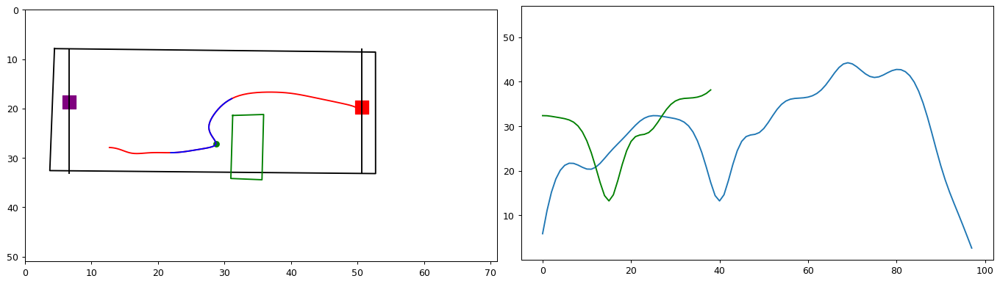

In [2148]:
trial = dark_df.iloc[230]
fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)

spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])

ax1 = fig.add_subplot(panel_1[0,0])
ax2 = fig.add_subplot(panel_2[0,0])
plot_arena(trial,ax1)
ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                            [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
#ax1.plot([np.nanmean(trial['obstacleTL_x_cm']), np.nanmean(trial['obstacleTR_x_cm']), np.nanmean(trial['obstacleBR_x_cm']), np.nanmean(trial['obstacleBL_x_cm']),np.nanmean(trial['obstacleTL_x_cm'])],
 #                           [np.nanmean(trial['obstacleTL_y_cm']), np.nanmean(trial['obstacleTR_y_cm']), np.nanmean(trial['obstacleBR_y_cm']), np.nanmean(trial['obstacleBL_y_cm']),np.nanmean(trial['obstacleTL_y_cm'])],color='red')

ax1.plot(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],color = 'red')


#slow = np.min(trial.ts_speed[list(trial.thresh_ind_through_10)])
speed = trial.ts_speed[list(trial.thresh_ind_through_10)]
slow = np.min(trial.ts_speed[list(trial.thresh_ind_through_10)])
slow_ind = np.where(trial.ts_speed == slow )[0] +1 

ax1.scatter(trial['ts_nose_x_cm'][slow_ind],trial['ts_nose_y_cm'][slow_ind],color = 'green')


min = list(trial.thresh_ind_through_10)[0]+1
max = list(trial.thresh_ind_through_10)[-1]+1

ax1.plot(trial['ts_nose_x_cm'][min:max],trial['ts_nose_y_cm'][min:max],color = 'blue')
ax2.plot(trial.ts_speed)
ax2.plot(trial.ts_speed[list(trial.thresh_ind_through_10+1)],color = 'green')
ax2.plot(trial.angle_to_corner_3)

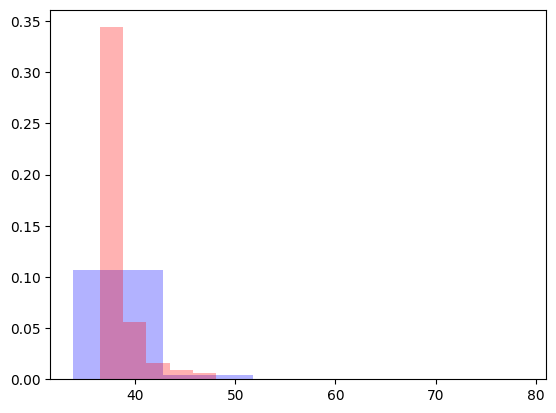

In [2130]:

cluster = light_df[(light_df['obstacle_cluster']==0) & (light_df['odd']=='right') & (light_df['start']=='top')]
cluster_dark = dark_df[(dark_df['obstacle_cluster']==0) & (dark_df['odd']=='right') & (dark_df['start']=='top')]

plt.hist(cluster.dist,bins = 5,density=True,alpha = .3,color = 'blue')
plt.hist(cluster_dark.dist,bins = 5,density=True,alpha = .3,color = 'red')
plt.show()

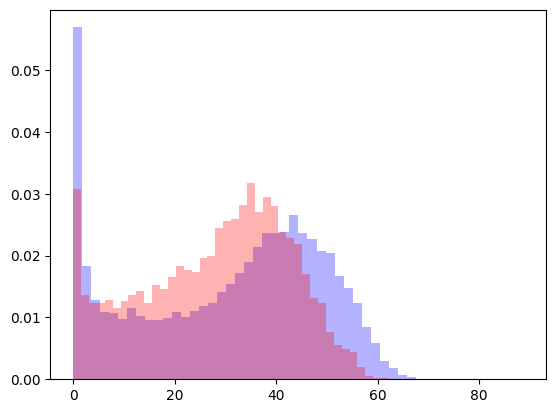

In [2122]:

cluster = light_df[(light_df['obstacle_cluster']==0) & (light_df['odd']=='right') & (light_df['start']=='top')]
cluster_dark = dark_df[(dark_df['obstacle_cluster']==0) & (dark_df['odd']=='right') & (dark_df['start']=='top')]

plt.hist(np.concatenate(cluster.ts_speed.to_numpy()).ravel(),bins = 50,density=True,alpha = .3,color = 'blue')
plt.hist(np.concatenate(cluster_dark.ts_speed.to_numpy()).ravel(),bins = 50,density=True,alpha = .3,color = 'red')
plt.show()



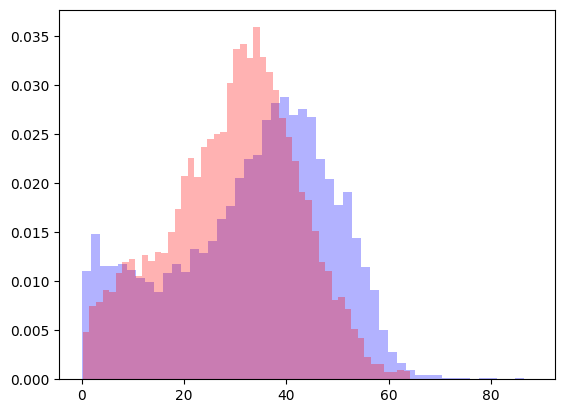

In [2107]:

cluster = light_df[(light_df['obstacle_cluster']==1) & (light_df['odd']=='left') & (light_df['start']=='top')]
cluster_dark = dark_df[(dark_df['obstacle_cluster']==1) & (dark_df['odd']=='left') & (dark_df['start']=='top')]

plt.hist(np.concatenate(cluster.ts_speed.to_numpy()).ravel(),bins = 50,density=True,alpha = .3,color = 'blue')
plt.hist(np.concatenate(cluster_dark.ts_speed.to_numpy()).ravel(),bins = 50,density=True,alpha = .3,color = 'red')
plt.show()

In [ ]:
cut_off_light = int(light_df['len_distance_from_edge_'+str(thresh)][(light_df['obstacle_cluster']==cluster)  & (light_df['start']== start) & (light_df['odd']==direction) ].mean())

In [204]:
np.histogram(np.concatenate(light_df.ts_speed.to_numpy()).ravel(),bins = 3)
#print(len(np.concatenate(light_df.ts_speed.to_numpy()).ravel()))

(array([284489,     47,      1], dtype=int64),
 array([0.0, 93.25256320292816, 186.50512640585632, 279.75768960878446],
       dtype=object))

In [219]:
def get_ts_timestamps(df): 
    for ind, row in df.iterrows(): 
        """interpolate and smooth key points
            interpolate across nans 
            gausian smooth sigma 3 """

        if row['odd'] == 'left':
            nose_list = row['nose_x_cm'] 
            odd_ind = np.argmax(nose_list>10) ## change cut off to be based of port positio
            df.at[ind,'ts_trial_timestamps'] = row['trial_timestamps'][odd_ind:]
            # iterate over columns list 
            #create gt_obstacle points
        else: 
            nose_list = row['nose_x_cm']
            even_ind = np.argmax(nose_list<50)
            df.at[ind,'ts_trial_timestamps'] = row['trial_timestamps'][even_ind:]

In [ ]:
def conver

In [197]:
light_df.ts_speed

0       [8.953646326699415, 17.312628789355745, 23.902...
1       [10.866284719550011, 22.71961849523485, 30.701...
3       [10.805946996111226, 20.016335461761603, 31.41...
5       [9.14453921883923, 16.802994140492924, 23.1674...
6       [5.493866900545192, 11.111030850412776, 14.383...
                              ...                        
4064    [7.2599006881097905, 14.44459453020813, 19.689...
4065    [7.443820980823509, 15.951809871928443, 21.021...
4066    [11.455853522845587, 20.408040611883642, 28.60...
4067    [3.0461042058672843, 5.916315593322505, 7.6407...
4069    [6.541279809019175, 12.201374484043674, 17.990...
Name: ts_speed, Length: 3653, dtype: object

In [195]:
print(len(light_df.ts_speed[1]),len(light_df.ts_nose_x_cm[1]))

86 87


In [336]:
get_ts_timestamps(light_df)
calculate_speed(light_df)
get_ts_timestamps(dark_df)
calculate_speed(dark_df)

In [180]:
temp_time = np.diff(row['ts_trial_timestamps'])
x = np.diff(row['ts_nose_x_cm']); y = np.diff(row['ts_nose_y_cm'])
if len(x) == len(temp_time):
    xspeed = list((x/temp_time)**2)
elif len(x) > len(temp_time):
    xspeed = list((x[:len(temp_time)]/temp_time)**2)
elif len(x) < len(temp_time):
    xspeed = list((x/temp_time[:len(x)])**2)
if len(y) == len(temp_time):
    yspeed = list((y/temp_time)**2)
elif len(y) > len(temp_time):
    yspeed = list((y[:len(temp_time)]/temp_time)**2)
elif len(y) < len(temp_time):
    yspeed = list((y/temp_time[:len(y)])**2)
speed = np.sqrt(xspeed + yspeed).astype(object)

In [184]:
len(temp_time)

85

In [188]:
type(xspeed)

list

In [191]:
len(np.sqrt(np.array(xspeed) + np.array(yspeed)))

83

In [182]:
speed,distances = calculate_speed2(row['ts_nose_x_cm'].astype(float), row['ts_nose_y_cm'].astype(float), 60)

166

In [50]:
def calculate_speed(df):
    for ind, row in df.iterrows():
        x_positions, y_positions, fps = row['ts_nose_x_cm'], row['ts_nose_y_cm'], 60
        # Calculate the change in positions between frames
        delta_x = np.diff(x_positions.astype(float))
        delta_y = np.diff(y_positions.astype(float))

        # Calculate the Euclidean distance between consecutive positions
        distance = np.sqrt(delta_x**2 + delta_y**2)

        # Calculate the time interval between frames
        time_interval = 1 / fps

        # Calculate the speed in cm/s
        speed = distance / time_interval
        speed = speed.astype(float)
        distance = distance.astype(float)

        df.at[ind, 'ts_speed'] = speed.astype(object)
        df.at[ind, 'ts_distance'] = sum(distance).astype(object)
        


    
    

In [16]:
def calc_y_at_cm_threshhold(df,thresh):
    '''find the y values of nose when the mouse is between the wall edge and somethreshold'''
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            y_pos =  row['ts_nose_y_cm'][np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh)))]
                            df.at[ind,'y_pos_at_'+str(thresh)] = y_pos.astype(object)
    
                        if direction == 'left':
                            y_pos =  row['ts_nose_y_cm'][np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh)))]
                            df.at[ind,'y_pos_at_'+str(thresh)] = y_pos.astype(object)
                              

In [ ]:
   if direction == 'right':
                            y_pos =  row['ts_nose_y_cm'][np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+ (thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+ (thresh+1)))]
                            df.at[ind,'y_pos_at_'+str(thresh)] = y_pos.astype(object)
    
                        if direction == 'left':
                            y_pos =  row['ts_nose_y_cm'][np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']- (thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']- (thresh+1))))]

In [12]:
def ts_postition_at_threshold(df,thresh):
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))
                                thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                thresh_nose_y = row['ts_nose_y_cm'][pos_inds]                                
                                df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
                                #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                            if cluster == 2 or cluster == 3:
                                   if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))                           
                                        thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                        thresh_nose_y = row['ts_nose_y_cm'][pos_inds]
                                        df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                        df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                        df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
                                       
                                        
                                   if row['start'] == 'bottom':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))                    
                                        thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                        thresh_nose_y = row['ts_nose_y_cm'][pos_inds]
                                        df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                        df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                        df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
                                       
                                        
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+(thresh-1))) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+(thresh+1))))
                                thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                thresh_nose_y = row['ts_nose_y_cm'][pos_inds]                                
                                df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
                        if direction == 'left':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                thresh_nose_y = row['ts_nose_y_cm'][pos_inds]                                
                                df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
                                 
                            if cluster == 2 or cluster == 3:
                                 if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                        thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                        thresh_nose_y = row['ts_nose_y_cm'][pos_inds]
                                        df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                        df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                        df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object) 
                                       
                                 
                                        
                                 if row['start'] == 'bottom':
                                        pos_inds =   np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                        thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                        thresh_nose_y = row['ts_nose_y_cm'][pos_inds]
                                        df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                        df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                        df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)
                                       
                                 
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-(thresh -1))) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-(thresh+1))))
                                thresh_nose_x = row['ts_nose_x_cm'][pos_inds]
                                thresh_nose_y = row['ts_nose_y_cm'][pos_inds]                                
                                df.at[ind,'ts_nose_x_cm_' + str(thresh)] = thresh_nose_x.astype(object)
                                df.at[ind,'ts_nose_y_cm_' + str(thresh)] = thresh_nose_y.astype(object)
                                df.at[ind,'thresh_ind_'+str(thresh)] = pos_inds[0].astype(object)

In [ ]:
def ts_postition_at_threshold():

In [583]:
def distance_from_open_corner(df,thresh):
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm'])) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh)))
                            nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                            nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                            if cluster == 0 or cluster == 1:
                                corner_x = row['gt_obstacleBR_x_cm']
                                corner_y = row['gt_obstacleBR_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                df.at[ind,'distance_from_corner_' + str(thresh)] = distances.astype(object)
                            if cluster == 2 or cluster == 3:
                                   df.at[ind,'distance_from_corner_' + str(thresh)] = np.nan
                            if cluster == 4 or cluster == 5:
                                corner_x = row['gt_obstacleTR_x_cm']
                                corner_y = row['gt_obstacleTR_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                df.at[ind,'distance_from_corner_' + str(thresh)] = distances.astype(object)
                                 
                        if direction == 'left':
                            pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm'])) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh)))
                            nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                            nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                            if cluster == 0 or cluster == 1:
                                corner_x = row['gt_obstacleBL_x_cm']
                                corner_y = row['gt_obstacleBL_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                df.at[ind,'distance_from_corner_' + str(thresh)] = distances.astype(object)
                            if cluster == 2 or cluster == 3:
                                   df.at[ind,'distance_from_corner_' + str(thresh)] = np.nan
                            if cluster == 4 or cluster == 5:
                                corner_x = row['gt_obstacleTL_x_cm']
                                corner_y = row['gt_obstacleTL_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                df.at[ind,'distance_from_corner_' + str(thresh)] = distances.astype(object)

In [13]:
def distance_to_open_corner(df,thresh):
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh))&(row['ts_nose_y_cm'] <(row['gt_obstacleBR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBR_x_cm']
                                corner_y = row['gt_obstacleBR_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                #df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                            if cluster == 2 or cluster == 3:
                                   if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTR_x_cm']
                                        corner_y = row['gt_obstacleTR_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                       
                                        
                                   if row['start'] == 'bottom':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBR_x_cm']
                                        corner_y = row['gt_obstacleBR_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                       
                                        
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh))&(row['ts_nose_y_cm'] >(row['gt_obstacleTR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTR_x_cm']
                                corner_y = row['gt_obstacleTR_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                 
                        if direction == 'left':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh))&(row['ts_nose_y_cm'] <(row['gt_obstacleBL_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBL_x_cm']
                                corner_y = row['gt_obstacleBL_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                 
                            if cluster == 2 or cluster == 3:
                                 if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTL_x_cm']
                                        corner_y = row['gt_obstacleTL_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                 
                                        
                                 if row['start'] == 'bottom':
                                        pos_inds =   np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBL_x_cm']
                                        corner_y = row['gt_obstacleBL_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                 
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh))&(row['ts_nose_y_cm'] >row['gt_obstacleTL_y_cm']))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTL_x_cm']
                                corner_y = row['gt_obstacleTL_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                df.at[ind,'distance_from_open_corner_' + str(thresh)] = distances.astype(object)
                                
def distance_to_closed_corner(df,thresh):
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh))&(row['ts_nose_y_cm'] <(row['gt_obstacleBR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTR_x_cm']
                                corner_y = row['gt_obstacleTR_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                            if cluster == 2 or cluster == 3:
                                   if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBR_x_cm']
                                        corner_y = row['gt_obstacleBR_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                                       
                                        
                                   if row['start'] == 'bottom':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTR_x_cm']
                                        corner_y = row['gt_obstacleTR_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                                        
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh))&(row['ts_nose_y_cm'] >(row['gt_obstacleTR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBR_x_cm']
                                corner_y = row['gt_obstacleBR_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                                 
                        if direction == 'left':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh))&(row['ts_nose_y_cm'] <(row['gt_obstacleBL_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTL_x_cm']
                                corner_y = row['gt_obstacleTL_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                            if cluster == 2 or cluster == 3:
                                 if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBL_x_cm']
                                        corner_y = row['gt_obstacleBL_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                                        
                                 if row['start'] == 'bottom':
                                        pos_inds =   np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTL_x_cm']
                                        corner_y = row['gt_obstacleTL_y_cm']
                                        distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                        df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh))&(row['ts_nose_y_cm'] >row['gt_obstacleTL_y_cm']))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBL_x_cm']
                                corner_y = row['gt_obstacleBL_y_cm']
                                distances = calculate_distances(nose_x,nose_y,corner_x,corner_y)
                                df.at[ind,'distance_from_closed_corner_' + str(thresh)] = distances.astype(object)

In [21]:
def angle_to_open_corner(df,thresh):
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh))&(row['ts_nose_y_cm'] <(row['gt_obstacleBR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBR_x_cm']
                                corner_y = row['gt_obstacleBR_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                            if cluster == 2 or cluster == 3:
                                   if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTR_x_cm']
                                        corner_y = row['gt_obstacleTR_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                        
                                   if row['start'] == 'bottom':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBR_x_cm']
                                        corner_y = row['gt_obstacleBR_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                        
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh))&(row['ts_nose_y_cm'] >(row['gt_obstacleTR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTR_x_cm']
                                corner_y = row['gt_obstacleTR_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                 
                        if direction == 'left':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh))&(row['ts_nose_y_cm'] <(row['gt_obstacleBL_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBL_x_cm']
                                corner_y = row['gt_obstacleBL_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                            if cluster == 2 or cluster == 3:
                                 if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTL_x_cm']
                                        corner_y = row['gt_obstacleTL_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                                        
                                 if row['start'] == 'bottom':
                                        pos_inds =   np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBL_x_cm']
                                        corner_y = row['gt_obstacleBL_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh))&(row['ts_nose_y_cm'] >row['gt_obstacleTL_y_cm']))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTL_x_cm']
                                corner_y = row['gt_obstacleTL_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                df.at[ind,'angle_to_corner_' + str(thresh)] = degs.astype(object)
def angle_to_closed_corner(df,thresh):
    for direction, direction_frame in df.groupby(['odd']):
            for cluster, cluster_frame in direction_frame.groupby(['obstacle_cluster']):
                  for ind,row in cluster_frame.iterrows():
                        if direction == 'right':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh)))#&(row['ts_nose_y_cm'] <(row['gt_obstacleBR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTR_x_cm']
                                corner_y = row['gt_obstacleTR_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                            if cluster == 2 or cluster == 3:
                                   if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBR_x_cm']
                                        corner_y = row['gt_obstacleBR_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                                        
                                   if row['start'] == 'bottom':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTR_x_cm']
                                        corner_y = row['gt_obstacleTR_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] >(row['gt_obstacleTR_x_cm']+1)) & (row['ts_nose_x_cm'] <(row['gt_obstacleTR_x_cm']+thresh)))#&(row['ts_nose_y_cm'] >(row['gt_obstacleTR_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBR_x_cm']
                                corner_y = row['gt_obstacleBR_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                                 
                        if direction == 'left':
                            if cluster == 0 or cluster == 1:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh)))#&(row['ts_nose_y_cm'] <(row['gt_obstacleBL_y_cm'])))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleTL_x_cm']
                                corner_y = row['gt_obstacleTL_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                            if cluster == 2 or cluster == 3:
                                 if row['start'] == 'top':
                                        pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleBL_x_cm']
                                        corner_y = row['gt_obstacleBL_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                                        
                                 if row['start'] == 'bottom':
                                        pos_inds =   np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh)))
                                        nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                        nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                        ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                        ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                        corner_x = row['gt_obstacleTL_x_cm']
                                        corner_y = row['gt_obstacleTL_y_cm']
                                        degs = []
                                        rads = []
                                        for i in list(range(len(nose_x))):
                                            vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                            vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                            rad,deg = angle_between_vectors(vector1,vector2)
                                            degs.append(deg)
                                            rads.append(rad)
                                        degs = np.array(degs)
                                        df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)
                            if cluster == 4 or cluster == 5:
                                pos_inds =  np.where((row['ts_nose_x_cm'] <(row['gt_obstacleTL_x_cm']-1)) & (row['ts_nose_x_cm'] >(row['gt_obstacleTL_x_cm']-thresh)))#&(row['ts_nose_y_cm'] >row['gt_obstacleTL_y_cm']))
                                nose_x = row['ts_nose_x_cm'][pos_inds].astype(float)
                                nose_y = row['ts_nose_y_cm'][pos_inds].astype(float)
                                ear_x = np.mean([row['ts_rightear_x_cm'][pos_inds],row['ts_leftear_x_cm'][pos_inds]],axis=0)
                                ear_y = np.mean([row['ts_rightear_y_cm'][pos_inds],row['ts_leftear_y_cm'][pos_inds]],axis=0)
                                corner_x = row['gt_obstacleBL_x_cm']
                                corner_y = row['gt_obstacleBL_y_cm']
                                degs = []
                                rads = []
                                for i in list(range(len(nose_x))):
                                    vector1 = calculate_vector_between_points((ear_x[i],ear_y[i]),(nose_x[i],nose_y[i]))# vector from ear to nose
                                    vector2 = calculate_vector_between_points((nose_x[i],nose_y[i]),(corner_x,corner_y))# vector from nose to open corner
                                    rad,deg = angle_between_vectors(vector1,vector2)
                                    degs.append(deg)
                                    rads.append(rad)
                                degs = np.array(degs)
                                df.at[ind,'angle_to_closed_corner_' + str(thresh)] = degs.astype(object)

In [816]:
angle_to_open_corner(light_df,10)

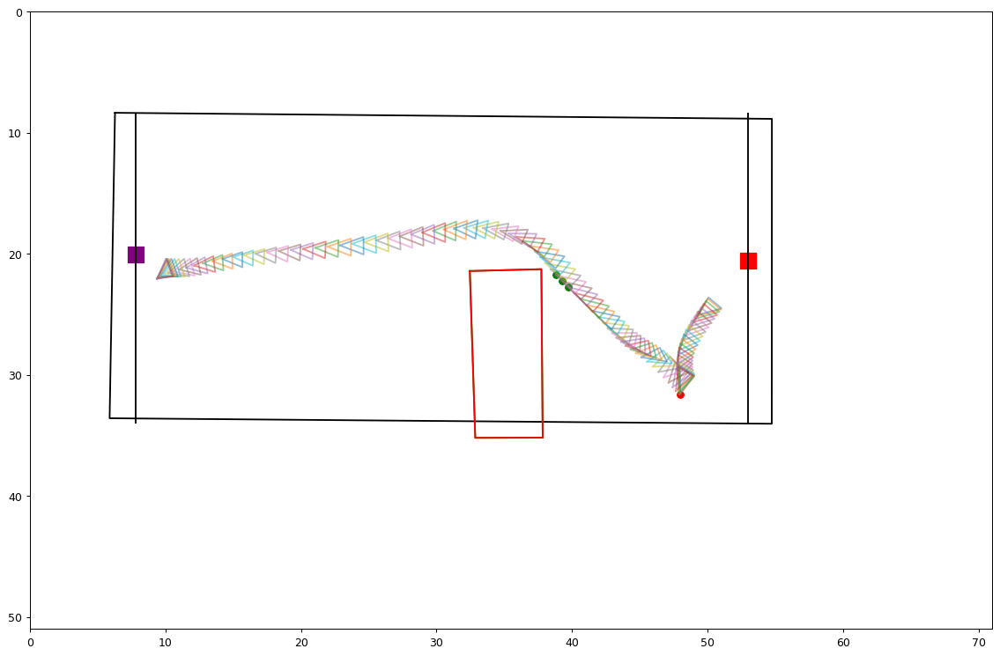

In [747]:

row = light_df.iloc[88]
fig = plt.figure(constrained_layout=False, figsize=(25, 16),dpi=90)
spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
ax1 = fig.add_subplot(panel_1[0,0])
plot_arena(row,ax1)
ax1.plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                            [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
ax1.plot([np.nanmedian(row['obstacleTL_x_cm']), np.nanmedian(row['obstacleTR_x_cm']), np.nanmedian(row['obstacleBR_x_cm']), np.nanmedian(row['obstacleBL_x_cm']),np.nanmedian(row['obstacleTL_x_cm'])],
                            [np.nanmedian(row['obstacleTL_y_cm']), np.nanmedian(row['obstacleTR_y_cm']), np.nanmedian(row['obstacleBR_y_cm']), np.nanmedian(row['obstacleBL_y_cm']),np.nanmedian(row['obstacleTL_y_cm'])],color='red')
#ax1.plot(row['nose_x_cm'],row['nose_y_cm'])
#ax1.scatter(row['ts_nose_x_cm'][max-1],row['i'][max-1],c = 'black')

ax1.scatter(row['ts_nose_x_cm'][20],row['ts_nose_y_cm'][20],c = 'red')
ax1.scatter(row['ts_nose_x_cm'][pos_inds],row['ts_nose_y_cm'][pos_inds],c = 'green')
ax1.plot([row['ts_nose_x_cm'],row['ts_rightear_x_cm'],row['ts_leftear_x_cm'],row['ts_nose_x_cm']],[row['ts_nose_y_cm'],row['ts_rightear_y_cm'],row['ts_leftear_y_cm'],row['ts_nose_y_cm']],alpha=.5)
plt.show()
#ax1.scatter(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = 'black')


In [863]:
angle_to_open_corner(test,5)

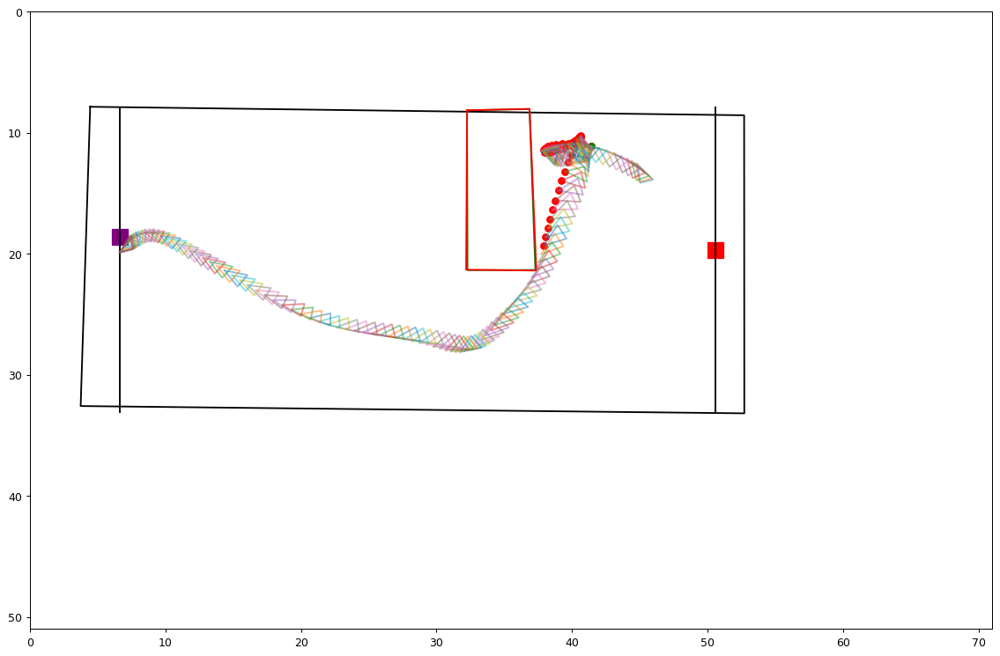

In [872]:

row = test.iloc[55]
fig = plt.figure(constrained_layout=False, figsize=(25, 16),dpi=90)
spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
ax1 = fig.add_subplot(panel_1[0,0])
plot_arena(row,ax1)
ax1.plot([row['gt_obstacleTL_x_cm'], row['gt_obstacleTR_x_cm'], row['gt_obstacleBR_x_cm'], row['gt_obstacleBL_x_cm'],row['gt_obstacleTL_x_cm']],
                            [row['gt_obstacleTL_y_cm'], row['gt_obstacleTR_y_cm'], row['gt_obstacleBR_y_cm'], row['gt_obstacleBL_y_cm'],row['gt_obstacleTL_y_cm']],color='green')
ax1.plot([np.nanmedian(row['obstacleTL_x_cm']), np.nanmedian(row['obstacleTR_x_cm']), np.nanmedian(row['obstacleBR_x_cm']), np.nanmedian(row['obstacleBL_x_cm']),np.nanmedian(row['obstacleTL_x_cm'])],
                            [np.nanmedian(row['obstacleTL_y_cm']), np.nanmedian(row['obstacleTR_y_cm']), np.nanmedian(row['obstacleBR_y_cm']), np.nanmedian(row['obstacleBL_y_cm']),np.nanmedian(row['obstacleTL_y_cm'])],color='red')
#ax1.plot(row['nose_x_cm'],row['nose_y_cm'])
#ax1.scatter(row['ts_nose_x_cm'][max-1],row['i'][max-1],c = 'black')

ax1.scatter(row['ts_nose_x_cm'][pos_inds],row['ts_nose_y_cm'][pos_inds],c = 'red')
ax1.scatter(row['ts_nose_x_cm'][8],row['ts_nose_y_cm'][8],c = 'green')
ax1.plot([row['ts_nose_x_cm'],row['ts_rightear_x_cm'],row['ts_leftear_x_cm'],row['ts_nose_x_cm']],[row['ts_nose_y_cm'],row['ts_rightear_y_cm'],row['ts_leftear_y_cm'],row['ts_nose_y_cm']],alpha=.5)
plt.show()
#ax1.scatter(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = 'black')

In [23]:


def calculate_vector_between_points(point1, point2):
    """
    Calculate the vector between two (x, y) points.

    Args:
        point1 (tuple or list): The coordinates of the first point (x1, y1).
        point2 (tuple or list): The coordinates of the second point (x2, y2).

    Returns:
        np.ndarray: The vector as a NumPy array [dx, dy].
    """
    x1, y1 = point1
    x2, y2 = point2
    
    dx = x2 - x1
    dy = y2 - y1
    
    vector = np.array([dx, dy])
    
    return vector

# Example usage:
point1 = (1, 2)
point2 = (4, 5)

vector = calculate_vector_between_points(point1, point2)
vector1 = calculate_vector_between_points(point2, point1)
print("Vector:", vector,vector1)

Vector: [3 3] [-3 -3]


In [24]:
plot_angle_to_corner_histogram_sample(light_df,2,7,'light')

NameError: name 'angle_between_vectors' is not defined

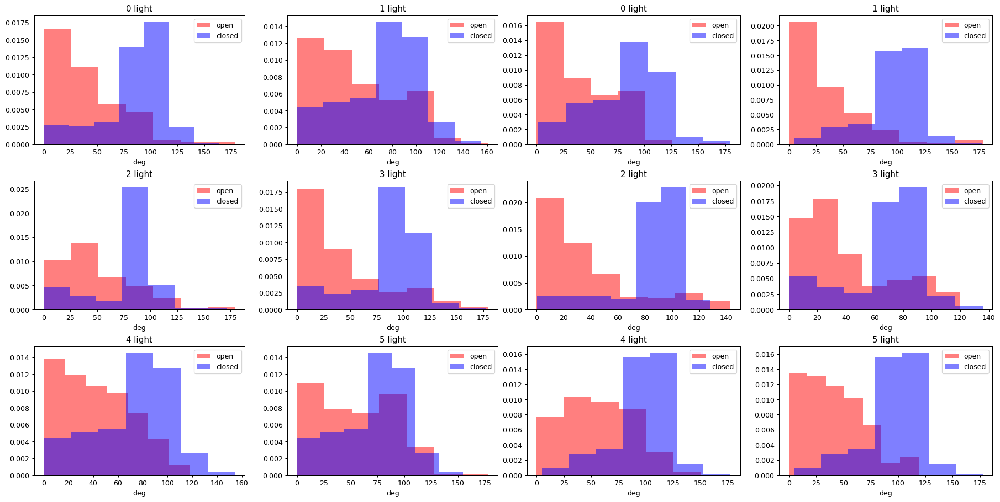

In [1080]:
plot_angle_to_corner_histogram_sample(light_df,5,7,'light')

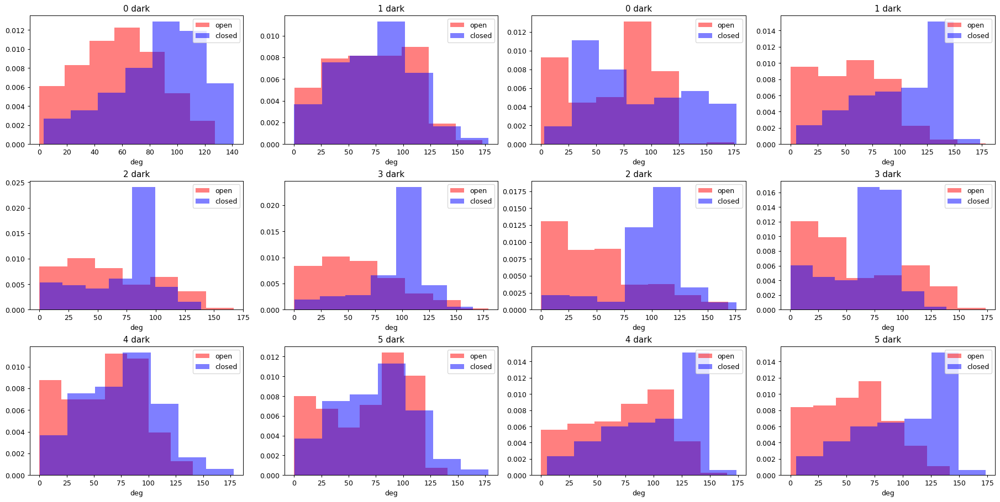

In [1072]:
plot_angle_to_corner_histogram_sample(dark_df,3,7,'dark')

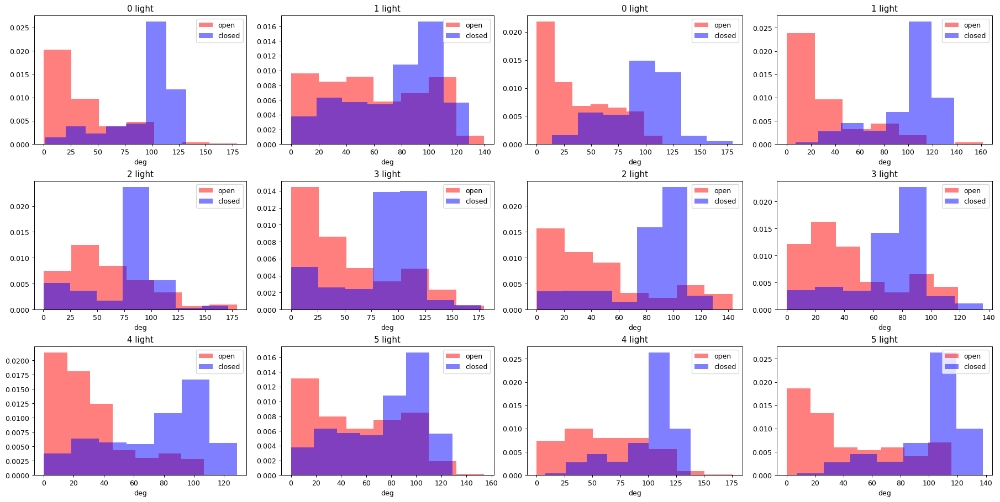

In [1051]:
plot_angle_to_corner_histogram_sample(light_df,3,7,'light')

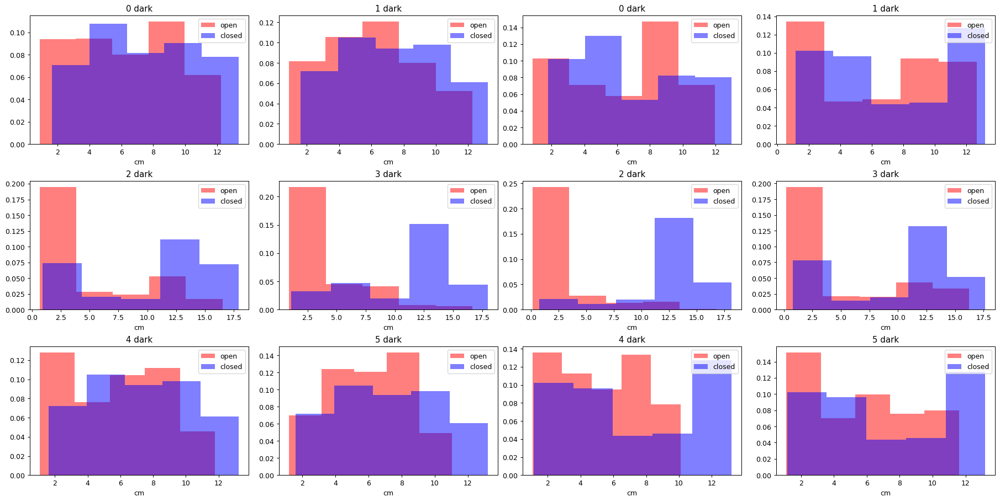

In [998]:
plot_distance_from_corner_histogram_sample(dark_df,2,5,'dark')

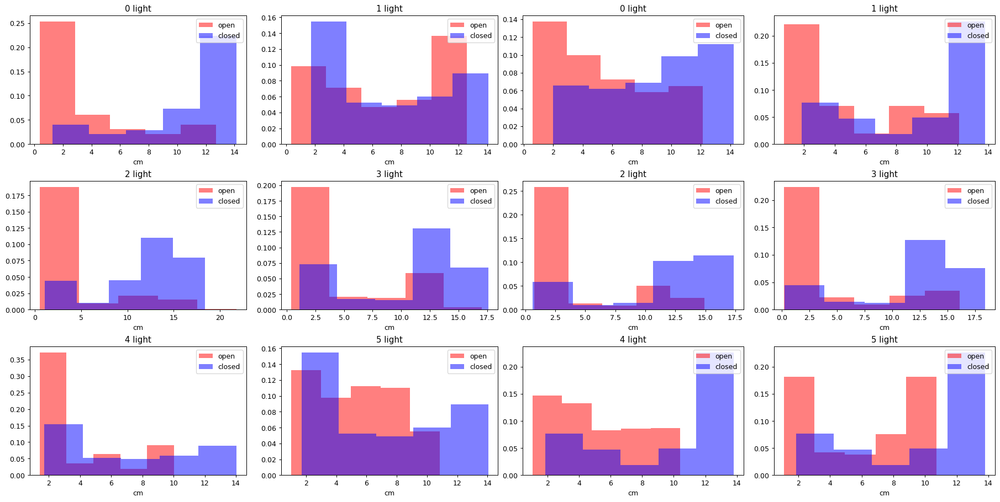

In [996]:
plot_distance_from_corner_histogram_sample(light_df,2,5,'light')


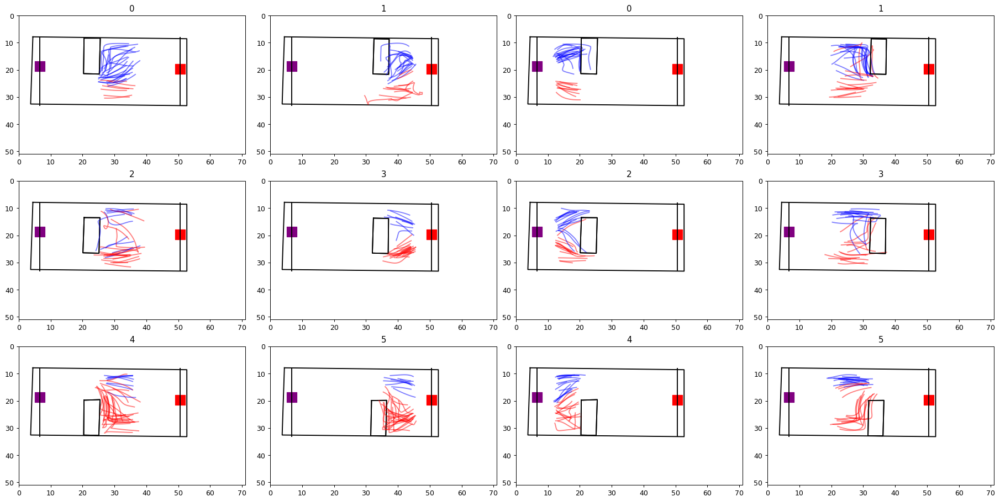

In [1083]:
plot_trials_sample_thresh(dark_df,30,10)

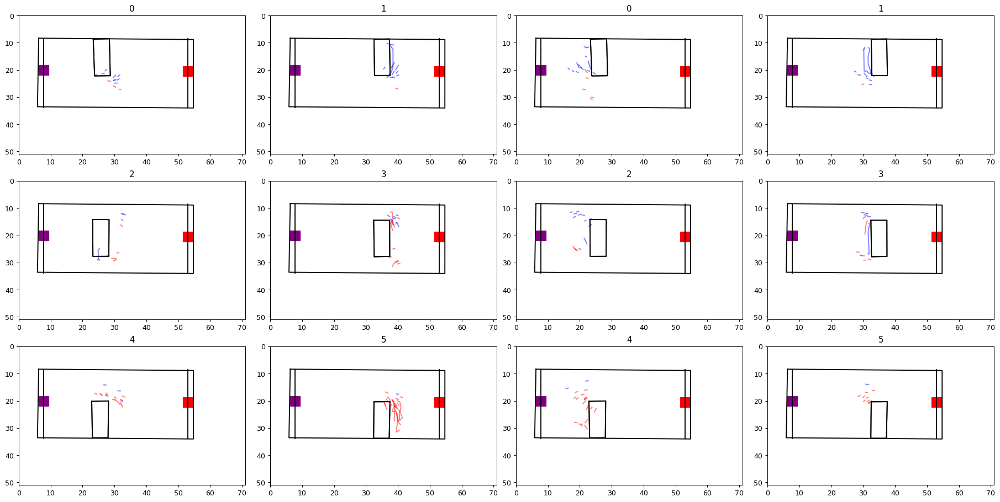

In [48]:
plot_trials_sample_thresh(light_df,30,2)

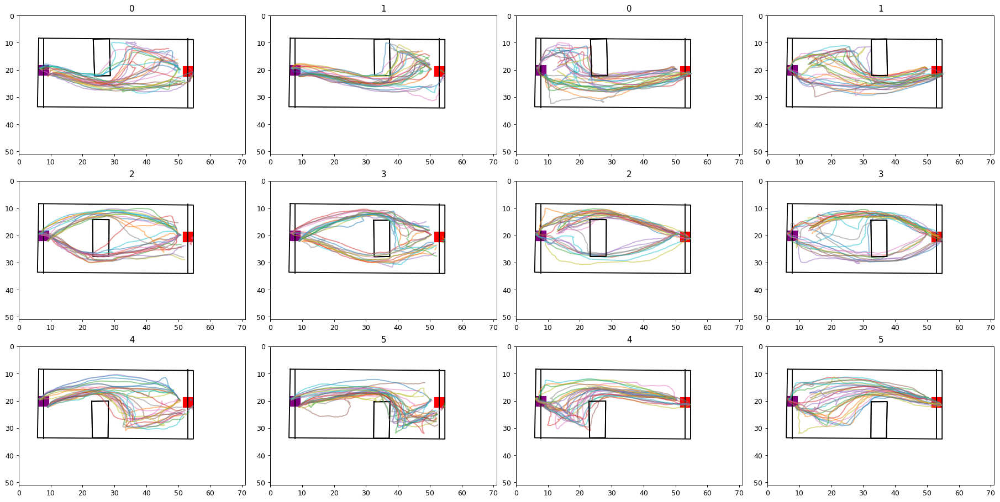

In [11]:
plot_trials_sample(light_df,30)

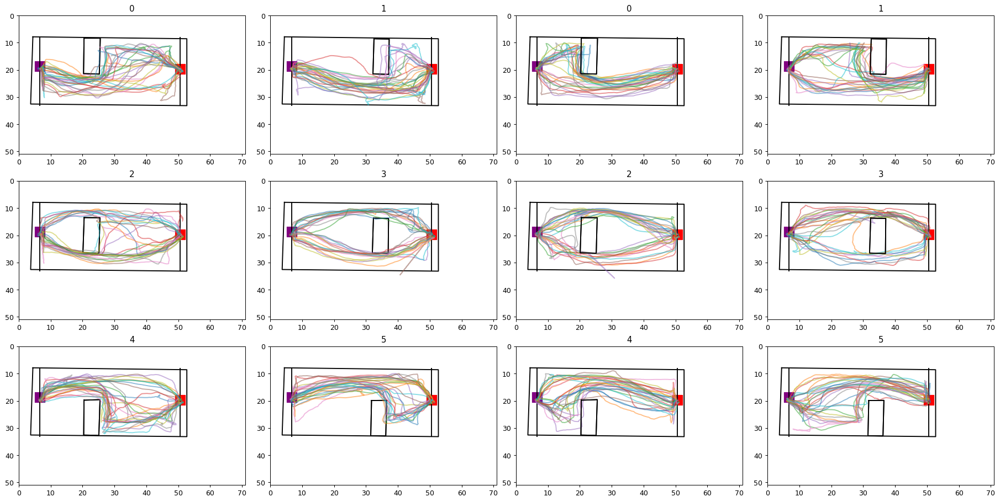

In [12]:
plot_trials_sample(dark_df,30)

In [19]:
def compare_trials(df1,df2,cluster_num,sample_num):
    """compare trials from two dataframes. Inputs df1(light):dataframe , df2(dark):dataframe, cluster_num:int,sample_num:int
    """
    light_df = df1[df1['obstacle_cluster']==cluster_num]
    dark_df = df2[df2['obstacle_cluster']==cluster_num]

    fig = plt.figure(constrained_layout=False, figsize=(15, 8),dpi=90)
    
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)


    """df1:light """
    panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    plot_arena(df1,ax1)
    ax2 = fig.add_subplot(panel_1[1,0])
    plot_arena(df1,ax2)

    right_axs = [ax1,ax2]

    """df2:dark """
    panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
    ax3 = fig.add_subplot(panel_2[0,0])
    plot_arena(df2,ax3)
    ax4 = fig.add_subplot(panel_2[1,0])
    plot_arena(df2,ax4)

    left_axs = [ax3,ax4]
    

    """plot trials light"""
    for direction, direction_frame in light_df.groupby(['odd']):
        if direction == 'right':
            plot_obstacle(direction_frame,ax1,cluster_num)
            sample_frame = direction_frame.sample(sample_num)
            for ind,row in sample_frame.iterrows():
                ax1.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)
            
        else:    
            plot_obstacle(direction_frame,ax2,cluster_num)
            sample_frame = direction_frame.sample(sample_num)
            for ind,row in sample_frame.iterrows():
                ax2.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)
        
    
    """plot trials dark"""
    for direction, direction_frame in dark_df.groupby(['odd']):
        if direction == 'right':
            plot_obstacle(direction_frame,ax3,cluster_num)
            sample_frame = direction_frame.sample(sample_num)
            for ind,row in sample_frame.iterrows():
                ax3.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)
        else:    
            plot_obstacle(direction_frame,ax4,cluster_num)
            sample_frame = direction_frame.sample(sample_num)
            for ind,row in sample_frame.iterrows():
                ax4.plot(row['nose_x_cm'],row['nose_y_cm'],alpha = .5)

def plot_single_cluster(df,key,cluster_num,sample_num):
    """plots n trails from single cluster colored by key variable
       inputs(df:dataframe, key:column name string,num_sample:int)
    """
    color_map = create_color_dict(df,key,'dark')
    fig = plt.figure(constrained_layout=False, figsize=(12, 4),dpi=90)
    #fig.suptitle('by ' + key + ' '+ 'and ' +'obstalce ')
    spec2 = gridspec.GridSpec(ncols=1, nrows=1, figure=fig)
    panel_1 = gridspec.GridSpecFromSubplotSpec(1,2,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    plot_arena(df,ax1)
    ax2 = fig.add_subplot(panel_1[0,1])
    plot_arena(df,ax2)
    markers = [plt.Line2D([0,0],[0,0],color=color, marker='o', linestyle='') for color in color_map.values()]
    ax1.legend(markers, color_map.keys(), numpoints=1,title = 'right')
    for direction, direction_frame in df.groupby(['odd']):
        if direction == 'right':
            cluster_frame_right = direction_frame[direction_frame['obstacle_cluster']==cluster_num].sample(sample_num)
            #print(cluster_frame_right.gt_obstacleTR_y_cm,np.mean(cluster_frame_right.gt_obstacleTR_y_cm))
            plot_obstacle(cluster_frame_right,ax1,cluster_num)
            for ind,row in cluster_frame_right.iterrows():
                color = color_map.get(pd.unique(row[key]).item())
                ax1.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = color,alpha = .5)
        else:
            cluster_frame_left = direction_frame[direction_frame['obstacle_cluster']==cluster_num].sample(sample_num)
            plot_obstacle(cluster_frame_left,ax2,cluster_num)
            for ind,row in cluster_frame_left.iterrows():
                color = color_map.get(pd.unique(row[key]).item())
                ax2.plot(row['ts_nose_x_cm'],row['ts_nose_y_cm'],c = color,alpha = .5)
    #print(cluster_frame_right.gt_obstacleTR_y_cm,np.mean(cluster_frame_right.gt_obstacleTR_y_cm))
    return cluster_frame_right,cluster_frame_left

def calculate_slope(x1, y1, x2, y2):
    # Check for division by zero (vertical line)
    if np.isclose(x2, x1, rtol=1e-6):
        raise ValueError("The line is vertical, and the slope is undefined.")
    
    # Create NumPy arrays for the points
    point1 = np.array([x1, y1])
    point2 = np.array([x2, y2])
    
    # Calculate the slope using NumPy operations
    slope = (point2[1] - point1[1]) / (point2[0] - point1[0])
    
    return slope

def calculate_speed(x_positions, y_positions, fps):
    # Calculate the change in positions between frames
    delta_x = np.diff(x_positions)
    delta_y = np.diff(y_positions)
    
    # Calculate the Euclidean distance between consecutive positions
    distance = np.sqrt(delta_x**2 + delta_y**2)
    
    # Calculate the time interval between frames
    time_interval = 1 / fps
    
    # Calculate the speed in cm/s
    speed = distance / time_interval
    
    return speed,distance


def calculate_slope(x1, y1, x2, y2):
    # Check for division by zero (vertical line)
    if x1 == x2:
        raise ValueError("The line is vertical, and the slope is undefined.")
    
    # Calculate the slope using the formula
    slope = (y2 - y1) / (x2 - x1)
    
    return slope
def angle_between_vectors(vector1, vector2):
    # Convert input lists to NumPy arrays for vector operations
    vector1 = np.array(vector1)
    vector2 = np.array(vector2)
    
    # Calculate the dot product of the two vectors
    dot_product = np.dot(vector1, vector2)
    
    # Calculate the magnitudes (norms) of each vector
    magnitude1 = np.linalg.norm(vector1)
    magnitude2 = np.linalg.norm(vector2)
    
    # Calculate the cosine of the angle between the vectors
    cosine_angle = dot_product / (magnitude1 * magnitude2)
    
    # Use arccosine to calculate the angle in radians
    angle_radians = np.arccos(cosine_angle)
    
    # Calculate the angle in degrees
    angle_degrees = np.degrees(angle_radians)
    
    return angle_radians, angle_degrees



def create_vector_from_origin(slope, magnitude=1):
    x_component = 1
    y_component = slope * x_component
    vector_magnitude = magnitude
    scaling_factor = vector_magnitude / ((x_component**2 + y_component**2)**0.5)
    x_component *= scaling_factor
    y_component *= scaling_factor
    return [x_component, y_component]



def get_head_angle(df):
    for ind, row in df.iterrows():
        leftear_x = row['ts_leftear_x_cm']
        leftear_y = row['ts_leftear_y_cm']
        rightear_x = row['ts_rightear_x_cm']
        rightear_y = row['ts_rightear_y_cm']
        nose_x = row['ts_nose_x_cm']
        nose_y = row['ts_nose_y_cm']
        angs = []
        for step in range(len(leftear_x)):
            #ang = np.arctan2(np.mean([leftear_y[step],rightear_y[step]])-nose_y[step],np.mean([leftear_x[step],rightear_x[step]])-nose_x[step])
            ang = np.arctan2(nose_y[step]-np.mean([leftear_y[step],rightear_y[step]]),nose_x[step]-np.mean([leftear_x[step],rightear_x[step]]))
            angs.append(ang)
        df.at[ind, 'head_angle'] = np.array(angs).astype(object)

def calculate_angular_velocities(angle_series, time_series):
    """
    Calculate angular velocities in radians per second for a time series of angles.

    Args:
    angle_series (numpy.ndarray): Array of angular positions in radians over time.
    time_series (numpy.ndarray): Array of time values corresponding to each angle in seconds.

    Returns:
    numpy.ndarray: Array of angular velocities in radians per second.
    """
    if len(angle_series) != len(time_series):
        raise ValueError("Length of angle_series and time_series must be the same.")
    
    # Calculate the difference in angles between consecutive time steps
    angular_displacements = np.diff(angle_series)
    
    # Calculate the time differences between consecutive time steps
    time_diffs = np.diff(time_series)
    
    # Calculate angular velocities by dividing angular displacements by time differences
    angular_velocities = angular_displacements / time_diffs
    
    return angular_velocities



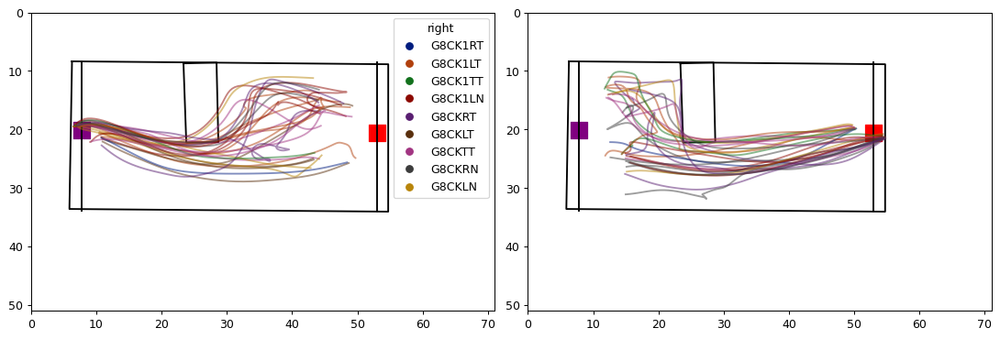

In [9]:
cluster_frame_right,cluster_frame_left = plot_single_cluster(light_df,'animal',0,30)

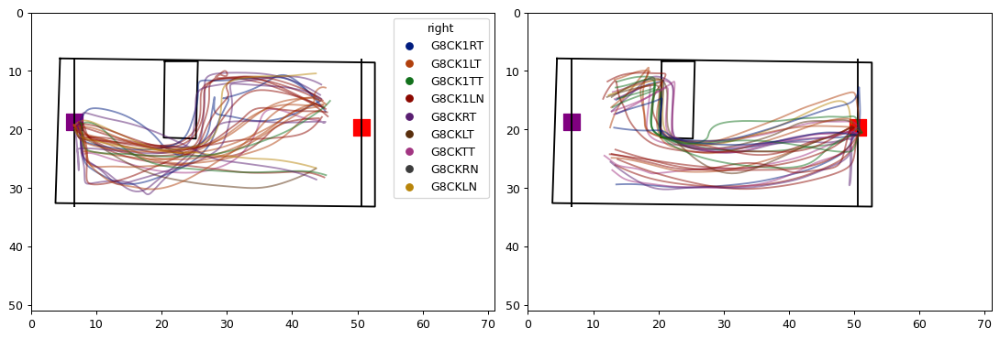

In [10]:
cluster_frame_right_dark,cluster_frame_left_dark = plot_single_cluster(dark_df,'animal',0,30)

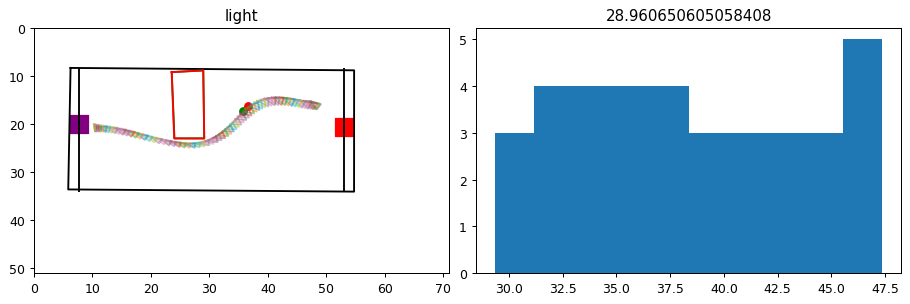

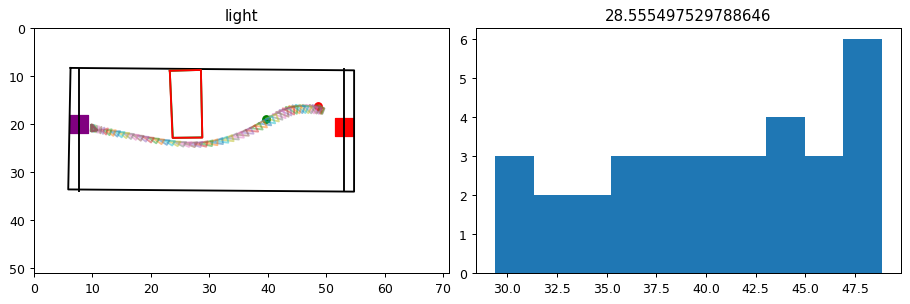

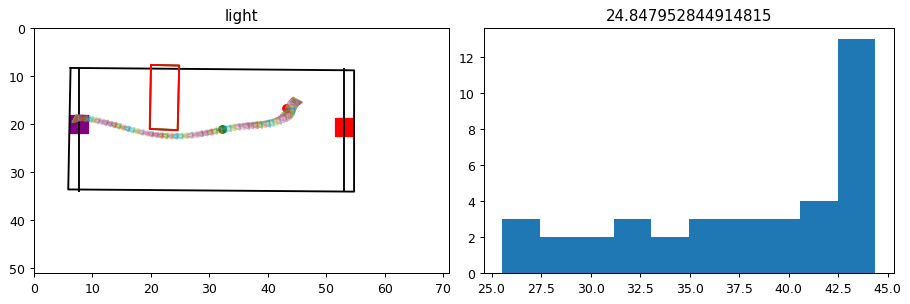

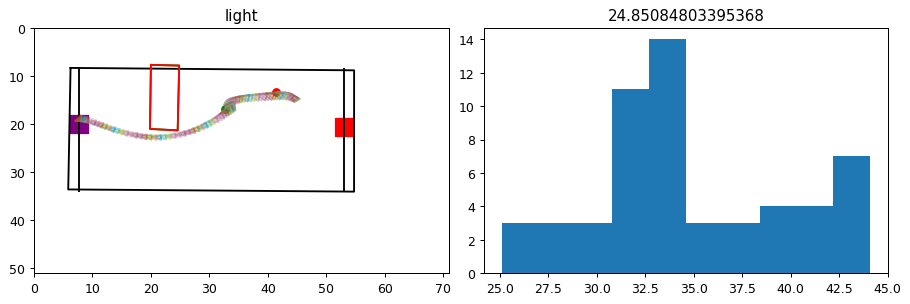

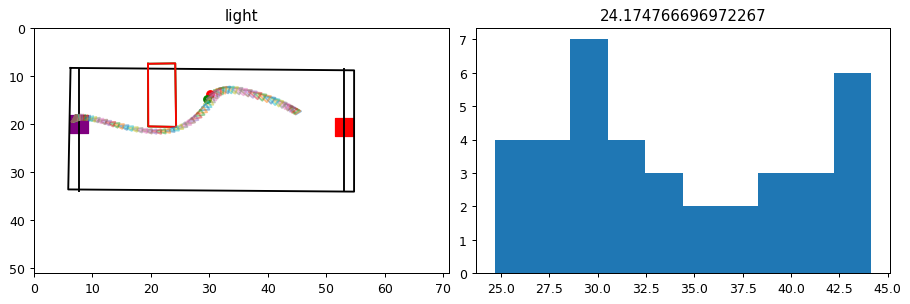

...

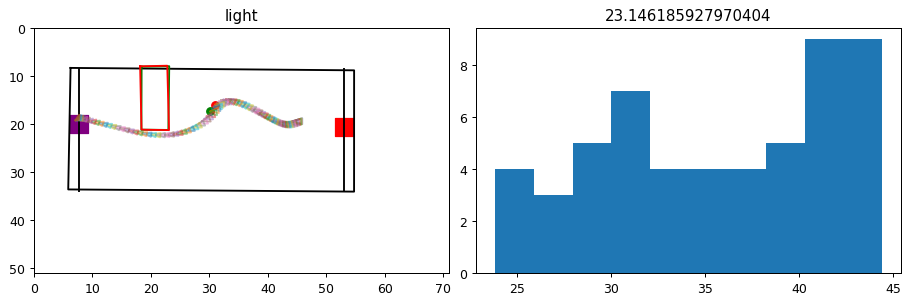

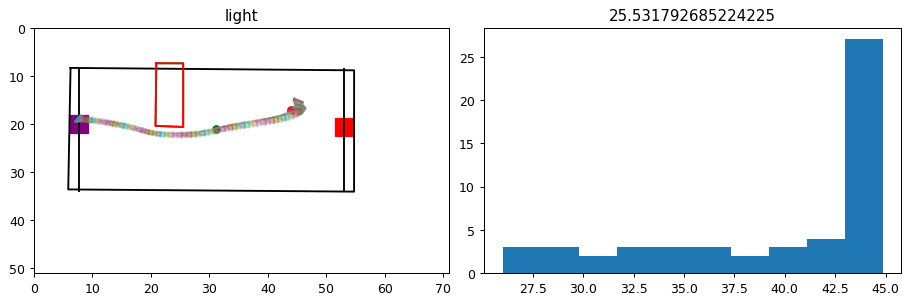

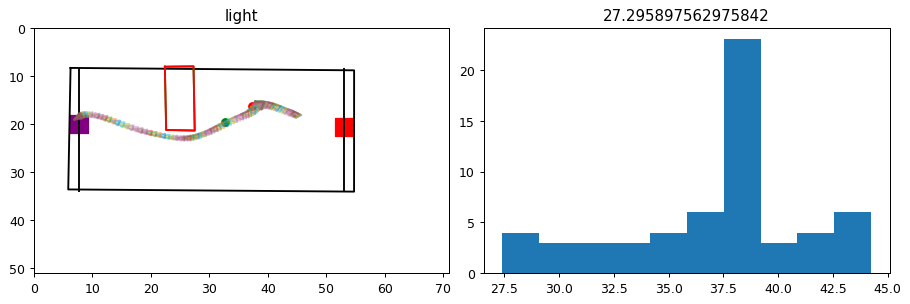

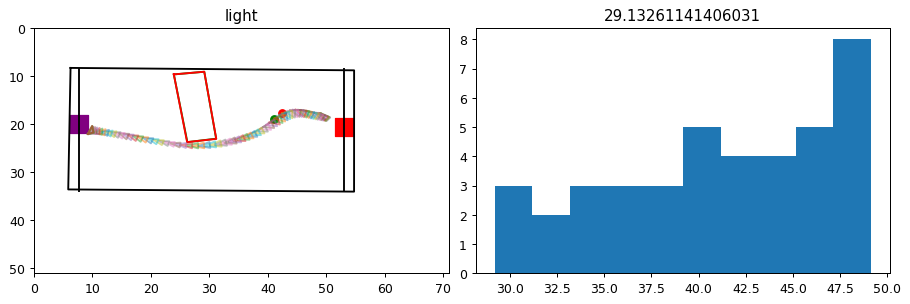

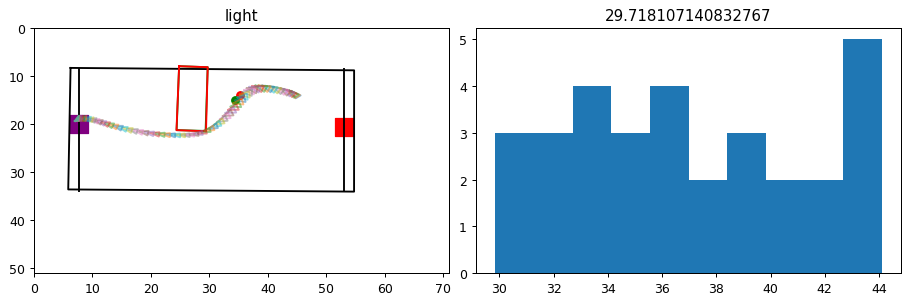

In [233]:
get_head_angle(cluster_frame_right)
for i in list(range(len(cluster_frame_right))):
    trial =cluster_frame_right.iloc[i]
    angles = []
    slopes = []
    angles_basis = []
    speed,distance = calculate_speed(trial['ts_nose_x_cm'].astype(float),trial['ts_nose_y_cm'].astype(float),60)
    for i in list(range(len(trial['ts_nose_x_cm']))):
        slope = calculate_slope(trial['ts_nose_x_cm'][i],trial['ts_nose_y_cm'][i],np.mean([trial['ts_rightear_x_cm'][i],trial['ts_leftear_x_cm'][i]]),np.mean([trial['ts_rightear_y_cm'][i],trial['ts_leftear_y_cm'][i]]))
        slopes.append(slope)
        magnitude = 2
        vector = create_vector_from_origin(0, magnitude)
        vector2 =  create_vector_from_origin(slope, magnitude)
        if slope > 0:
            angles.append((angle_between_vectors(vector2, vector)[1]))
        else:
            #print('neg')
            angles.append(-abs(angle_between_vectors(vector2, vector)[1]))
    for i in list(range(len(trial['ts_nose_x_cm']))):
        nose = (trial['ts_nose_x_cm'][i], trial['ts_nose_y_cm'][i])
        ear_center = (np.mean([trial['ts_rightear_x_cm'][i],trial['ts_leftear_x_cm'][i]]), np.mean([trial['ts_rightear_y_cm'][i],trial['ts_leftear_y_cm'][i]]))
        mouse_vector = create_vector_from_two_points(ear_center, nose)
        top = (trial['arenaTL_x_cm'],trial['arenaTL_y_cm'])
        bottom= (trial['arenaBL_x_cm'],trial['arenaBL_y_cm'])
        wall_center = calculate_center(top,bottom)
        basis_vector = create_vector_from_two_points(ear_center, wall_center)
        angles_basis.append(angle_between_vectors(mouse_vector,basis_vector)[1])
        
    
    
    
    angs = trial['head_angle']
    max = np.argmax(calculate_angular_velocities(angs,list(range(len(angs)))))
    x_positions = trial['ts_nose_x_cm'].astype(float)  # Replace with your x positions in cm
    y_positions = trial['ts_nose_y_cm'].astype(float)  # Replace with your y positions in cm
    fps = 60  # Frames per second
    speeds,distance = calculate_speed(x_positions, y_positions, fps)
    #min = np.argmin(speeds[np.where(trial['ts_nose_x_cm']<trial['gt_obstacleBL_x_cm'])[0]])
    fig = plt.figure(constrained_layout=False, figsize=(10, 6),dpi=90)
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    ax1.set_title(str('light'))
    plot_arena(trial,ax1)
    ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                                [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
    ax1.plot([np.nanmedian(trial['obstacleTL_x_cm']), np.nanmedian(trial['obstacleTR_x_cm']), np.nanmedian(trial['obstacleBR_x_cm']), np.nanmedian(trial['obstacleBL_x_cm']),np.nanmedian(trial['obstacleTL_x_cm'])],
                                [np.nanmedian(trial['obstacleTL_y_cm']), np.nanmedian(trial['obstacleTR_y_cm']), np.nanmedian(trial['obstacleBR_y_cm']), np.nanmedian(trial['obstacleBL_y_cm']),np.nanmedian(trial['obstacleTL_y_cm'])],color='red')
    #ax1.plot(trial['nose_x_cm'],trial['nose_y_cm'])
    #ax1.scatter(trial['ts_nose_x_cm'][max-1],trial['i'][max-1],c = 'black')
    min = np.argmin(calculate_angular_velocities(trial['angle_to_leftport'][np.where(trial['ts_nose_x_cm']>trial['gt_obstacleTR_x_cm'])],list(range(len(trial['angle_to_leftport'][np.where(trial['ts_nose_x_cm']>trial['gt_obstacleTR_x_cm'])])))))
    max = np.argmax(calculate_angular_velocities(trial['angle_to_leftport'][np.where(trial['ts_nose_x_cm']>trial['gt_obstacleTR_x_cm'])],list(range(len(trial['angle_to_leftport'][np.where(trial['ts_nose_x_cm']>trial['gt_obstacleTR_x_cm'])])))))
    ax1.scatter(trial['ts_nose_x_cm'][min],trial['ts_nose_y_cm'][min],c = 'red')
    ax1.scatter(trial['ts_nose_x_cm'][max],trial['ts_nose_y_cm'][max],c = 'green')
    ax1.plot([trial['ts_nose_x_cm'],trial['ts_rightear_x_cm'],trial['ts_leftear_x_cm'],trial['ts_nose_x_cm']],[trial['ts_nose_y_cm'],trial['ts_rightear_y_cm'],trial['ts_leftear_y_cm'],trial['ts_nose_y_cm']],alpha=.5)
    #ax1.scatter(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],c = 'black')
    panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
    ax2 = fig.add_subplot(panel_2[0,0])
    ax2.hist(trial['ts_nose_x_cm'][np.where(trial['ts_nose_x_cm']> trial['gt_obstacleTR_x_cm'])])
    ax2.set_title(str(trial['gt_obstacleTR_x_cm']))


    

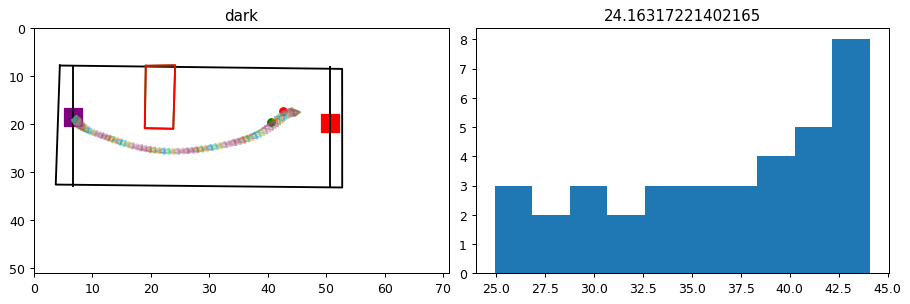

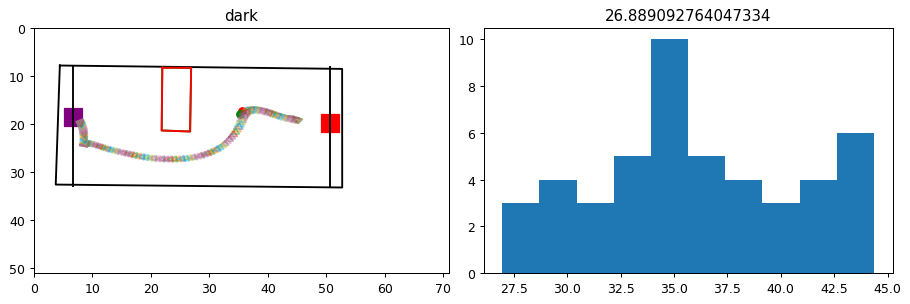

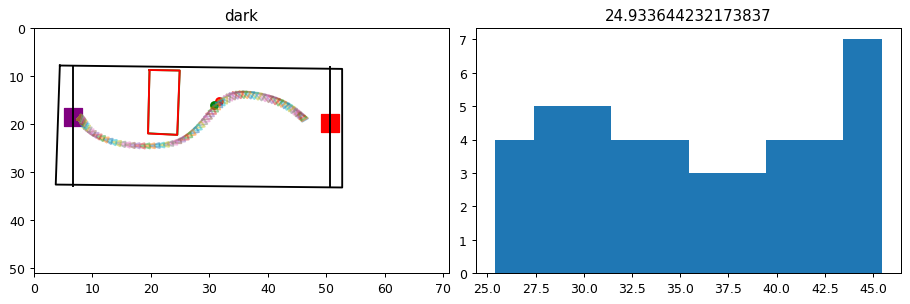

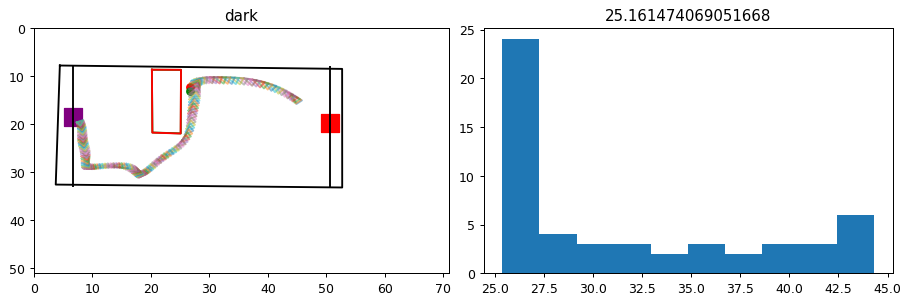

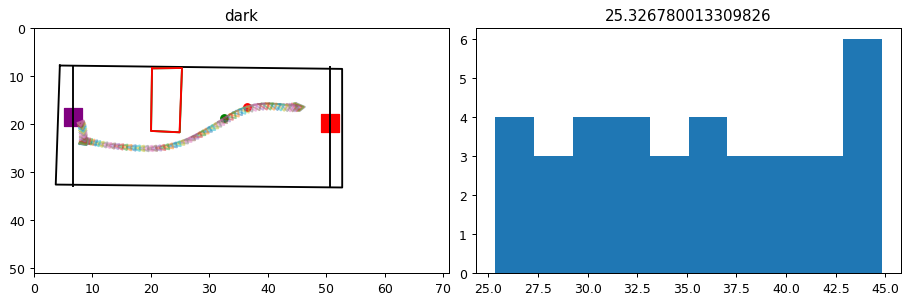

...

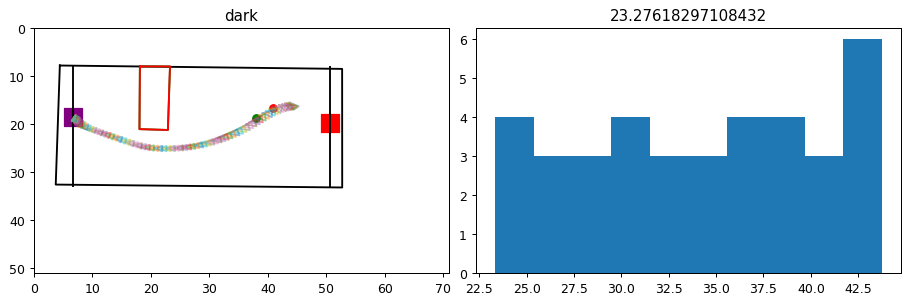

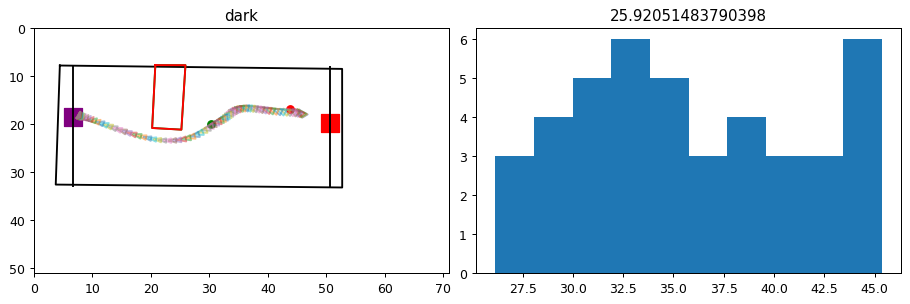

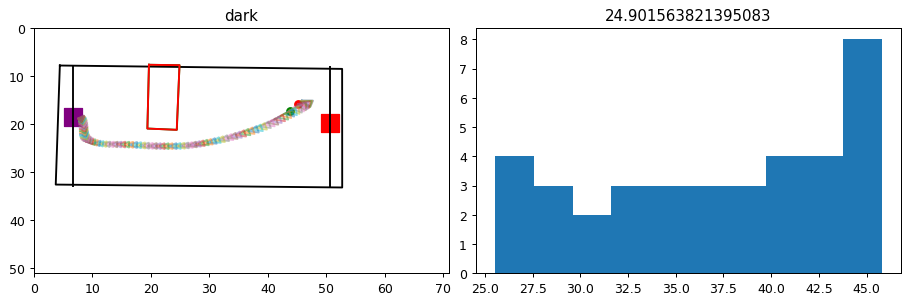

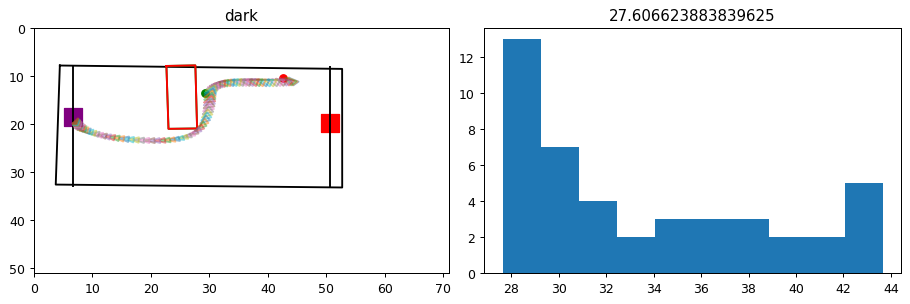

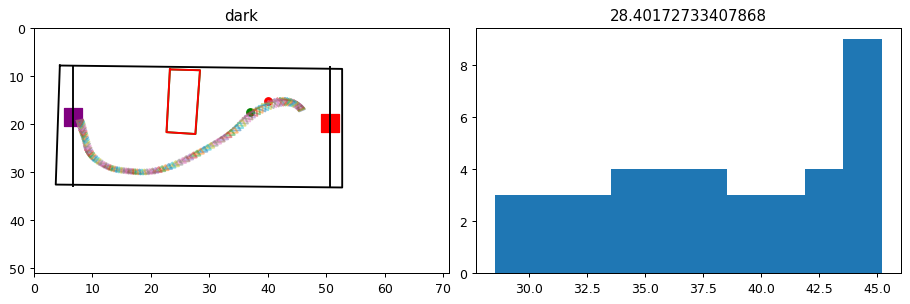

In [260]:
get_head_angle(cluster_frame_right_dark)
for i in list(range(len(cluster_frame_right_dark))):
    trial =cluster_frame_right_dark.iloc[i]
    angles = []
    slopes = []
    angles_basis = []
    speed,distance = calculate_speed(trial['ts_nose_x_cm'].astype(float),trial['ts_nose_y_cm'].astype(float),60)
    for i in list(range(len(trial['ts_nose_x_cm']))):
        slope = calculate_slope(trial['ts_nose_x_cm'][i],trial['ts_nose_y_cm'][i],np.mean([trial['ts_rightear_x_cm'][i],trial['ts_leftear_x_cm'][i]]),np.mean([trial['ts_rightear_y_cm'][i],trial['ts_leftear_y_cm'][i]]))
        slopes.append(slope)
        magnitude = 2
        vector = create_vector_from_origin(0, magnitude)
        vector2 =  create_vector_from_origin(slope, magnitude)
        if slope > 0:
            angles.append((angle_between_vectors(vector2, vector)[1]))
        else:
            #print('neg')
            angles.append(-abs(angle_between_vectors(vector2, vector)[1]))
    for i in list(range(len(trial['ts_nose_x_cm']))):
        nose = (trial['ts_nose_x_cm'][i], trial['ts_nose_y_cm'][i])
        ear_center = (np.mean([trial['ts_rightear_x_cm'][i],trial['ts_leftear_x_cm'][i]]), np.mean([trial['ts_rightear_y_cm'][i],trial['ts_leftear_y_cm'][i]]))
        mouse_vector = create_vector_from_two_points(ear_center, nose)
        top = (trial['arenaTL_x_cm'],trial['arenaTL_y_cm'])
        bottom= (trial['arenaBL_x_cm'],trial['arenaBL_y_cm'])
        wall_center = calculate_center(top,bottom)
        basis_vector = create_vector_from_two_points(ear_center, wall_center)
        angles_basis.append(angle_between_vectors(mouse_vector,basis_vector)[1])
        
    
    
    
    angs = trial['head_angle']
    max = np.argmax(calculate_angular_velocities(angs,list(range(len(angs)))))
    x_positions = trial['ts_nose_x_cm'].astype(float)  # Replace with your x positions in cm
    y_positions = trial['ts_nose_y_cm'].astype(float)  # Replace with your y positions in cm
    fps = 60  # Frames per second
    speeds,distance = calculate_speed(x_positions, y_positions, fps)
    #min = np.argmin(speeds[np.where(trial['ts_nose_x_cm']<trial['gt_obstacleBL_x_cm'])[0]])
    fig = plt.figure(constrained_layout=False, figsize=(10, 6),dpi=90)
    spec2 = gridspec.GridSpec(ncols=2, nrows=1, figure=fig)
    panel_1 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[0])
    ax1 = fig.add_subplot(panel_1[0,0])
    ax1.set_title('dark')
    plot_arena(trial,ax1)
    ax1.plot([trial['gt_obstacleTL_x_cm'], trial['gt_obstacleTR_x_cm'], trial['gt_obstacleBR_x_cm'], trial['gt_obstacleBL_x_cm'],trial['gt_obstacleTL_x_cm']],
                                [trial['gt_obstacleTL_y_cm'], trial['gt_obstacleTR_y_cm'], trial['gt_obstacleBR_y_cm'], trial['gt_obstacleBL_y_cm'],trial['gt_obstacleTL_y_cm']],color='green')
    ax1.plot([np.nanmedian(trial['obstacleTL_x_cm']), np.nanmedian(trial['obstacleTR_x_cm']), np.nanmedian(trial['obstacleBR_x_cm']), np.nanmedian(trial['obstacleBL_x_cm']),np.nanmedian(trial['obstacleTL_x_cm'])],
                                [np.nanmedian(trial['obstacleTL_y_cm']), np.nanmedian(trial['obstacleTR_y_cm']), np.nanmedian(trial['obstacleBR_y_cm']), np.nanmedian(trial['obstacleBL_y_cm']),np.nanmedian(trial['obstacleTL_y_cm'])],color='red')
    #ax1.plot(trial['nose_x_cm'],trial['nose_y_cm'])
    #ax1.scatter(trial['ts_nose_x_cm'][max-1],trial['i'][max-1],c = 'black')
    min = np.argmin(calculate_angular_velocities(trial['angle_to_leftport'][np.where(trial['ts_nose_x_cm']>trial['gt_obstacleTR_x_cm'])],list(range(len(trial['angle_to_leftport'][np.where(trial['ts_nose_x_cm']>trial['gt_obstacleTR_x_cm'])])))))
    max = np.argmax(calculate_angular_velocities(trial['angle_to_leftport'][np.where(trial['ts_nose_x_cm']>trial['gt_obstacleTR_x_cm'])],list(range(len(trial['angle_to_leftport'][np.where(trial['ts_nose_x_cm']>trial['gt_obstacleTR_x_cm'])])))))
    ax1.scatter(trial['ts_nose_x_cm'][min],trial['ts_nose_y_cm'][min],c = 'red')
    ax1.scatter(trial['ts_nose_x_cm'][max],trial['ts_nose_y_cm'][max],c = 'green')
    ax1.plot([trial['ts_nose_x_cm'],trial['ts_rightear_x_cm'],trial['ts_leftear_x_cm'],trial['ts_nose_x_cm']],[trial['ts_nose_y_cm'],trial['ts_rightear_y_cm'],trial['ts_leftear_y_cm'],trial['ts_nose_y_cm']],alpha=.5)
    #ax1.scatter(trial['ts_nose_x_cm'],trial['ts_nose_y_cm'],c = 'black')
    panel_2 = gridspec.GridSpecFromSubplotSpec(2,1,subplot_spec=spec2[1])
    ax2 = fig.add_subplot(panel_2[0,0])
    ax2.hist(trial['ts_nose_x_cm'][np.where(trial['ts_nose_x_cm']> trial['gt_obstacleTR_x_cm'])])
    ax2.set_title(str( trial['gt_obstacleTR_x_cm']))



In [19]:
def get_head_angle(df):
    for ind, row in df.iterrows():
        leftear_x = row['ts_leftear_x_cm']
        leftear_y = row['ts_leftear_y_cm']
        rightear_x = row['ts_rightear_x_cm']
        rightear_y = row['ts_rightear_y_cm']
        nose_x = row['ts_nose_x_cm']
        nose_y = row['ts_nose_y_cm']
        angs = []
        for step in range(len(leftear_x)):
            #ang = np.arctan2(np.mean([leftear_y[step],rightear_y[step]])-nose_y[step],np.mean([leftear_x[step],rightear_x[step]])-nose_x[step])
            ang = np.arctan2(nose_y[step]-np.mean([leftear_y[step],rightear_y[step]]),nose_x[step]-np.mean([leftear_x[step],rightear_x[step]]))
            angs.append(ang)
        df.at[ind, 'head_angle'] = np.array(angs).astype(object)
import numpy as np

def calculate_angular_velocities(angle_series, time_series):
    """
    Calculate angular velocities in radians per second for a time series of angles.

    Args:
    angle_series (numpy.ndarray): Array of angular positions in radians over time.
    time_series (numpy.ndarray): Array of time values corresponding to each angle in seconds.

    Returns:
    numpy.ndarray: Array of angular velocities in radians per second.
    """
    if len(angle_series) != len(time_series):
        raise ValueError("Length of angle_series and time_series must be the same.")
    
    # Calculate the difference in angles between consecutive time steps
    angular_displacements = np.diff(angle_series)
    
    # Calculate the time differences between consecutive time steps
    time_diffs = np.diff(time_series)
    
    # Calculate angular velocities by dividing angular displacements by time differences
    angular_velocities = angular_displacements / time_diffs
    
    return angular_velocities

# Example usage:
angle_series = np.array([0.0, 1.0, 2.0, 4.0, 5.0])  # Angular positions in radians
time_series = np.array([0.0, 1.0, 2.0, 3.0, 4.0])     # Corresponding time values in seconds

angular_velocities = calculate_angular_velocities(angle_series, time_series)
print(angular_velocities)
